# Assignment 2

In this assignment you will create a coordinate-based multilayer perceptron in numpy from scratch. For each input image coordinate $(x,y)$, the model predicts the associated color $(r,g,b)$.

![Network diagram](https://user-images.githubusercontent.com/3310961/85066930-ad444580-b164-11ea-9cc0-17494679e71f.png)

You will then compare the following input feature mappings $\gamma (\mathbf{v})$.

- No mapping: $\gamma(\mathbf{v})= \mathbf{v}$.

- Basic mapping: $\gamma(\mathbf{v})=\left[ \cos(2 \pi \mathbf{v}),\sin(2 \pi \mathbf{v}) \right]^\mathrm{T}$.

- Gaussian Fourier feature mapping: $\gamma(\mathbf{v})= \left[ \cos(2 \pi \mathbf B \mathbf{v}), \sin(2 \pi \mathbf B \mathbf{v}) \right]^\mathrm{T}$,
where each entry in $\mathbf B \in \mathbb R^{m \times d}$ is sampled from $\mathcal N(0,\sigma^2)$.

Some notes to help you with that:

- You will implement the mappings in the helper functions `get_B_dict` and `input_mapping`.
- The basic mapping can be considered a case where $\mathbf B \in \mathbb R^{2 \times 2}$ is the indentity matrix.
- For this assignment, $d$ is 2 because the input coordinates in two dimensions.
- You can experiment with $m$, like $m=256$.
- You should show results for $\sigma$ value of 1.

Source: https://bmild.github.io/fourfeat/
This assignment is inspired by and built off of the authors' demo.

## Setup

### (Optional) Colab Setup
If you aren't using Colab, you can delete the following code cell. Replace the path below with the path in your Google Drive to the uploaded assignment folder. Mounting to Google Drive will allow you access the other .py files in the assignment folder and save outputs to this folder

In [50]:
# you will be prompted with a window asking to grant permissions
# click connect to google drive, choose your account, and click allow
from google.colab import drive
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [51]:
# fill in the path in your Google Drive in the string below. Note: do not escape slashes or spaces
import os
datadir = "/content/drive/MyDrive/CS444/assignment2/"
# if not os.path.exists(datadir):
#   !ln -s "/drive/MyDrive/CS444/assignment1/" $datadir
os.chdir(datadir)
!pwd

/content/drive/MyDrive/CS444/assignment2


### Imports

In [32]:
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import os, imageio
import cv2
import numpy as np

# imports /content/assignment2/models/neural_net.py if you mounted correctly
from models.neural_net import NeuralNetwork

# makes sure your NeuralNetwork updates as you make changes to the .py file
%load_ext autoreload
%autoreload 2

# sets default size of plots
%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Helper Functions

### Image Data and Feature Mappings (Fill in TODOs)

In [4]:
# Data loader - already done for you
def get_image(size=512, \
              image_url='https://bmild.github.io/fourfeat/img/lion_orig.png'):

  # Download image, take a square crop from the center
  img = imageio.imread(image_url)[..., :3] / 255.
  c = [img.shape[0]//2, img.shape[1]//2]
  r = 256
  img = img[c[0]-r:c[0]+r, c[1]-r:c[1]+r]

  if size != 512:
    img = cv2.resize(img, (size, size))

  plt.imshow(img)
  plt.show()

  # Create input pixel coordinates in the unit square
  coords = np.linspace(0, 1, img.shape[0], endpoint=False)
  x_test = np.stack(np.meshgrid(coords, coords), -1)
  test_data = [x_test, img]
  train_data = [x_test[::2, ::2], img[::2, ::2]]

  return train_data, test_data

In [5]:
## identity matrix, gaussian
a = np.identity(2)
b = np.random.normal(0, 1, [3, 2])
print(a)
print(b)

[[1. 0.]
 [0. 1.]]
[[-0.91398002 -0.22067024]
 [-0.3538523  -0.09573594]
 [-2.54612681 -1.99307449]]


In [6]:
# Create the mappings dictionary of matrix B -  you will implement this
def get_B_dict(size):
  mapping_size = size // 2 # you may tweak this hyperparameter
  B_dict = {}
  B_dict['none'] = None

  # add B matrix for basic, gauss_1.0
  # TODO implement this

  B_dict["basic"] = np.identity(2)
  B_dict["gauss_1.0"] = np.random.normal(0, 1, [mapping_size, 2])

  return B_dict

In [7]:
# Given tensor x of input coordinates, map it using B - you will implement
def input_mapping(x, B):
  if B is None:
    # "none" mapping - just returns the original input coordinates
    return x
  else:
    # "basic" mapping and "gauss_X" mappings project input features using B
    # TODO implement this
    mapped = np.array([np.cos(2 * np.pi * (B @ x.T)), np.sin(2 * np.pi * (B @ x.T))]).T
    flattened = mapped.reshape((mapped.shape[0], -1))
    return flattened

### MSE Loss and PSNR Error (Fill in TODOs)

In [8]:
def mse(y, p):
  # TODO implement this
  # make sure it is consistent with your implementation in neural_net.py
  return np.sum((y - p) ** 2) / np.shape(y)[0]

def psnr(y, p):
  # TODO implement this
  return 10 * np.log10(255 ** 2 / mse(y, p))

<ipython-input-4-47d50880e2e8>:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(image_url)[..., :3] / 255.


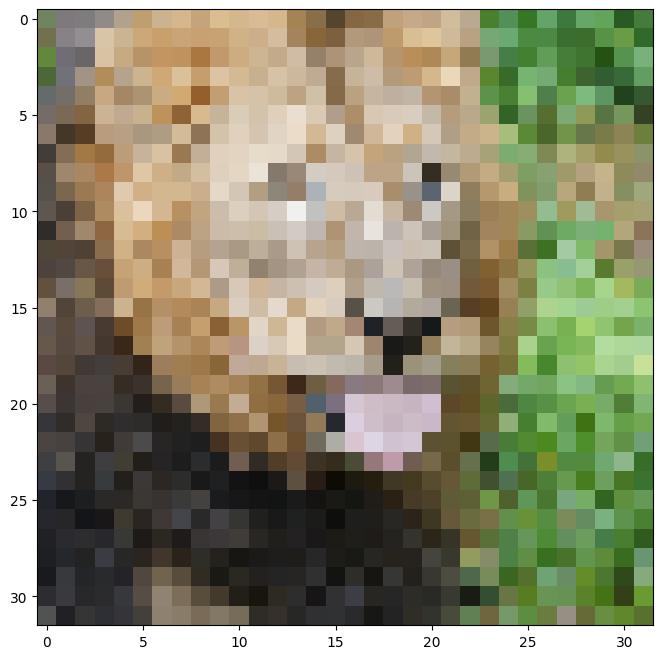

(16, 16, 2)
(16, 16, 3)
(32, 32, 2)
(32, 32, 3)


In [9]:
size = 32
train_data, test_data = get_image(size)
print(np.shape(train_data[0]))
print(np.shape(train_data[1]))
print(np.shape(test_data[0]))
print(np.shape(test_data[1]))

Some suggested hyperparameter choices to help you start
- hidden layer count: 4
- hidden layer size: 256
- number of epochs: 1000
- learning rate: 1e-4


In [10]:
# TODO: Set the hyperparameters
num_layers = 5
hidden_size = 256
hidden_sizes = [hidden_size] * (num_layers - 1)
epochs = 1000
learning_rate = 1e-4
output_size = 3
B_dict = get_B_dict(size)

print('B_dict items:')
for k,v in B_dict.items():
    print('\t',k,np.array(v).shape)

B_dict items:
	 none ()
	 basic (2, 2)
	 gauss_1.0 (16, 2)


In [11]:
# Apply the input feature mapping to the train and test data - already done for you
def get_input_features(B_dict, mapping):
  # mapping is the key to the B_dict, which has the value of B
  # B is then used with the function `input_mapping` to map x
  y_train = train_data[1].reshape(-1, output_size)
  y_test = test_data[1].reshape(-1, output_size)
  X_train = input_mapping(train_data[0].reshape(-1, 2), B_dict[mapping])
  X_test = input_mapping(test_data[0].reshape(-1, 2), B_dict[mapping])
  return X_train, y_train, X_test, y_test

### Plotting and video helper functions (you don't need to change anything here)

In [12]:
def plot_training_curves(train_loss, train_psnr, test_psnr):
  # plot the training loss
  plt.subplot(2, 1, 1)
  plt.plot(train_loss)
  plt.title('MSE history')
  plt.xlabel('Iteration')
  plt.ylabel('MSE Loss')

  # plot the training and testing psnr
  plt.subplot(2, 1, 2)
  plt.plot(train_psnr, label='train')
  plt.plot(test_psnr, label='test')
  plt.title('PSNR history')
  plt.xlabel('Iteration')
  plt.ylabel('PSNR')
  plt.legend()

  plt.tight_layout()
  plt.show()

def plot_reconstruction(p, y):
  p_im = p.reshape(size,size,3)
  y_im = y.reshape(size,size,3)

  plt.figure(figsize=(12,6))

  # plot the reconstruction of the image
  plt.subplot(1,2,1), plt.imshow(p_im), plt.title("reconstruction")

  # plot the ground truth image
  plt.subplot(1,2,2), plt.imshow(y_im), plt.title("ground truth")

  print("Final Test MSE", mse(y, p))
  print("Final Test psnr",psnr(y, p))

def plot_reconstruction_progress(predicted_images, y, N=8):
  total = len(predicted_images)
  step = total // N
  plt.figure(figsize=(24, 4))

  # plot the progress of reconstructions
  for i, j in enumerate(range(0,total, step)):
      plt.subplot(1, N, i+1)
      plt.imshow(predicted_images[j].reshape(size,size,3))
      plt.axis("off")
      plt.title(f"iter {j}")

  # plot ground truth image
  plt.subplot(1, N+1, N+1)
  plt.imshow(y.reshape(size,size,3))
  plt.title('GT')
  plt.axis("off")
  plt.show()

def plot_feature_mapping_comparison(outputs, gt):
  # plot reconstruction images for each mapping
  plt.figure(figsize=(24, 4))
  N = len(outputs)
  for i, k in enumerate(outputs):
      plt.subplot(1, N+1, i+1)
      plt.imshow(outputs[k]['pred_imgs'][-1].reshape(size, size, -1))
      plt.title(k)
  plt.subplot(1, N+1, N+1)
  plt.imshow(gt)
  plt.title('GT')
  plt.show()

  # plot train/test error curves for each mapping
  iters = len(outputs[k]['train_psnrs'])
  plt.figure(figsize=(16, 6))
  plt.subplot(121)
  for i, k in enumerate(outputs):
      plt.plot(range(iters), outputs[k]['train_psnrs'], label=k)
  plt.title('Train error')
  plt.ylabel('PSNR')
  plt.xlabel('Training iter')
  plt.legend()
  plt.subplot(122)
  for i, k in enumerate(outputs):
      plt.plot(range(iters), outputs[k]['test_psnrs'], label=k)
  plt.title('Test error')
  plt.ylabel('PSNR')
  plt.xlabel('Training iter')
  plt.legend()
  plt.show()

# Save out video
def create_and_visualize_video(outputs, size=size, epochs=epochs, filename='training_convergence.mp4'):
  all_preds = np.concatenate([outputs[n]['pred_imgs'].reshape(epochs,size,size,3)[::25] for n in outputs], axis=-2)
  data8 = (255*np.clip(all_preds, 0, 1)).astype(np.uint8)
  f = os.path.join(filename)
  imageio.mimwrite(f, data8, fps=20)

  # Display video inline
  from IPython.display import HTML
  from base64 import b64encode
  mp4 = open(f, 'rb').read()
  data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

  N = len(outputs)
  if N == 1:
    return HTML(f'''
    <video width=256 controls autoplay loop>
          <source src="{data_url}" type="video/mp4">
    </video>
    ''')
  else:
    return HTML(f'''
    <video width=1000 controls autoplay loop>
          <source src="{data_url}" type="video/mp4">
    </video>
    <table width="1000" cellspacing="0" cellpadding="0">
      <tr>{''.join(N*[f'<td width="{1000//len(outputs)}"></td>'])}</tr>
      <tr>{''.join(N*['<td style="text-align:center">{}</td>'])}</tr>
    </table>
    '''.format(*list(outputs.keys())))

### Experiment Runner (Fill in TODOs)

In [ ]:
## shuffle
a = np.random.randint(0, 5, size=(3, 2, 2))
b = np.random.randint(0, 5, size=(3, 3))
print(a)
print(b)
print("\n")

permutation = np.random.permutation(a.shape[0])
a2 = a[permutation]
b2 = b[permutation]

print(a2)
print(a2.reshape((a2.shape[0], -1)))
print(b2)

[[[1 3]
  [3 2]]

 [[2 2]
  [3 4]]

 [[4 4]
  [2 3]]]
[[4 1 1]
 [0 4 1]
 [2 2 2]]


[[[2 2]
  [3 4]]

 [[4 4]
  [2 3]]

 [[1 3]
  [3 2]]]
[[2 2 3 4]
 [4 4 2 3]
 [1 3 3 2]]
[[0 4 1]
 [2 2 2]
 [4 1 1]]


In [13]:
def NN_experiment(X_train, y_train, X_test, y_test, input_size, num_layers,\
                  hidden_size, hidden_sizes, output_size, epochs,\
                  learning_rate, opt):

    # # Debugging
    # print("Input channel:", input_size)
    # print("Output channel:", output_size)

    # Initialize a new neural network model
    net = NeuralNetwork(input_size, hidden_sizes, output_size, num_layers, opt)

    # Variables to store performance for each epoch
    train_loss = np.zeros(epochs)
    train_psnr = np.zeros(epochs)
    test_psnr = np.zeros(epochs)
    predicted_images = np.zeros((epochs, y_test.shape[0], y_test.shape[1]))

    # For each epoch...
    for epoch in tqdm(range(epochs)):

      # Shuffle the dataset
      # TODO implement this

      permutation = np.random.permutation(X_train.shape[0])
      X_use = X_train[permutation]
      y_use = y_train[permutation]

      # Training
      # Run the forward pass of the model to get a prediction and record the psnr
      # TODO implement this

      train_pred = net.forward(X_use)
      train_psnr[epoch] = psnr(y_use, train_pred)

      # Run the backward pass of the model to compute the loss, record the loss, and update the weights
      # TODO implement this
      train_loss[epoch] = net.backward(y_use)
      net.update(lr=learning_rate, opt=opt)

      # Testing
      # No need to run the backward pass here, just run the forward pass to compute and record the psnr
      # TODO implement this
      test_pred = net.forward(X_test)
      test_psnr[epoch] = psnr(y_test, test_pred)
      predicted_images[epoch] = test_pred

    return net, train_psnr, test_psnr, train_loss, predicted_images

# Low Resolution Reconstruction

#### Low Resolution Reconstruction - SGD - None Mapping

  0%|          | 0/1000 [00:00<?, ?it/s]

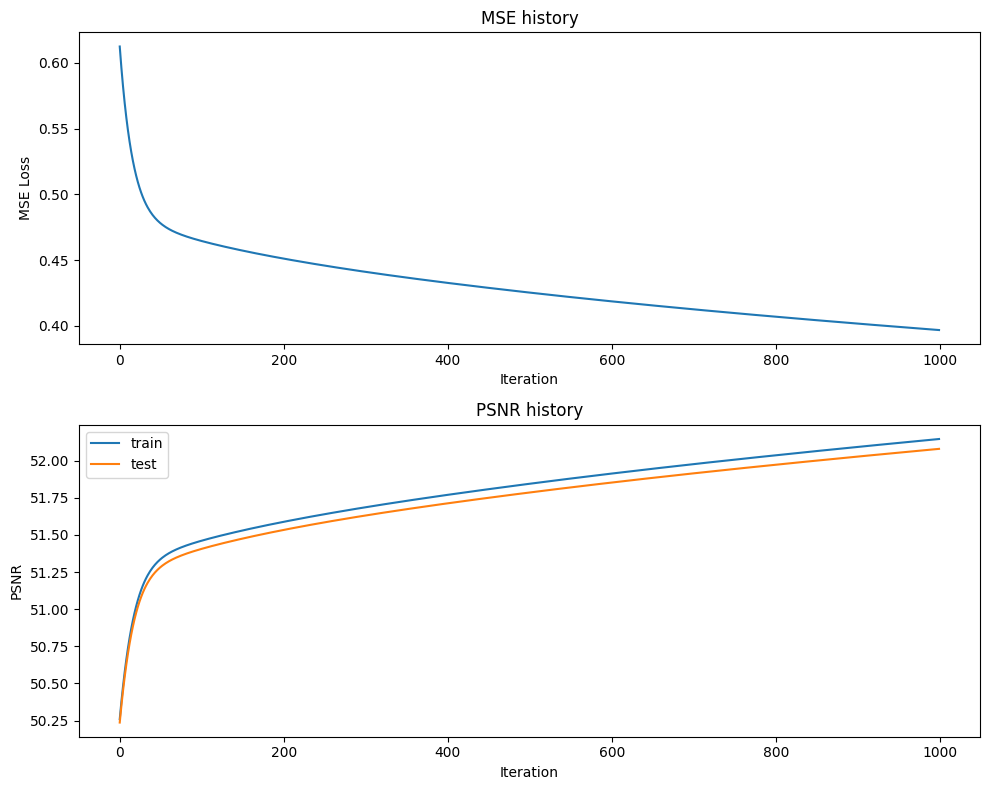

Final Test MSE 0.4029114077674369
Final Test psnr 52.07870796978388


<ipython-input-13-afe762edcc7f>:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, N+1, N+1)


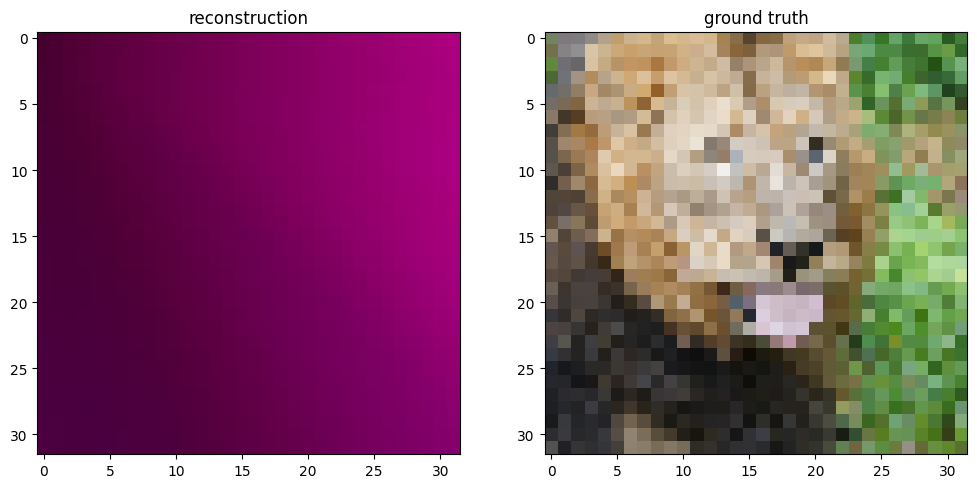

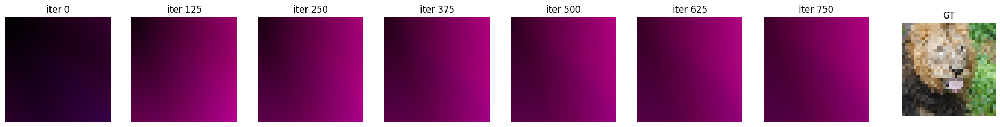

In [ ]:
# get input features
# TODO implement this by using the get_B_dict() and get_input_features() helper functions

num_layers = 5
hidden_size = 256
hidden_sizes = [hidden_size] * (num_layers - 1)
epochs = 1000
learning_rate = 1e-3
input_size = 2
output_size = 3
B_dict = get_B_dict(input_size)
X_train, y_train, X_test, y_test = get_input_features(B_dict, "none")
opt = "SGD"

# run NN experiment on input features
# TODO implement by using the NN_experiment() helper function
net, train_psnr, test_psnr, train_loss, predicted_images = NN_experiment(X_train, y_train, X_test, y_test, np.shape(X_train)[1], num_layers,\
                  hidden_size, hidden_sizes, np.shape(y_train)[1], epochs,\
                  learning_rate, opt)

# plot results of experiment
plot_training_curves(train_loss, train_psnr, test_psnr)
plot_reconstruction(net.forward(X_test), y_test)
plot_reconstruction_progress(predicted_images, y_test)

#### Low Resolution Reconstruction - Adam - None Mapping

  0%|          | 0/1000 [00:00<?, ?it/s]

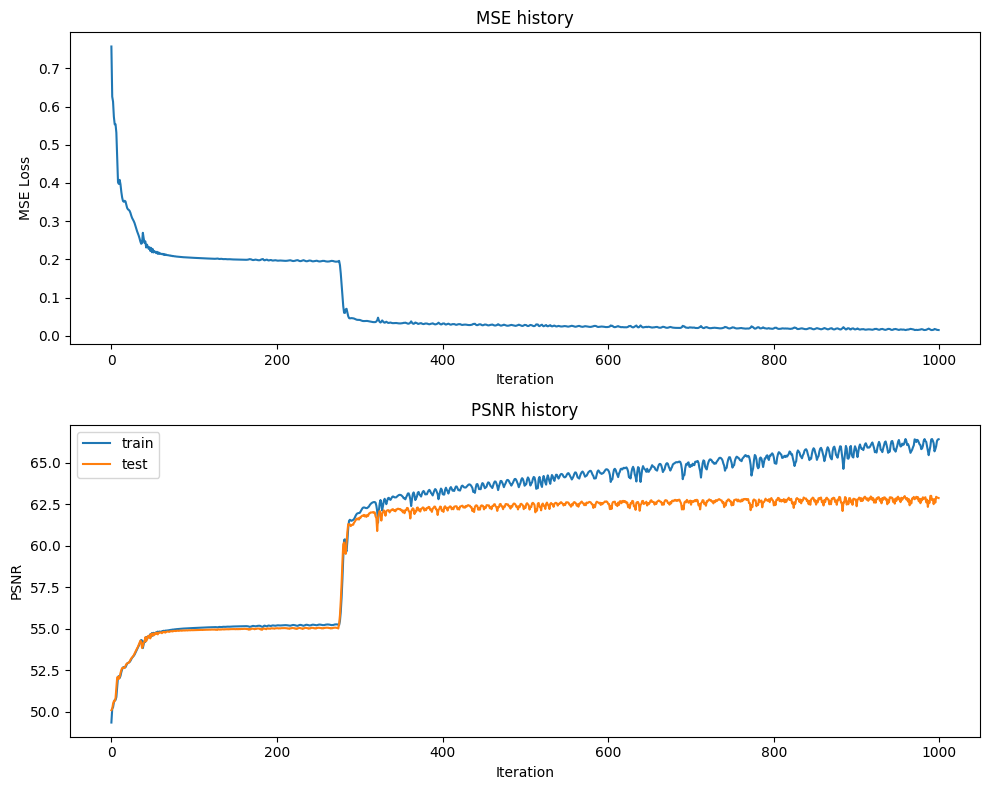

Final Test MSE 0.033587106215046444
Final Test psnr 62.869077731910295


<ipython-input-13-afe762edcc7f>:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, N+1, N+1)


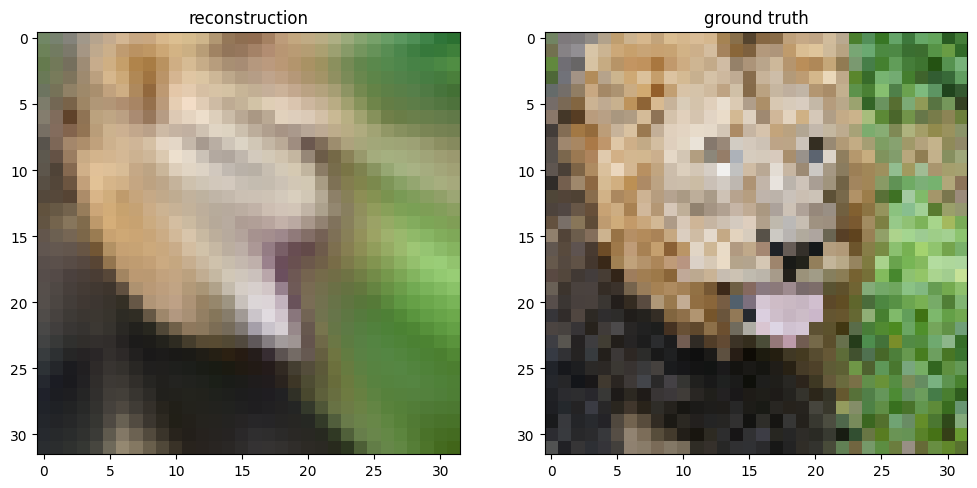

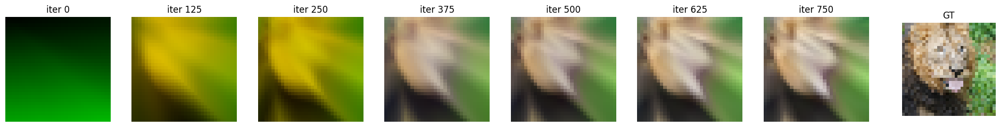

In [ ]:
### lambda = 0 ###

# get input features
# TODO implement this by using the get_B_dict() and get_input_features() helper functions
num_layers = 5
hidden_size = 256
hidden_sizes = [hidden_size] * (num_layers - 1)
epochs = 1000
learning_rate = 1e-3
input_size = 2
output_size = 3
B_dict = get_B_dict(input_size)
X_train, y_train, X_test, y_test = get_input_features(B_dict, "none")
opt = "Adam"

# run NN experiment on input features
net, train_psnr, test_psnr, train_loss, predicted_images = NN_experiment(X_train, y_train, X_test, y_test, np.shape(X_train)[-1], num_layers,\
                  hidden_size, hidden_sizes, np.shape(y_train)[-1], epochs,\
                  learning_rate, opt)

# TODO implement by using the NN_experiment() helper function

# plot results of experiment
plot_training_curves(train_loss, train_psnr, test_psnr)
plot_reconstruction(net.forward(X_test), y_test)
plot_reconstruction_progress(predicted_images, y_test)

  0%|          | 0/1000 [00:00<?, ?it/s]

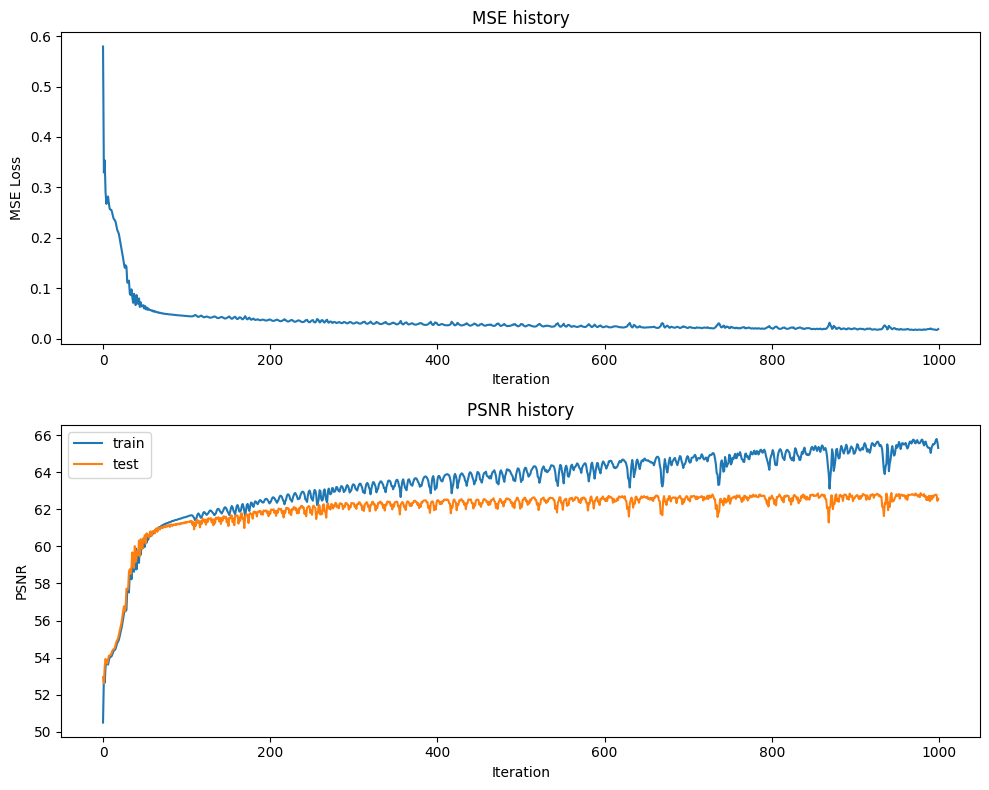

Final Test MSE 0.035936162352961244
Final Test psnr 62.57548664219652


<ipython-input-13-afe762edcc7f>:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, N+1, N+1)


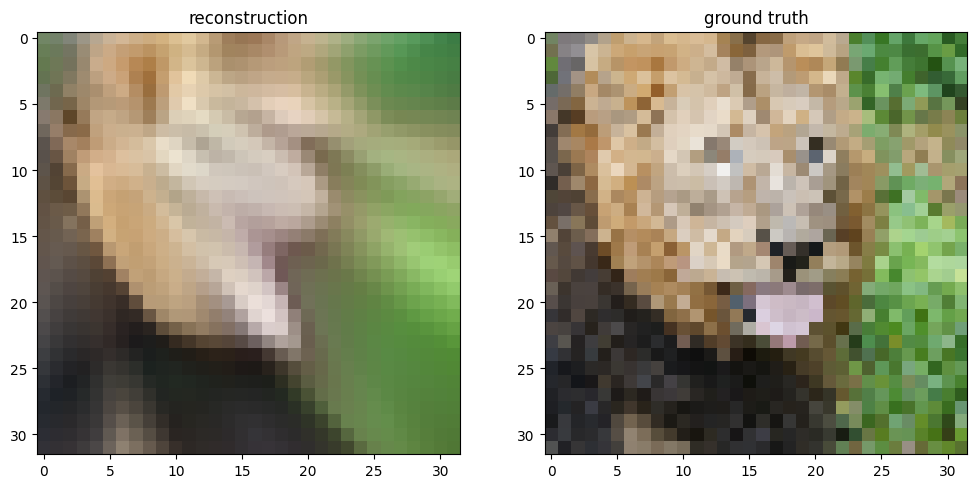

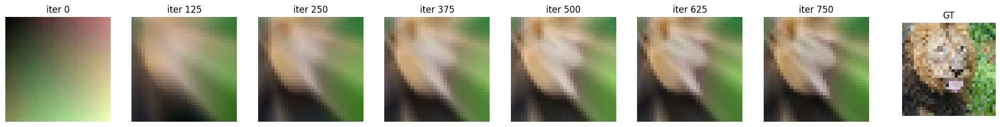

In [ ]:
### lambda = 0.0001 ###

# get input features
# TODO implement this by using the get_B_dict() and get_input_features() helper functions
num_layers = 5
hidden_size = 256
hidden_sizes = [hidden_size] * (num_layers - 1)
epochs = 1000
learning_rate = 1e-3
input_size = 2
output_size = 3
B_dict = get_B_dict(input_size)
X_train, y_train, X_test, y_test = get_input_features(B_dict, "none")
opt = "Adam"

# run NN experiment on input features
net, train_psnr, test_psnr, train_loss, predicted_images = NN_experiment(X_train, y_train, X_test, y_test, np.shape(X_train)[-1], num_layers,\
                  hidden_size, hidden_sizes, np.shape(y_train)[-1], epochs,\
                  learning_rate, opt)

# TODO implement by using the NN_experiment() helper function

# plot results of experiment
plot_training_curves(train_loss, train_psnr, test_psnr)
plot_reconstruction(net.forward(X_test), y_test)
plot_reconstruction_progress(predicted_images, y_test)

#### Low Resolution Reconstruction - Optimizer of your Choice - Various Input Mapping Stategies

In [14]:
def train_wrapper(mapping, size, opt):
  # TODO implement
  # makes it easy to run all your mapping experiments in a for loop
  # this will similar to what you did previously in the last two sections

  # get input features
  # TODO implement this by using the get_B_dict() and get_input_features() helper functions
  num_layers = 5
  hidden_size = 256
  hidden_sizes = [hidden_size] * (num_layers - 1)
  epochs = 1000
  learning_rate = 1e-3
  input_size = 2
  output_size = 3
  B_dict = get_B_dict(size)
  X_train, y_train, X_test, y_test = get_input_features(B_dict, mapping)

  # run NN experiment on input features
  net, train_psnrs, test_psnrs, train_loss, predicted_images = NN_experiment(X_train, y_train, X_test, y_test, np.shape(X_train)[-1], num_layers,\
                    hidden_size, hidden_sizes, np.shape(y_train)[-1], epochs,\
                    learning_rate, opt)

  # TODO implement by using the NN_experiment() helper function

  # plot results of experiment
  plot_training_curves(train_loss, train_psnrs, test_psnrs)
  plot_reconstruction(net.forward(X_test), y_test)
  plot_reconstruction_progress(predicted_images, y_test)

  return {
      'net': net,
      'train_psnrs': train_psnrs,
      'test_psnrs': test_psnrs,
      'train_loss': train_loss,
      'pred_imgs': predicted_images
  }

  0%|          | 0/3 [00:00<?, ?it/s]

training none


  0%|          | 0/1000 [00:00<?, ?it/s]

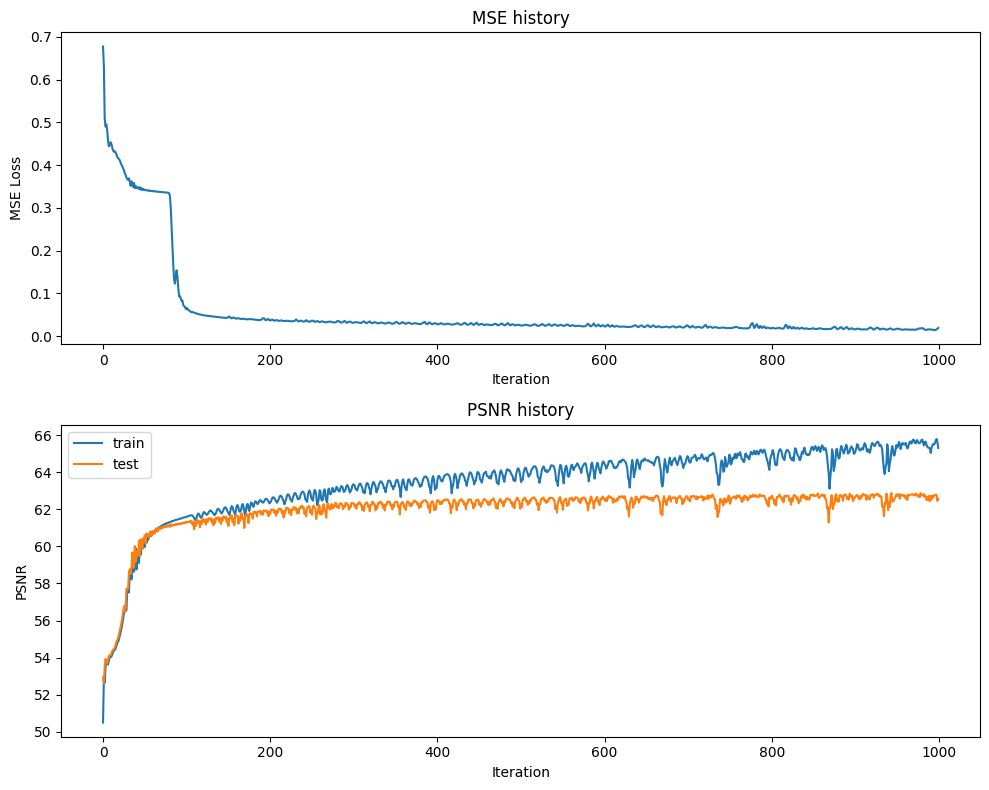

Final Test MSE 0.03718581599690117
Final Test psnr 62.42703044882699


<ipython-input-13-afe762edcc7f>:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, N+1, N+1)


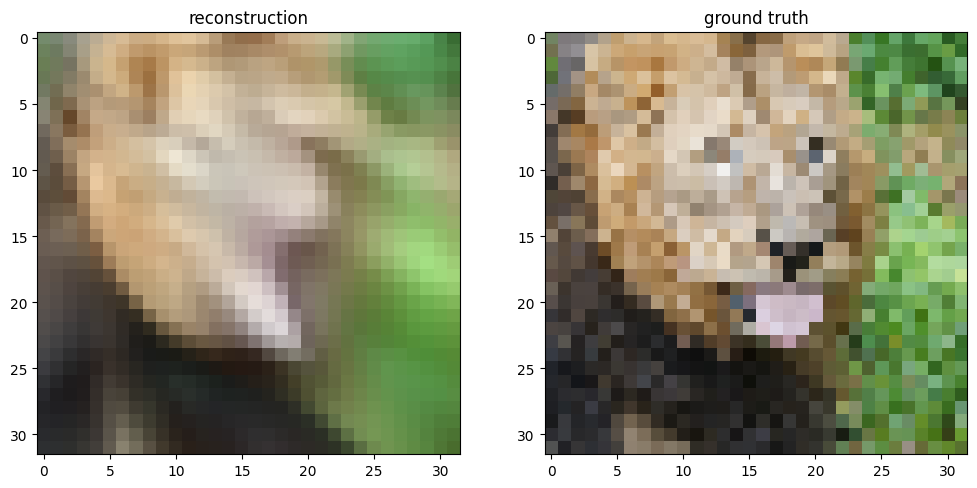

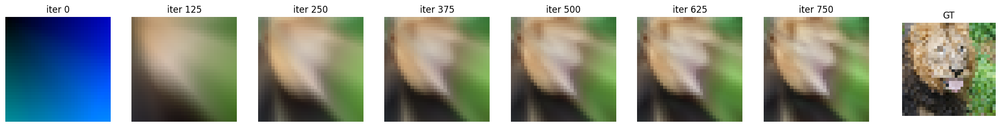

training basic


  0%|          | 0/1000 [00:00<?, ?it/s]

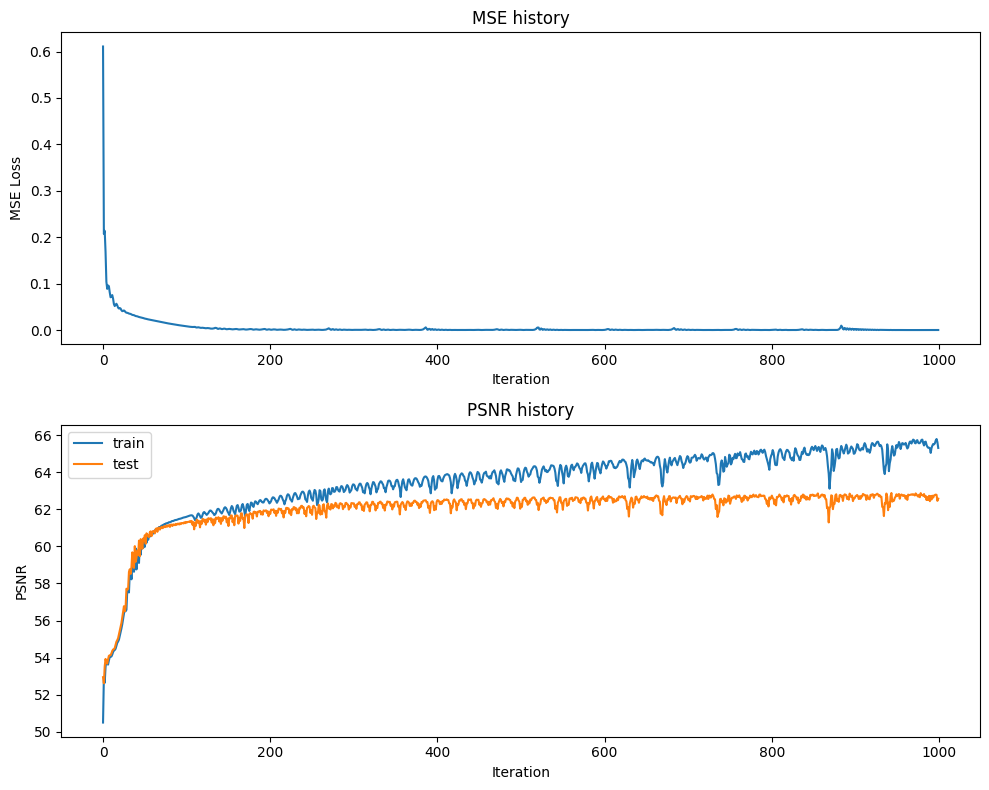

Final Test MSE 0.031144618911640505
Final Test psnr 63.19697339691599


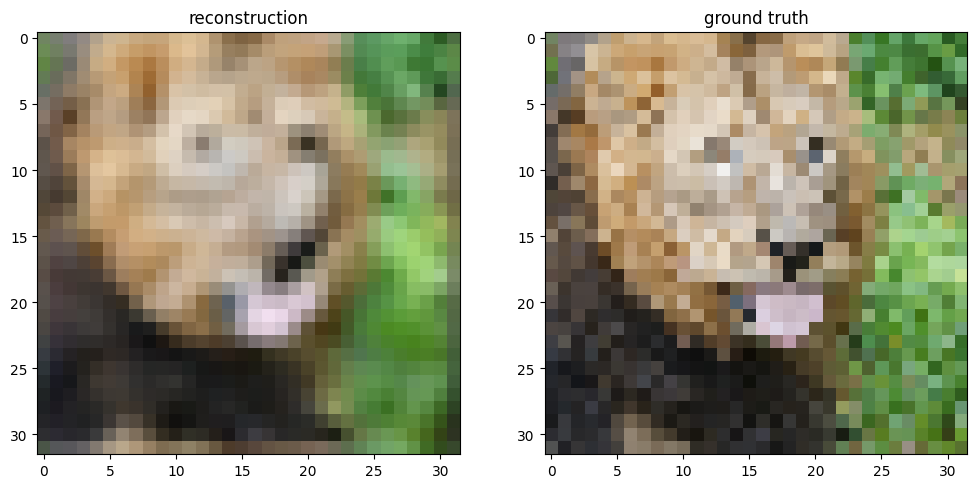

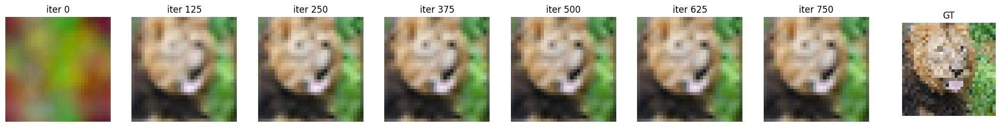

training gauss_1.0


  0%|          | 0/1000 [00:00<?, ?it/s]

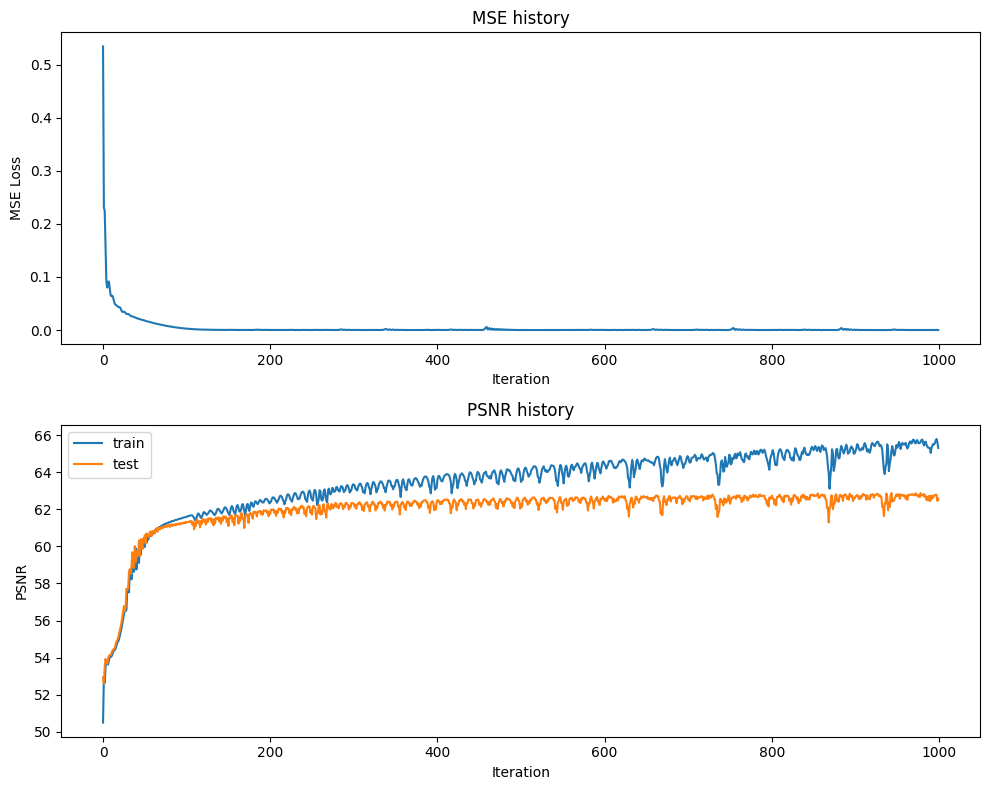

Final Test MSE 0.030174893518824852
Final Test psnr 63.334346146343435


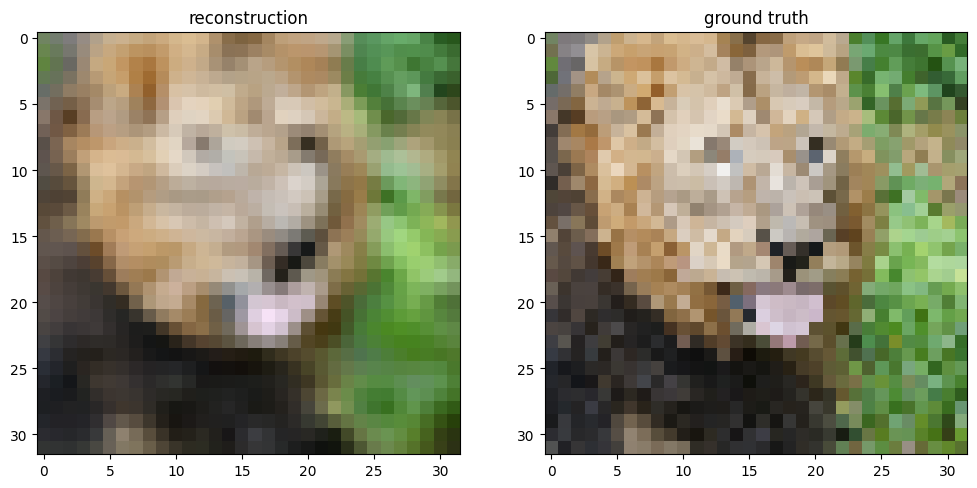

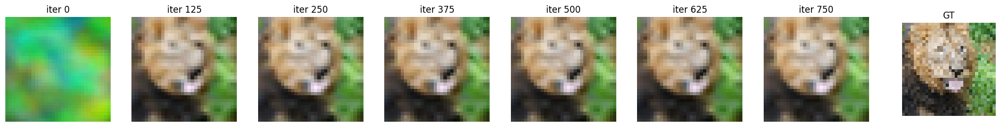

In [ ]:
opt = "Adam"
outputs = {}
for k in tqdm(B_dict):
  print("training", k)
  outputs[k] = train_wrapper(k, size, opt)

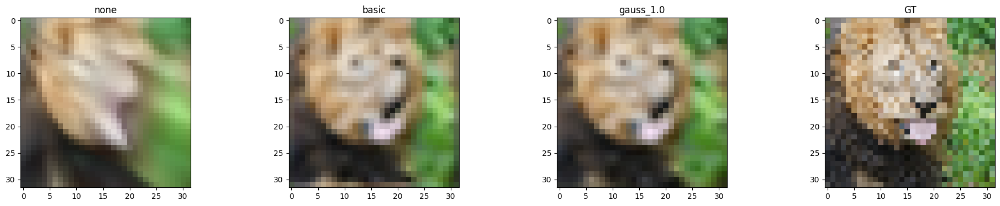

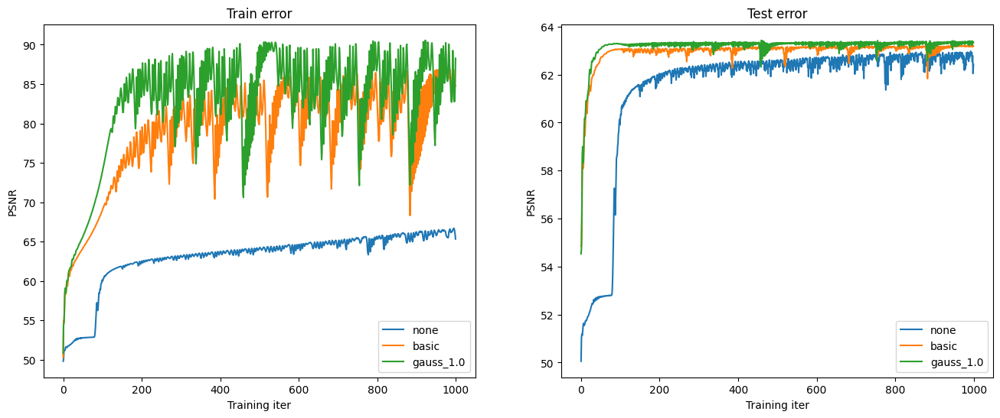

In [ ]:
# if you did everything correctly so far, this should output a nice figure you can use in your report
plot_feature_mapping_comparison(outputs, y_test.reshape(size,size,3))

  0%|          | 0/3 [00:00<?, ?it/s]

training none


  0%|          | 0/1000 [00:00<?, ?it/s]

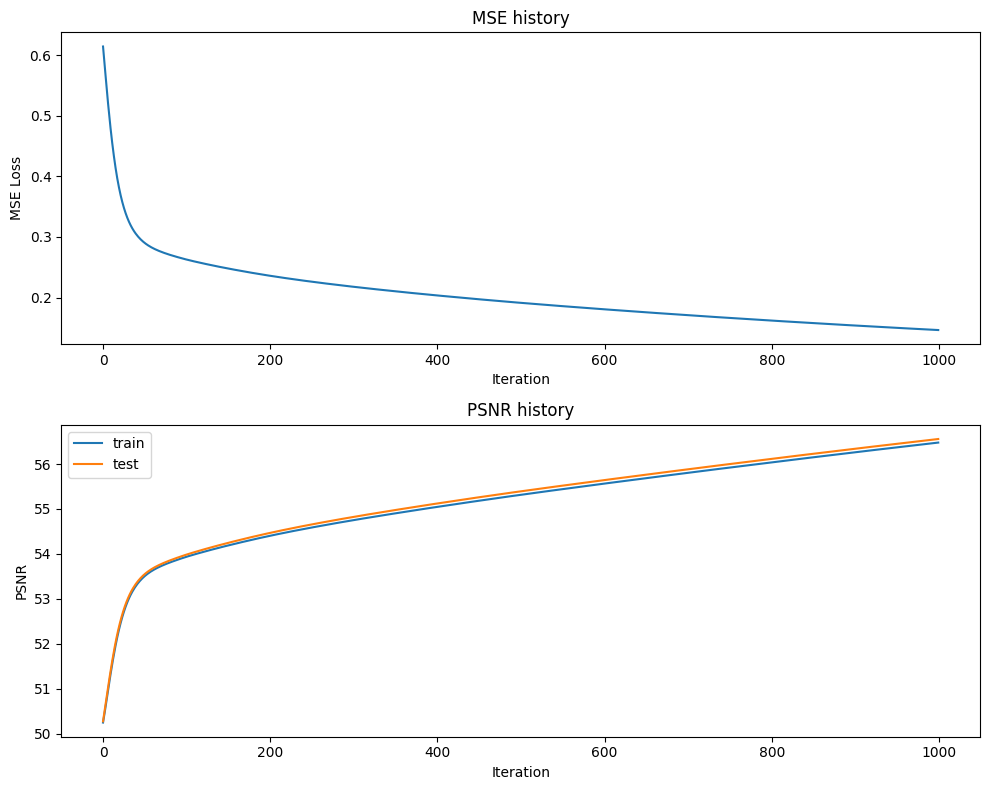

Final Test MSE 0.14369580531207993
Final Test psnr 56.55636270231292


<ipython-input-11-afe762edcc7f>:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, N+1, N+1)


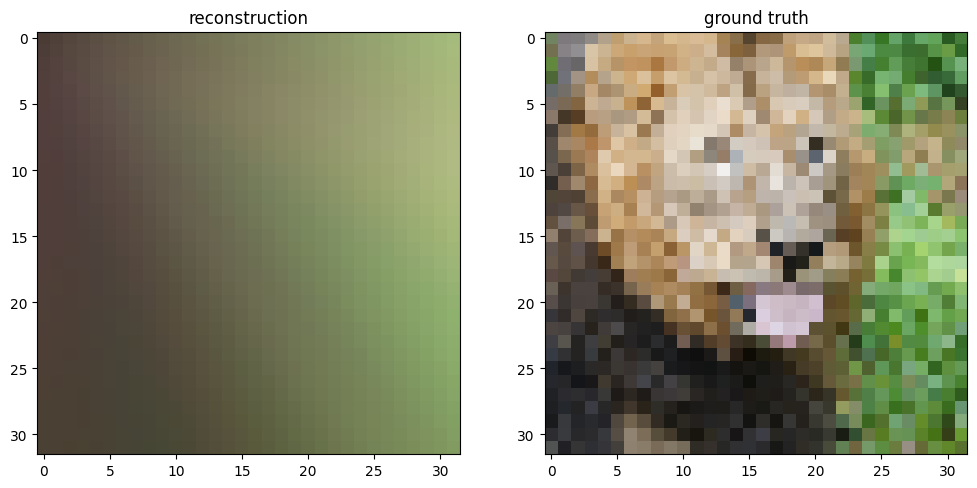

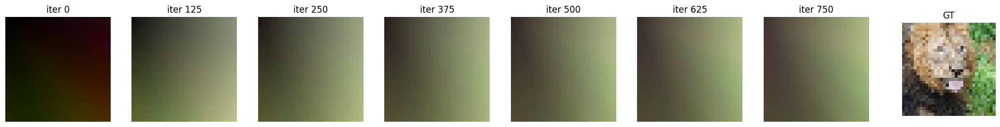

training basic


  0%|          | 0/1000 [00:00<?, ?it/s]

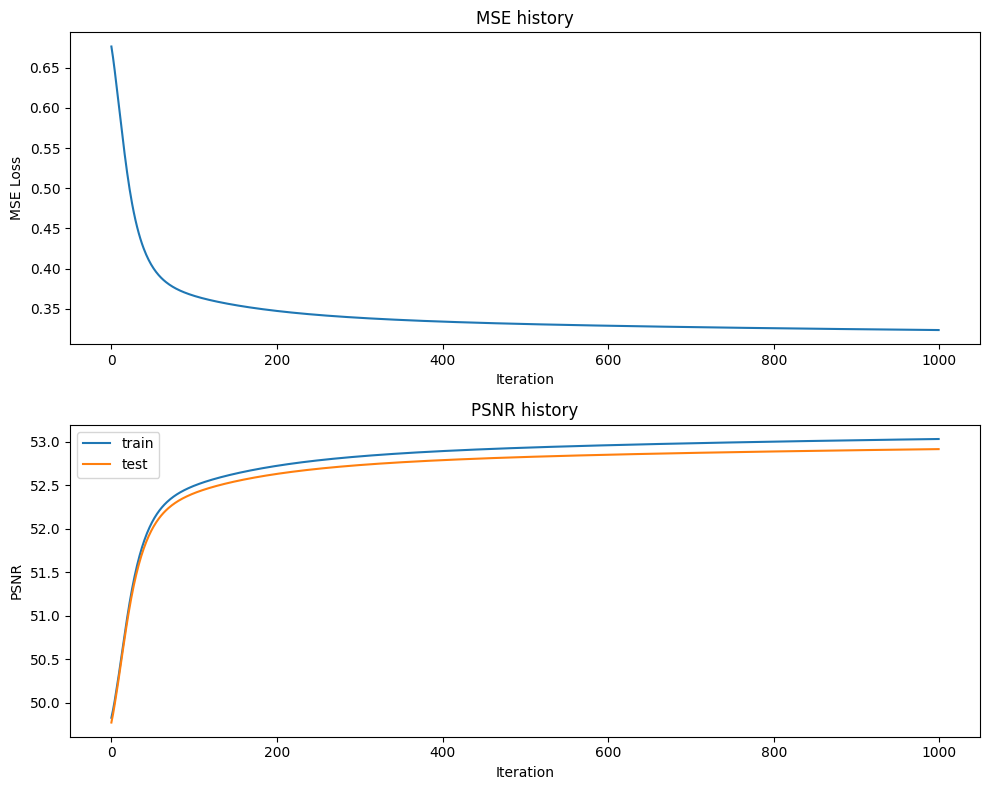

Final Test MSE 0.3321873383997549
Final Test psnr 52.91697285937104


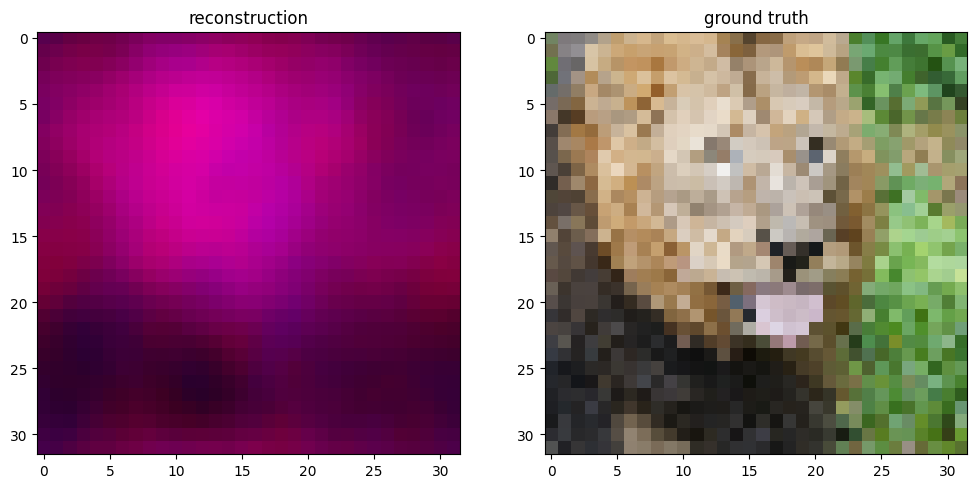

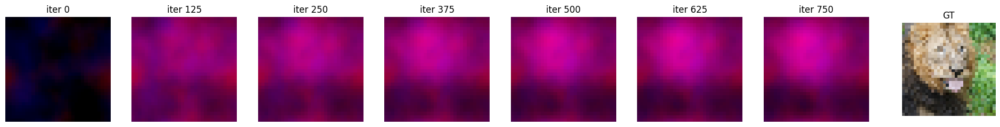

training gauss_1.0


  0%|          | 0/1000 [00:00<?, ?it/s]

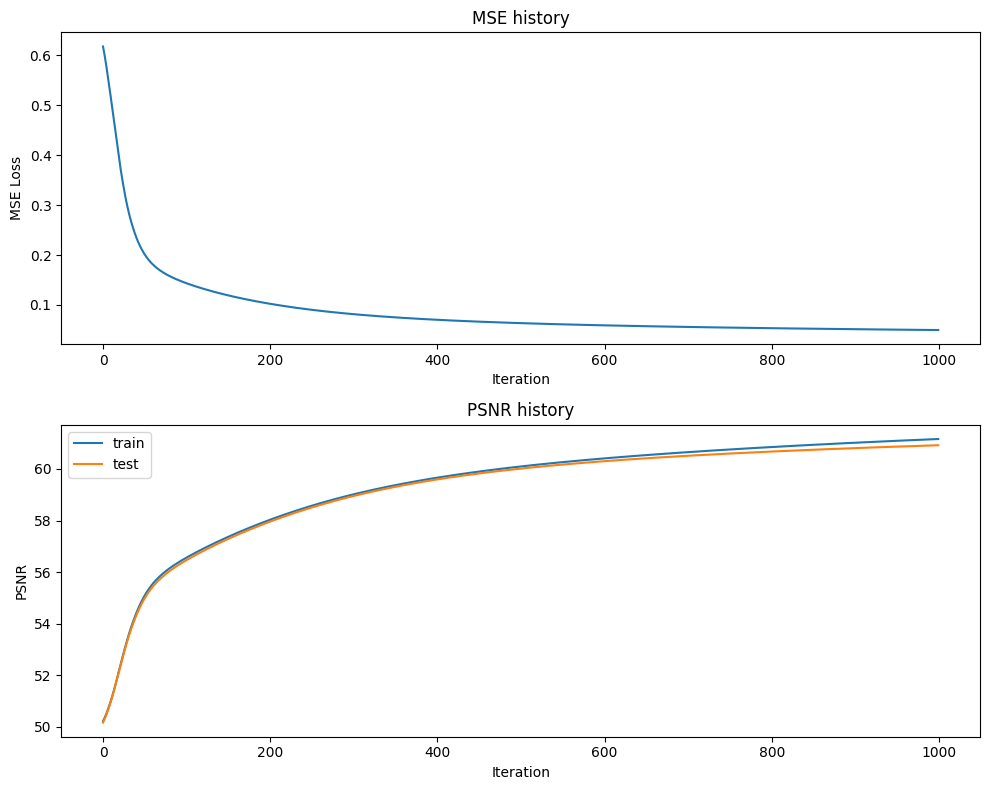

Final Test MSE 0.052614722278454755
Final Test psnr 60.91973078507402


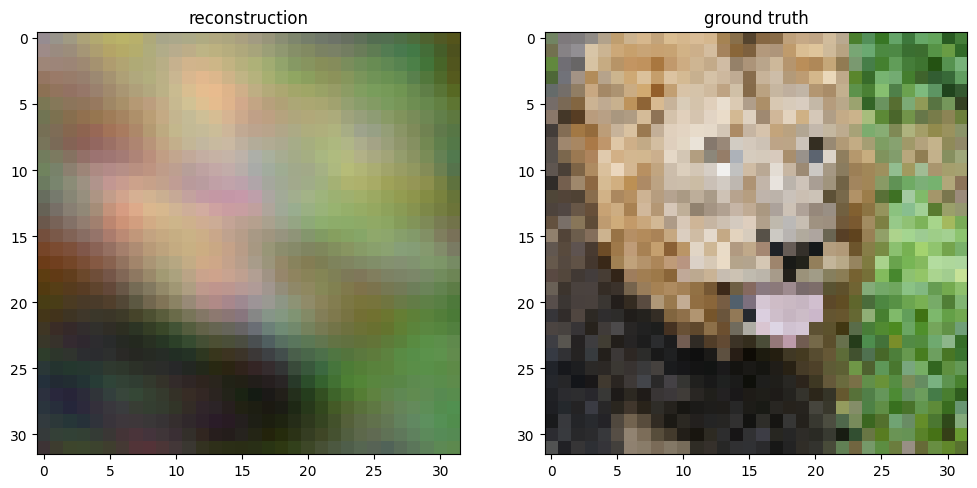

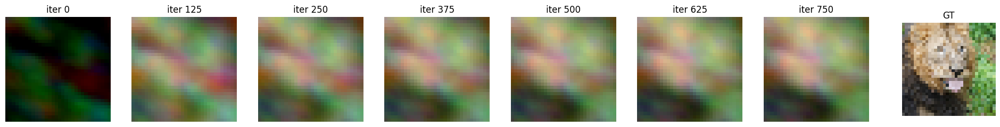

In [ ]:
opt = "SGD"
outputs = {}
for k in tqdm(B_dict):
  print("training", k)
  outputs[k] = train_wrapper(k, size, opt)

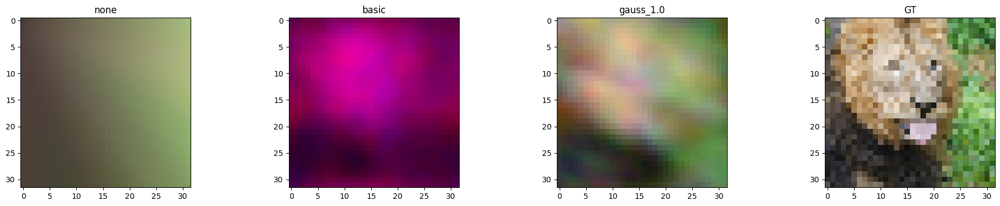

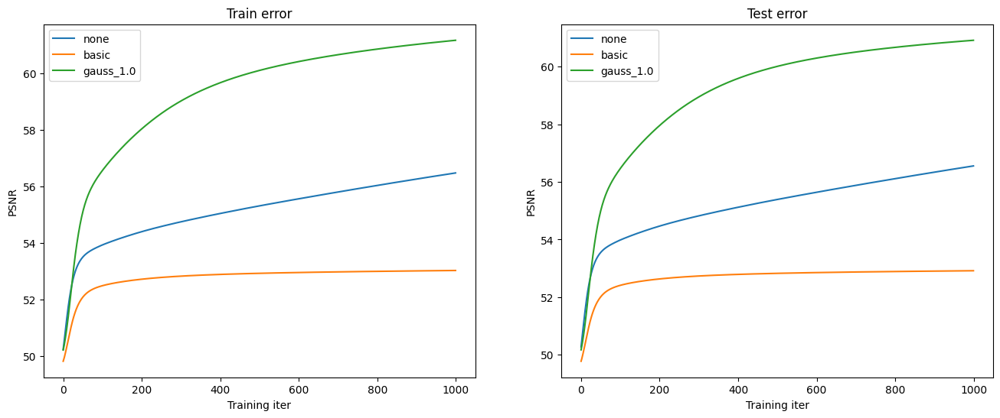

In [ ]:
# if you did everything correctly so far, this should output a nice figure you can use in your report
X_train, y_train, X_test, y_test = get_input_features(B_dict, "none")
plot_feature_mapping_comparison(outputs, y_test.reshape(size,size,3))

# High Resolution Reconstruction

#### High Resolution Reconstruction - Optimizer of your Choice - Various Input Mapping Stategies

Repeat the previous experiment, but at the higher resolution. The reason why we have you first experiment with the lower resolution since it is faster to train and debug. Additionally, you will see how the mapping strategies perform better or worse at the two different input resolutions.

<ipython-input-4-47d50880e2e8>:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(image_url)[..., :3] / 255.


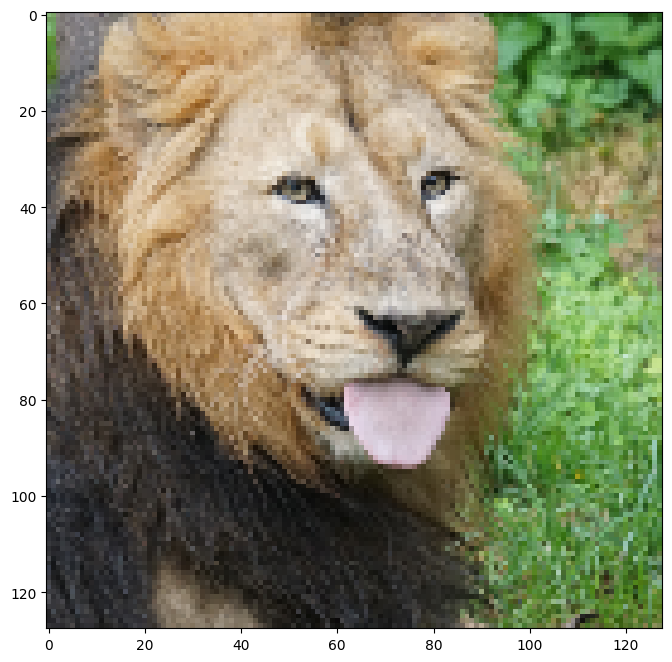

In [38]:
size = 128
train_data, test_data = get_image(size)

In [39]:
outputs = {}
for k in tqdm(B_dict):
  print("training", k)
  outputs[k] = train_wrapper(k, size, "Adam")

Output hidden; open in https://colab.research.google.com to view.

#### High Resolution Reconstruction - Image of your Choice

When choosing an image select one that you think will give you interesting results or a better insight into the performance of different feature mappings and explain why in your report template.

<ipython-input-4-47d50880e2e8>:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(image_url)[..., :3] / 255.


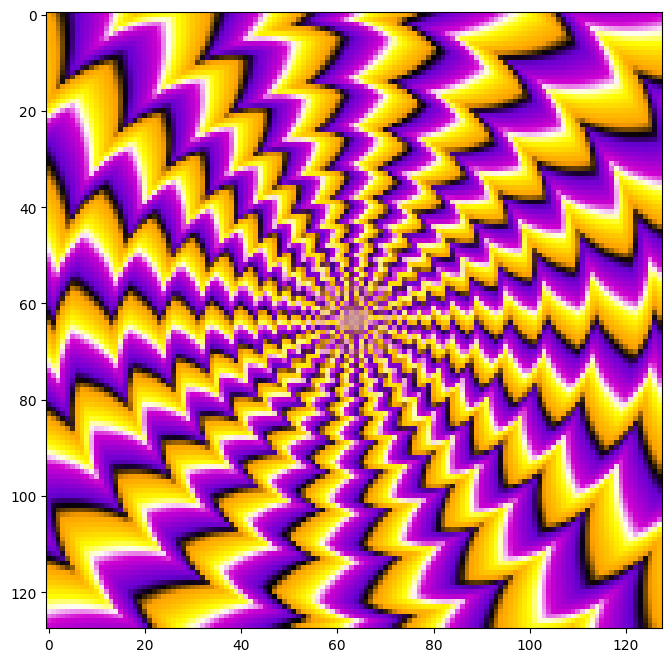

In [44]:
size = 128
# TODO pick an image and replace the url string
train_data, test_data = get_image(size, image_url="/content/drive/MyDrive/CS444/assignment2/illusion.jpg")

In [45]:
# get input features
# TODO implement this by using the get_B_dict() and get_input_features() helper functions

# run NN experiment on input features
# TODO implement by using the NN_experiment() helper function

outputs = {}
for k in tqdm(B_dict):
  print("training", k)
  outputs[k] = train_wrapper(k, size, "Adam")

# plot_training_curves(train_loss, train_psnr, test_psnr)
# plot_reconstruction(net.forward(X_test), y_test)
# plot_reconstruction_progress(predicted_images, y_test)

Output hidden; open in https://colab.research.google.com to view.

# Extra Credit 1: Deeper Network

[autoreload of models.neural_net failed: Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/IPython/extensions/autoreload.py", line 245, in check
    superreload(m, reload, self.old_objects)
  File "/usr/local/lib/python3.10/dist-packages/IPython/extensions/autoreload.py", line 410, in superreload
    update_generic(old_obj, new_obj)
  File "/usr/local/lib/python3.10/dist-packages/IPython/extensions/autoreload.py", line 347, in update_generic
    update(a, b)
  File "/usr/local/lib/python3.10/dist-packages/IPython/extensions/autoreload.py", line 302, in update_class
    if update_generic(old_obj, new_obj): continue
  File "/usr/local/lib/python3.10/dist-packages/IPython/extensions/autoreload.py", line 347, in update_generic
    update(a, b)
  File "/usr/local/lib/python3.10/dist-packages/IPython/extensions/autoreload.py", line 266, in update_function
    setattr(old, name, getattr(new, name))
ValueError: __init__() requires a code object with 1 free vars

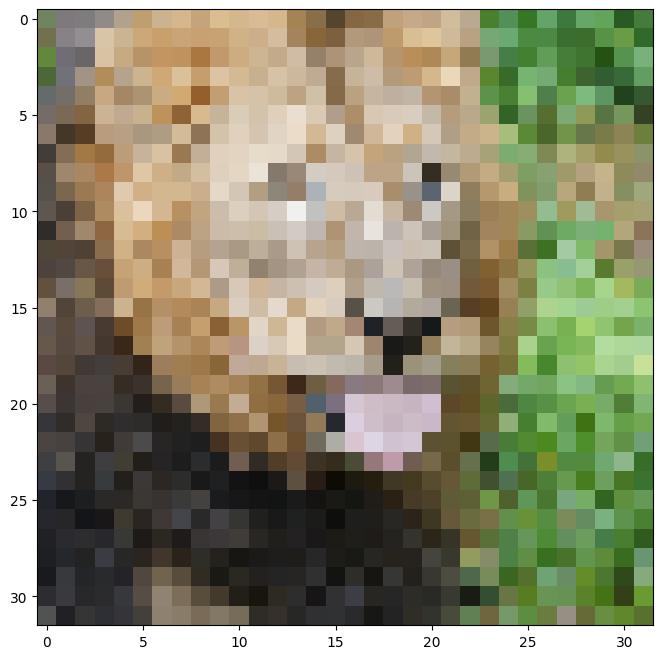

In [24]:
### load dataset ###
size = 32
train_data, test_data = get_image(size)

In [33]:
### num_layers = [5, 10, 15] ###

def train_wrapper1(mapping, size, opt, num_layers):
  # TODO implement
  # makes it easy to run all your mapping experiments in a for loop
  # this will similar to what you did previously in the last two sections

  # get input features
  # TODO implement this by using the get_B_dict() and get_input_features() helper functions
  hidden_size = 256
  hidden_sizes = [hidden_size] * (num_layers - 1)
  epochs = 1000
  learning_rate = 1e-3
  input_size = 2
  output_size = 3
  B_dict = get_B_dict(size)
  X_train, y_train, X_test, y_test = get_input_features(B_dict, mapping)

  # run NN experiment on input features
  net, train_psnrs, test_psnrs, train_loss, predicted_images = NN_experiment(X_train, y_train, X_test, y_test, np.shape(X_train)[-1], num_layers,\
                    hidden_size, hidden_sizes, np.shape(y_train)[-1], epochs,\
                    learning_rate, opt)

  # TODO implement by using the NN_experiment() helper function

  # plot results of experiment
  plot_training_curves(train_loss, train_psnrs, test_psnrs)
  plot_reconstruction(net.forward(X_test), y_test)
  plot_reconstruction_progress(predicted_images, y_test)

  return {
      'net': net,
      'train_psnrs': train_psnrs,
      'test_psnrs': test_psnrs,
      'train_loss': train_loss,
      'pred_imgs': predicted_images
  }

training NN of depth 5


  0%|          | 0/3 [00:00<?, ?it/s]

training none


  0%|          | 0/1000 [00:00<?, ?it/s]

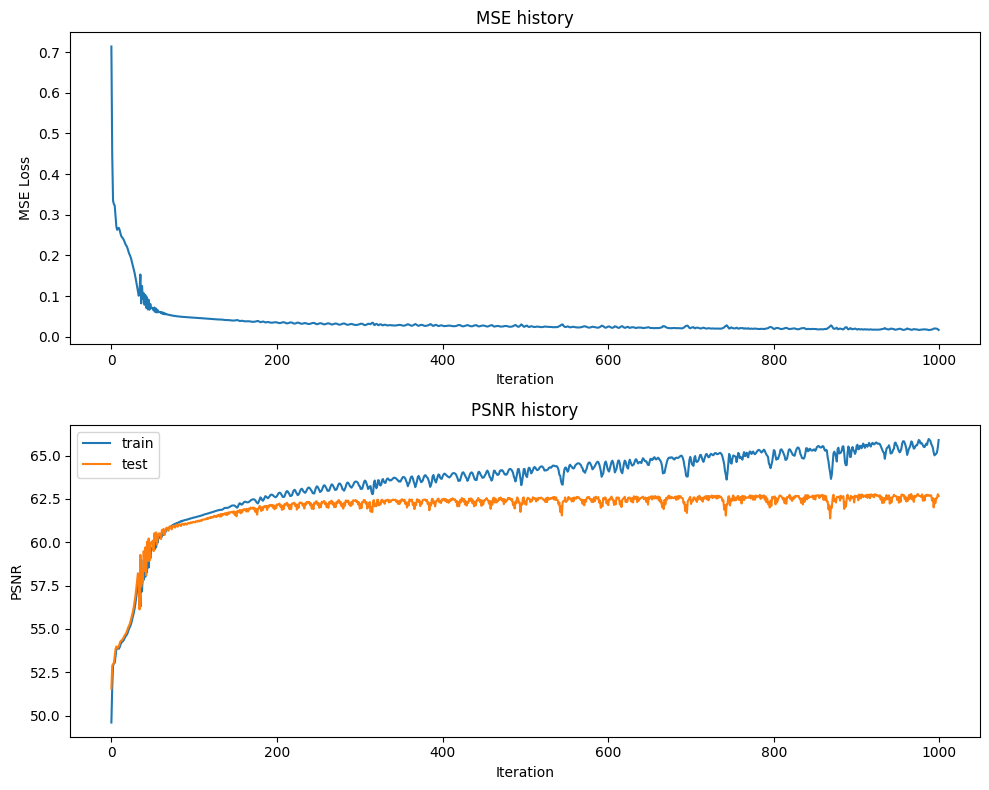

Final Test MSE 0.03515975787478391
Final Test psnr 62.670344851944854


<ipython-input-11-afe762edcc7f>:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, N+1, N+1)


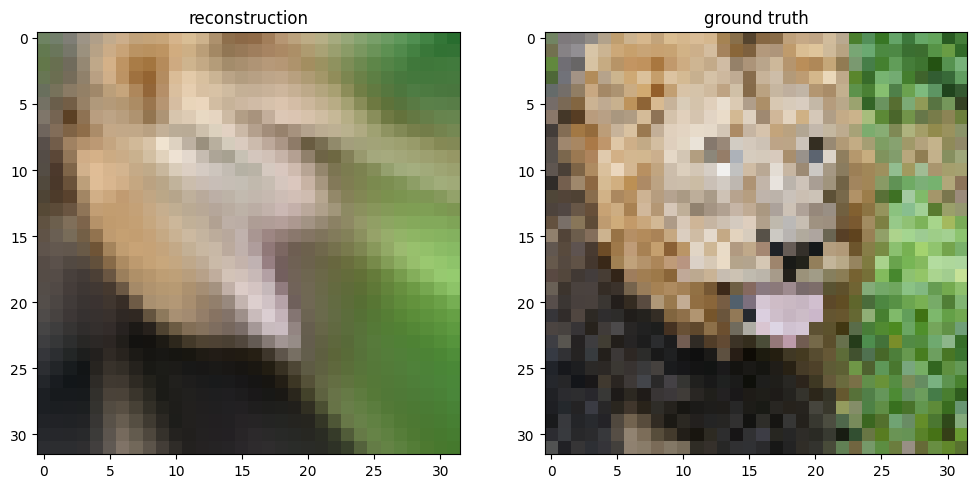

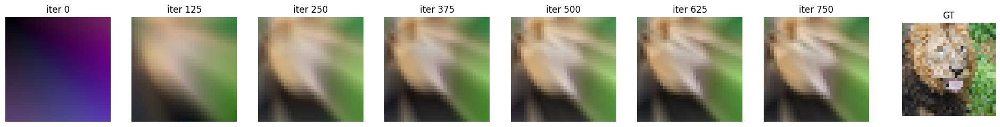

training basic


  0%|          | 0/1000 [00:00<?, ?it/s]

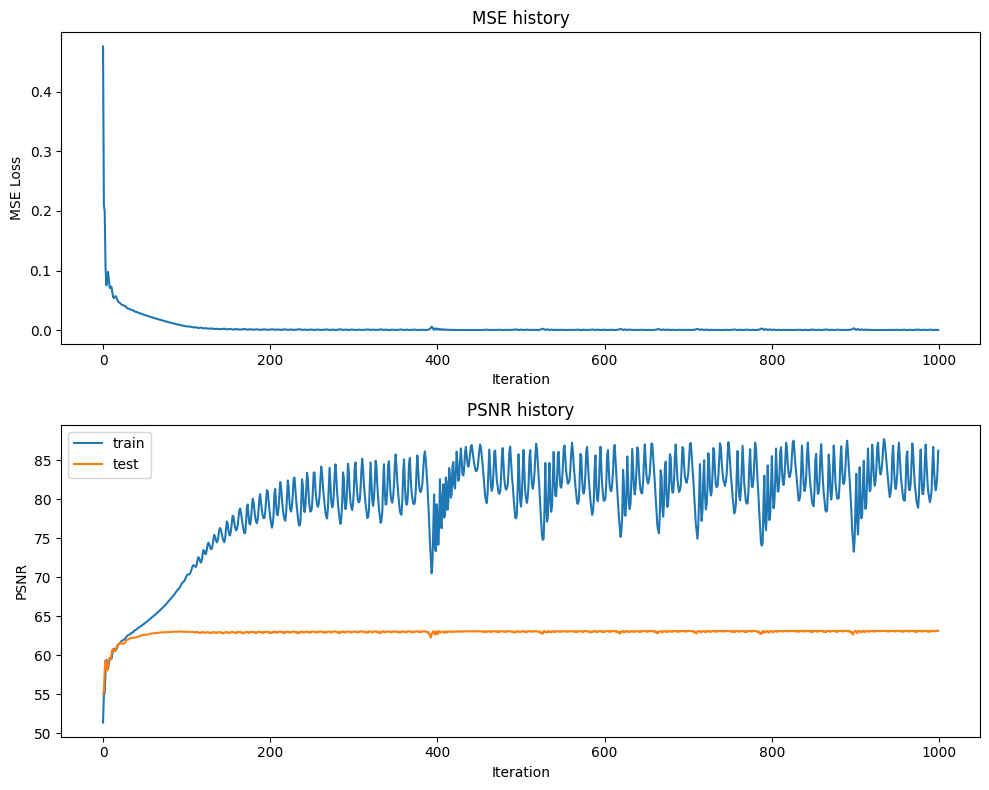

Final Test MSE 0.03170637115784308
Final Test psnr 63.1193382165722


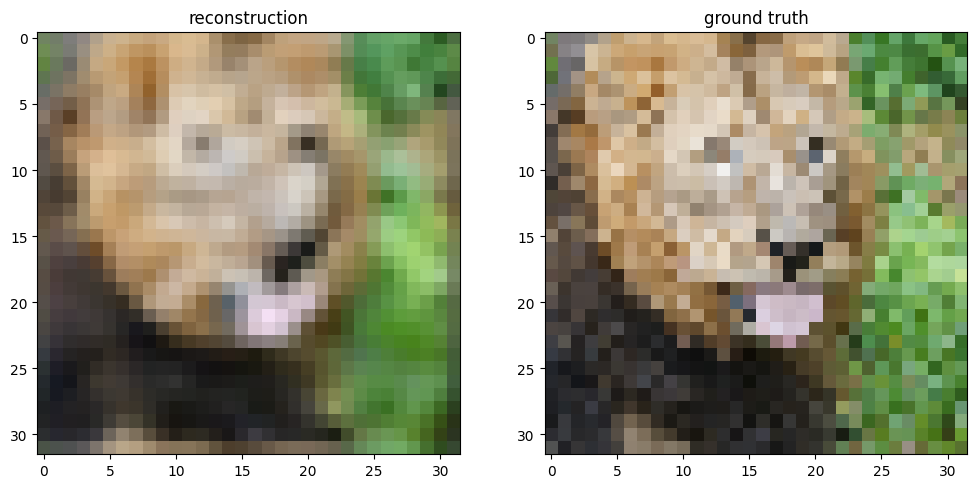

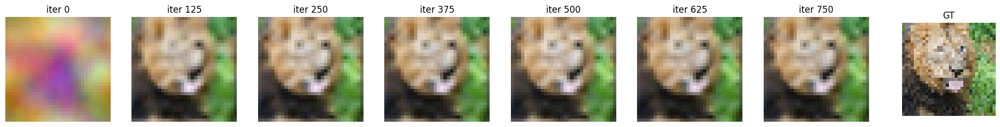

training gauss_1.0


  0%|          | 0/1000 [00:00<?, ?it/s]

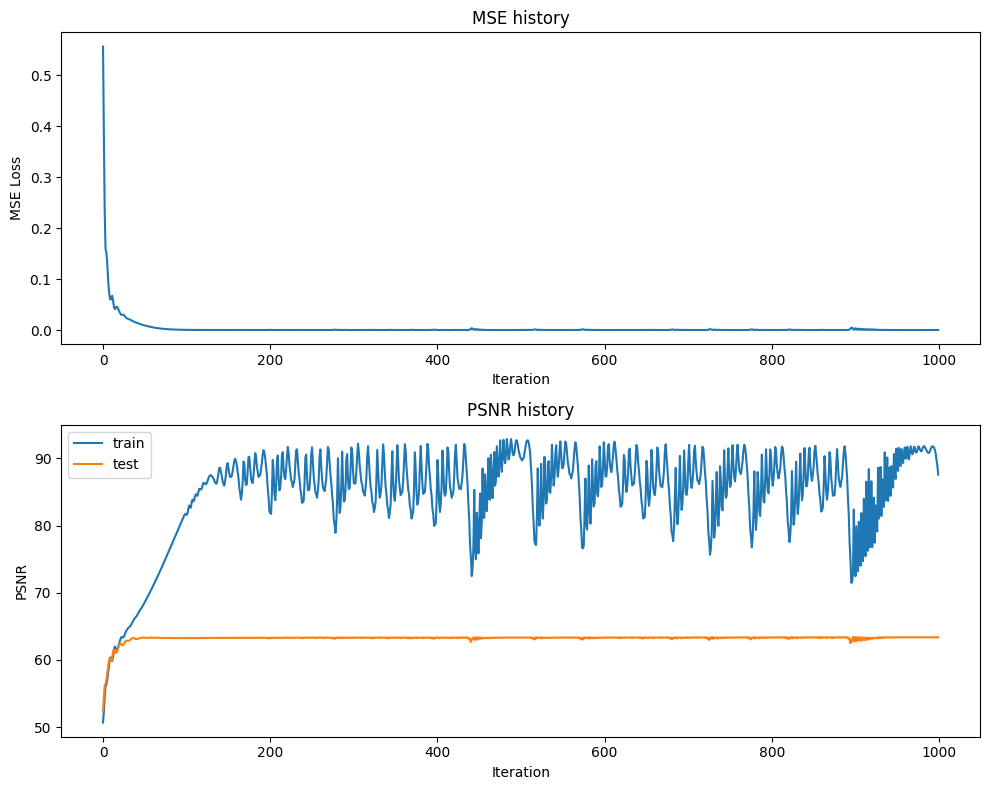

Final Test MSE 0.029887223454911092
Final Test psnr 63.37594790232135


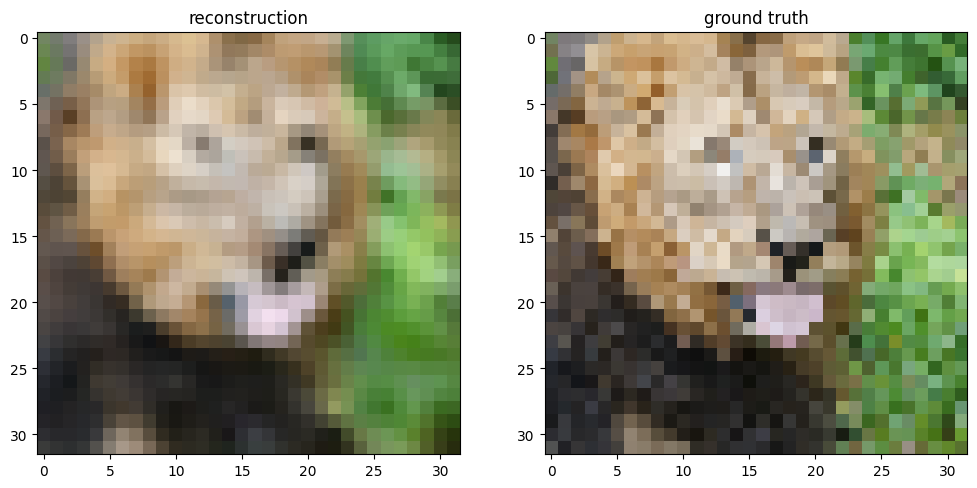

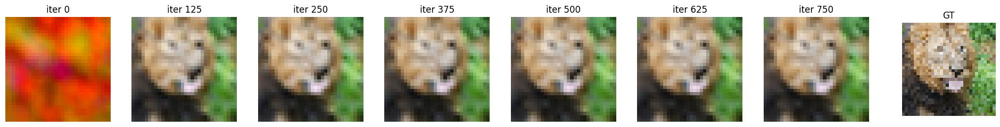

training NN of depth 10


  0%|          | 0/3 [00:00<?, ?it/s]

training none


  0%|          | 0/1000 [00:00<?, ?it/s]

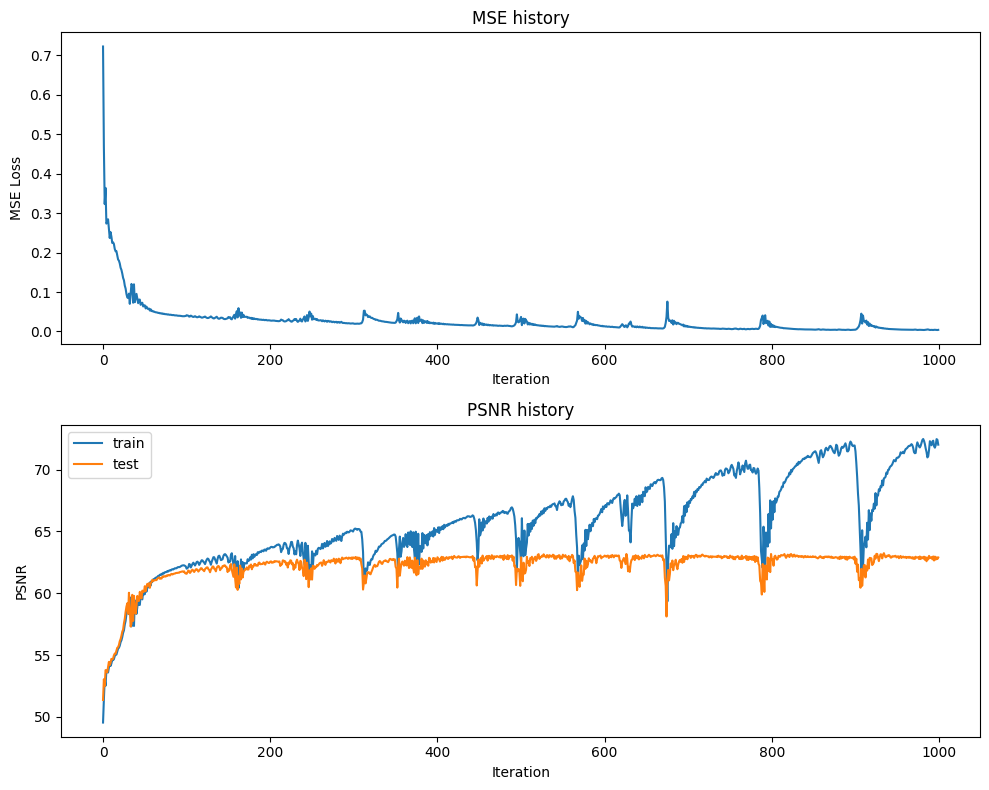

Final Test MSE 0.03335740556047205
Final Test psnr 62.89888095718371


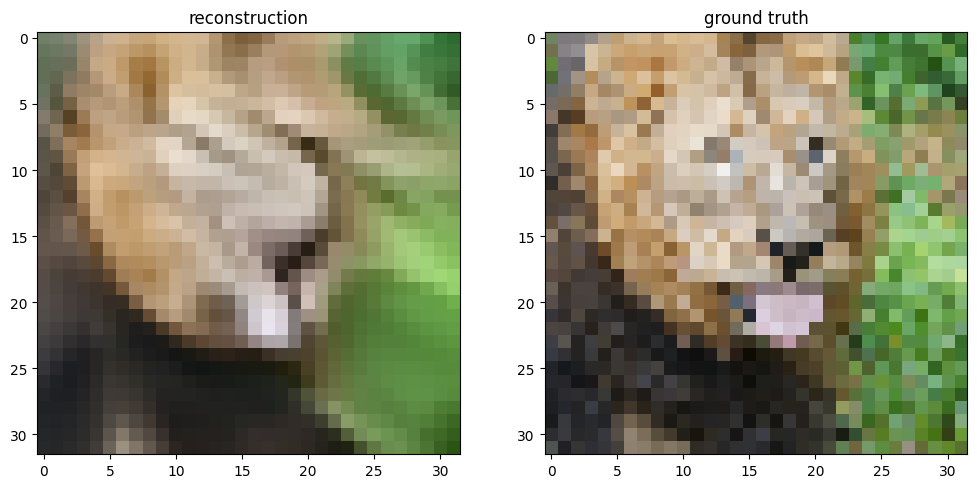

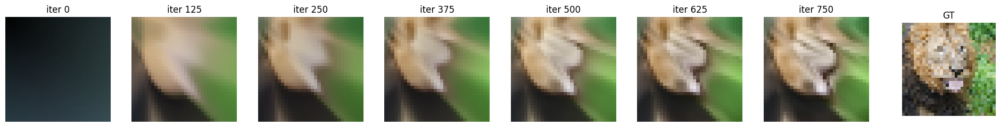

training basic


  0%|          | 0/1000 [00:00<?, ?it/s]

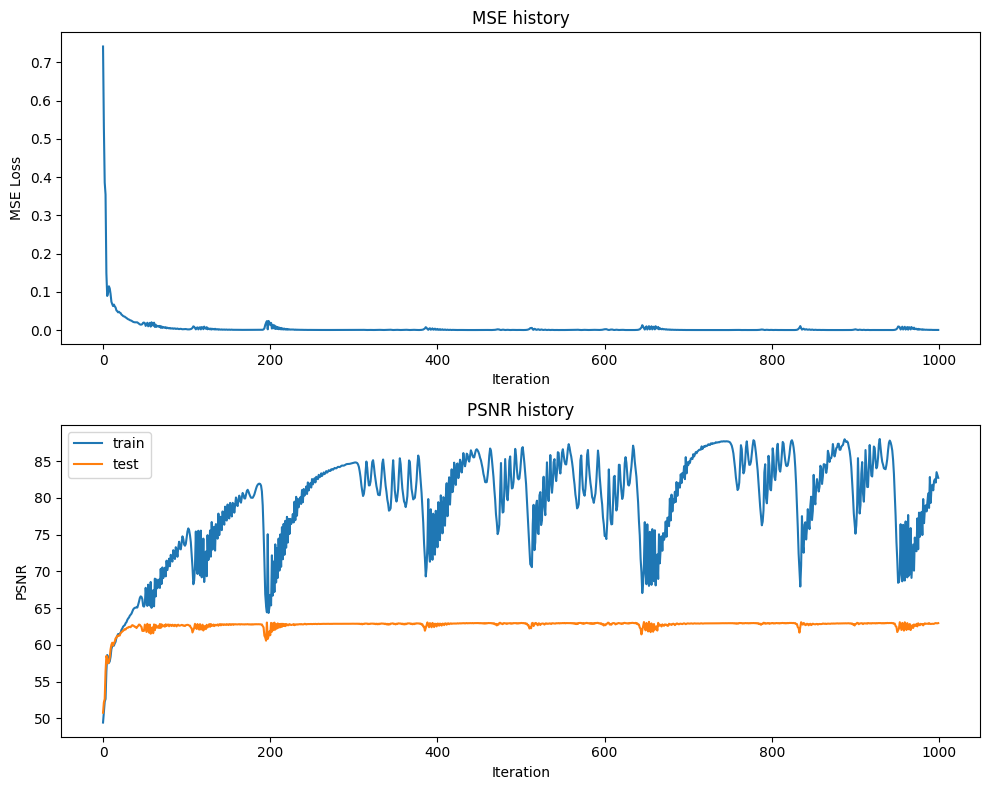

Final Test MSE 0.03287743453342877
Final Test psnr 62.961824392092716


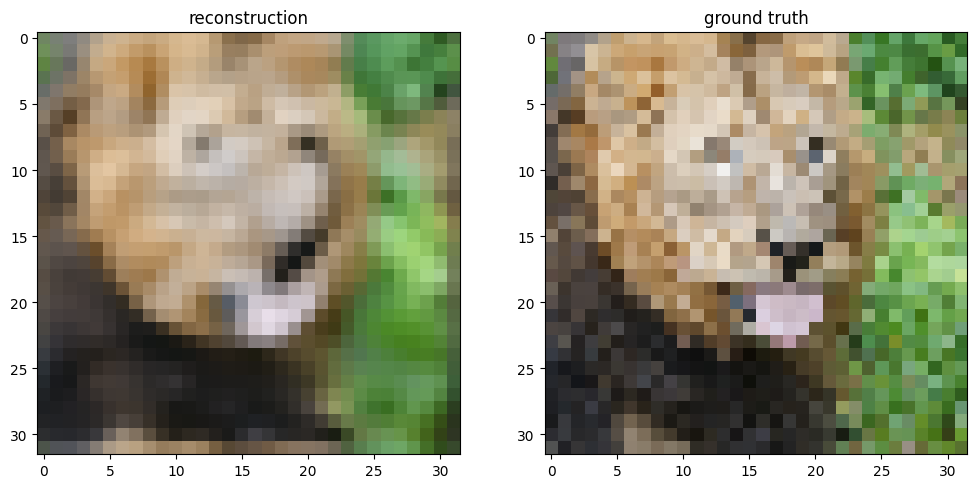

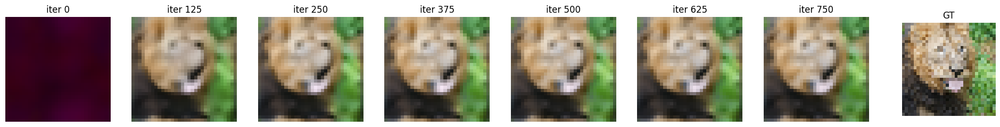

training gauss_1.0


  0%|          | 0/1000 [00:00<?, ?it/s]

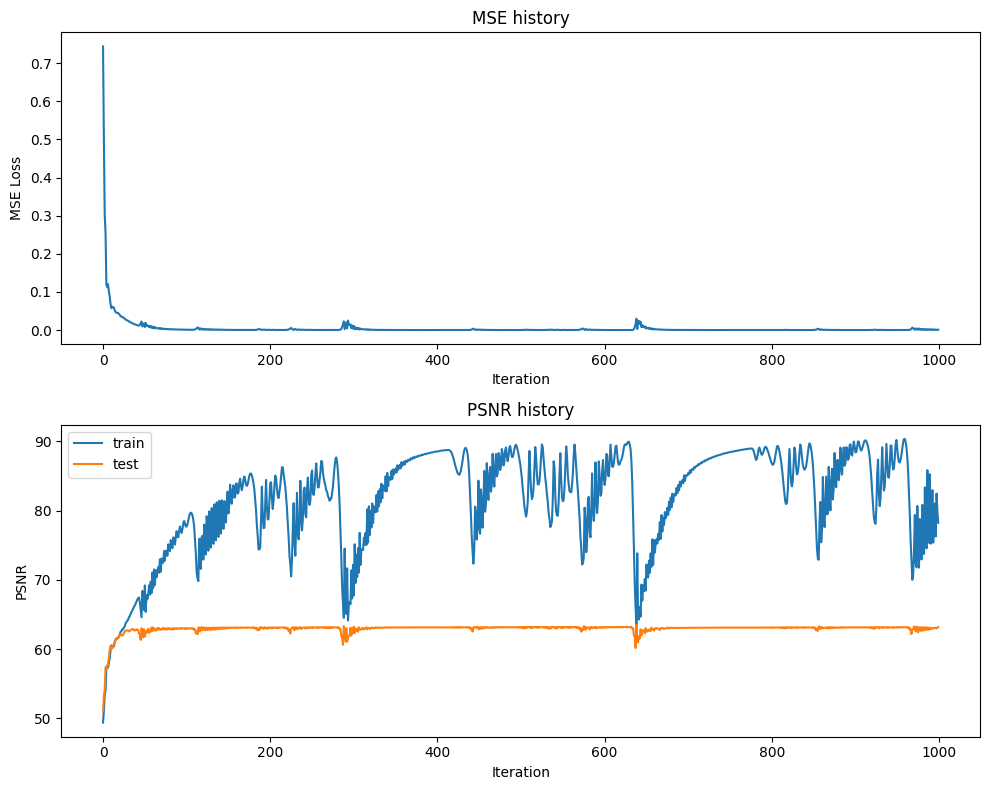

Final Test MSE 0.03129625602842427
Final Test psnr 63.17587974869393


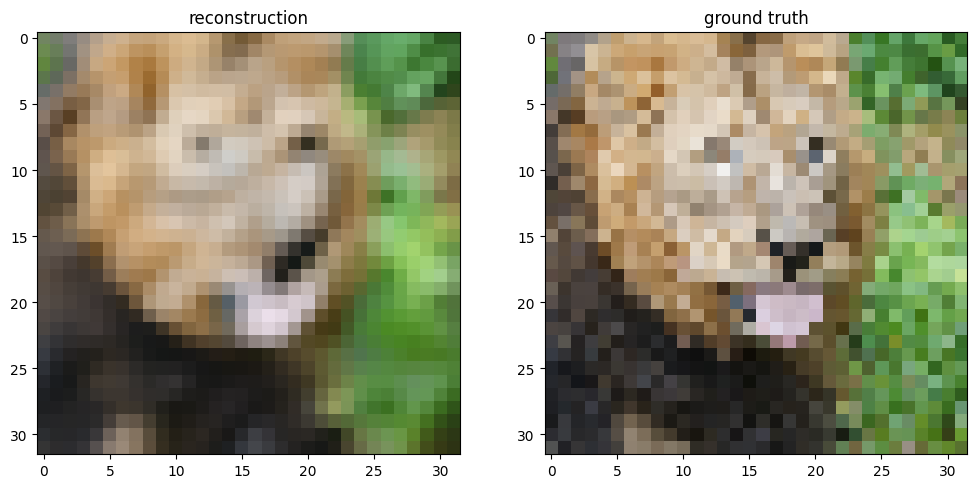

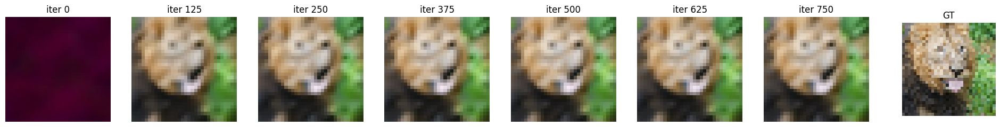

training NN of depth 15


  0%|          | 0/3 [00:00<?, ?it/s]

training none


  0%|          | 0/1000 [00:00<?, ?it/s]

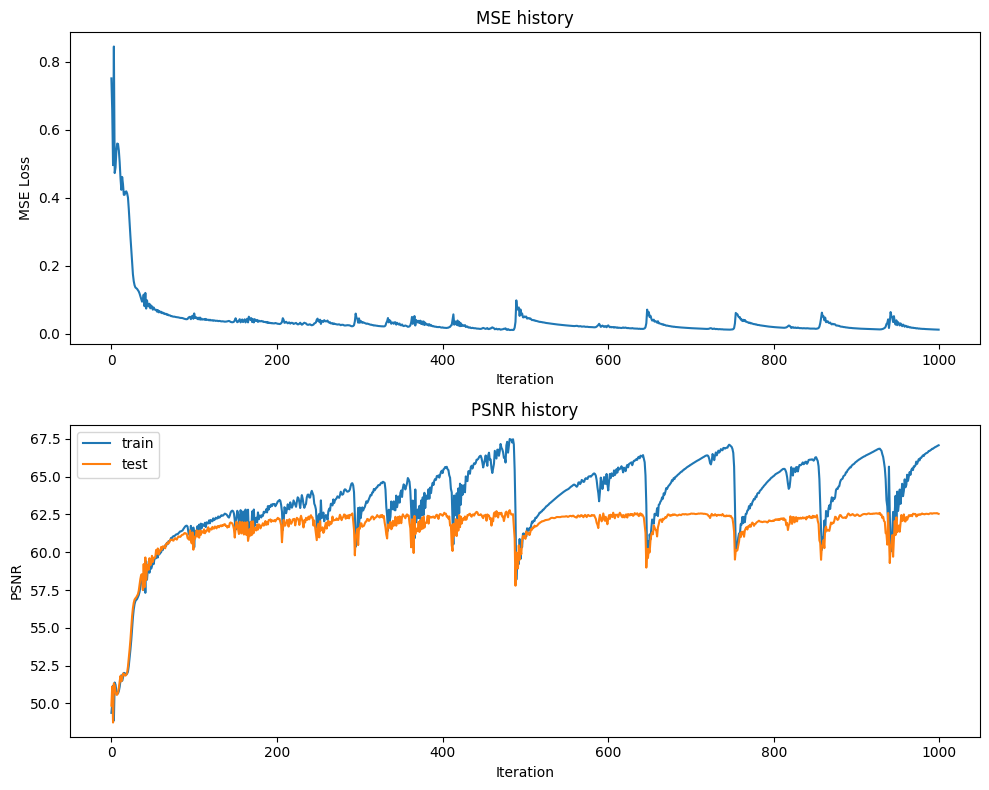

Final Test MSE 0.036261980348970206
Final Test psnr 62.53628842654344


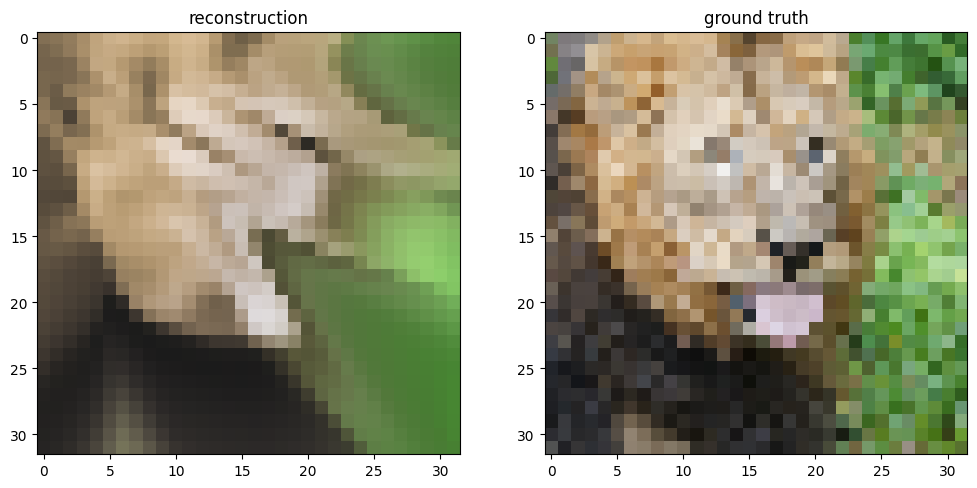

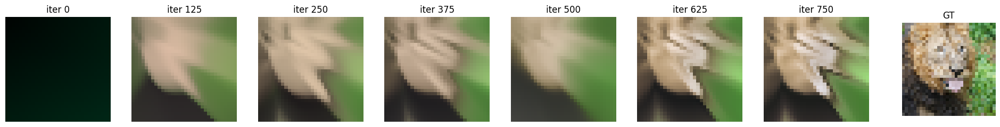

training basic


  0%|          | 0/1000 [00:00<?, ?it/s]

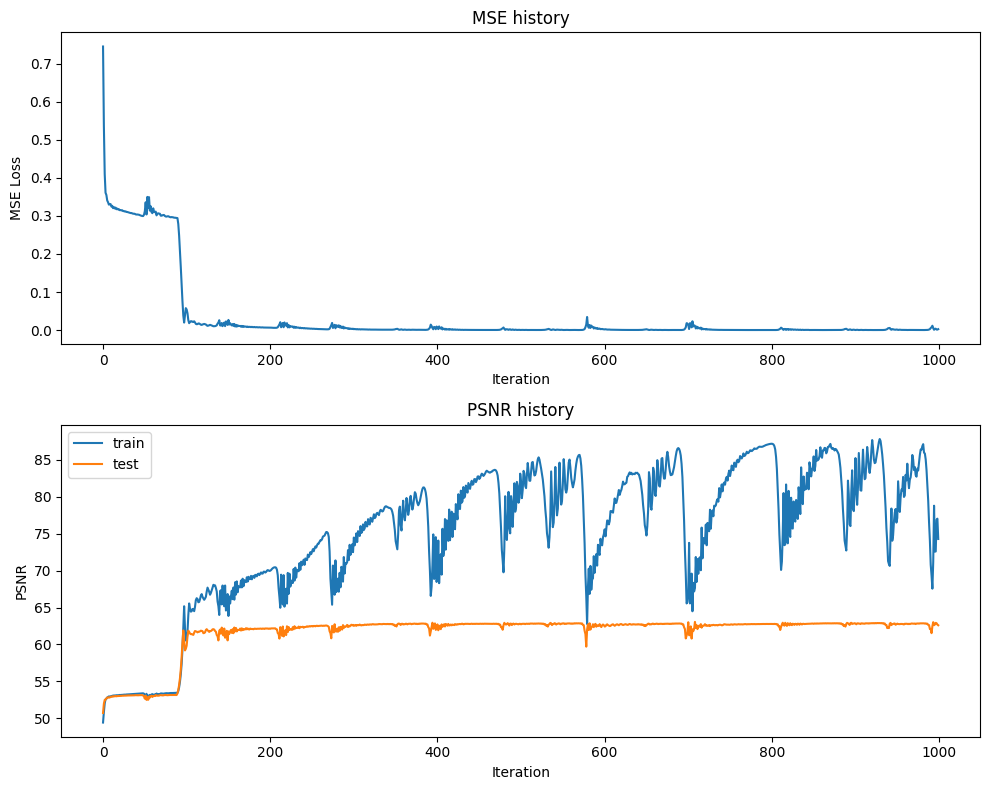

Final Test MSE 0.03578114940739277
Final Test psnr 62.59426073455159


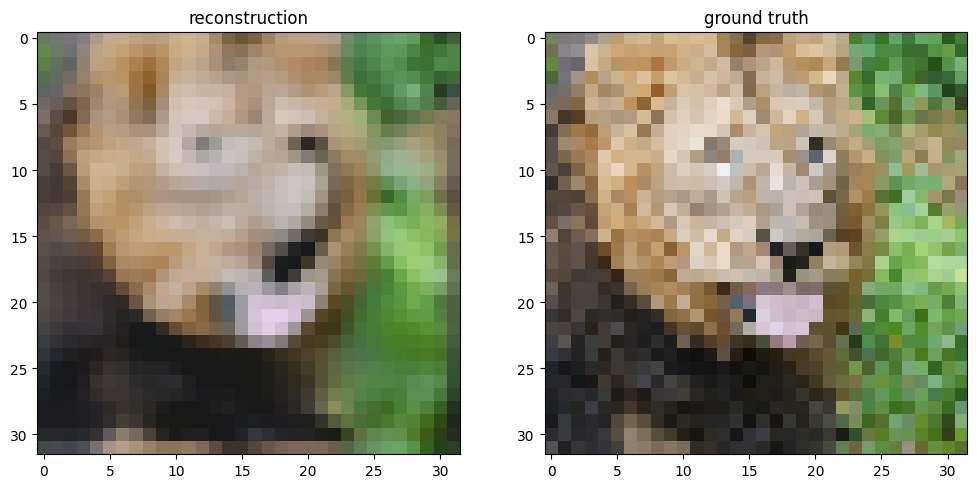

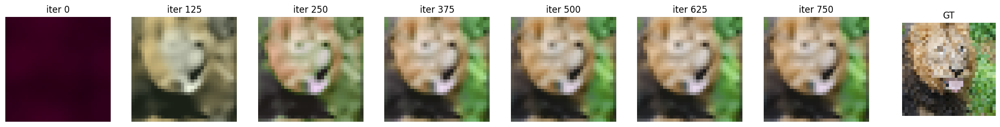

training gauss_1.0


  0%|          | 0/1000 [00:00<?, ?it/s]

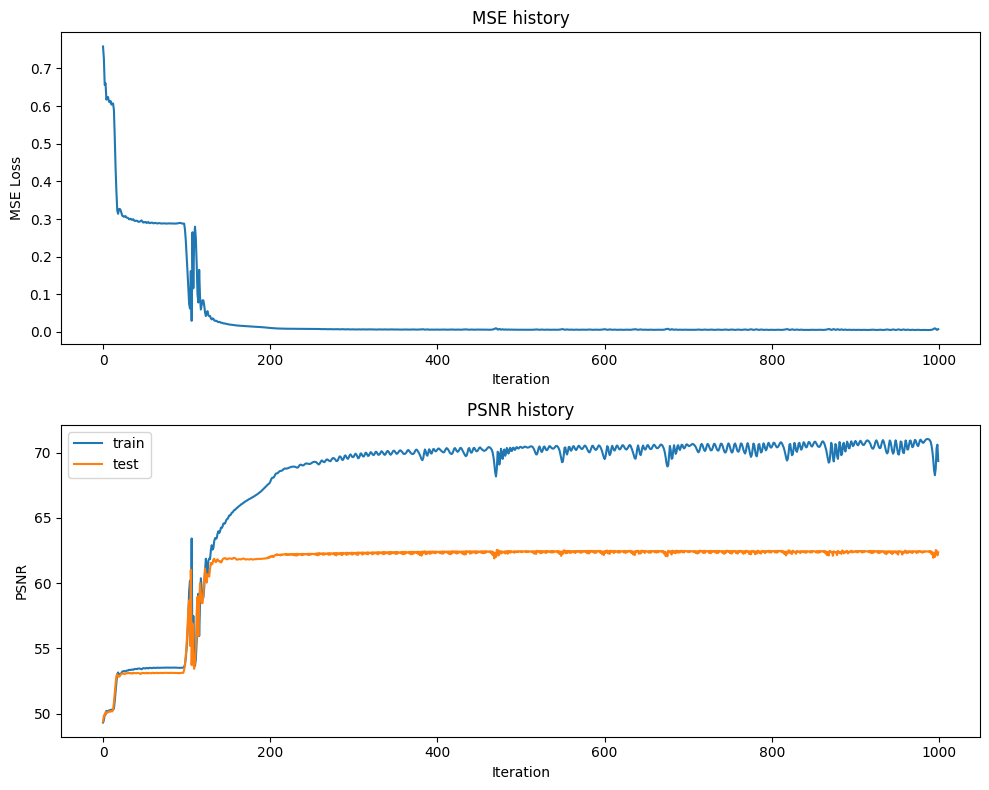

Final Test MSE 0.03774870208920139
Final Test psnr 62.36178336960667


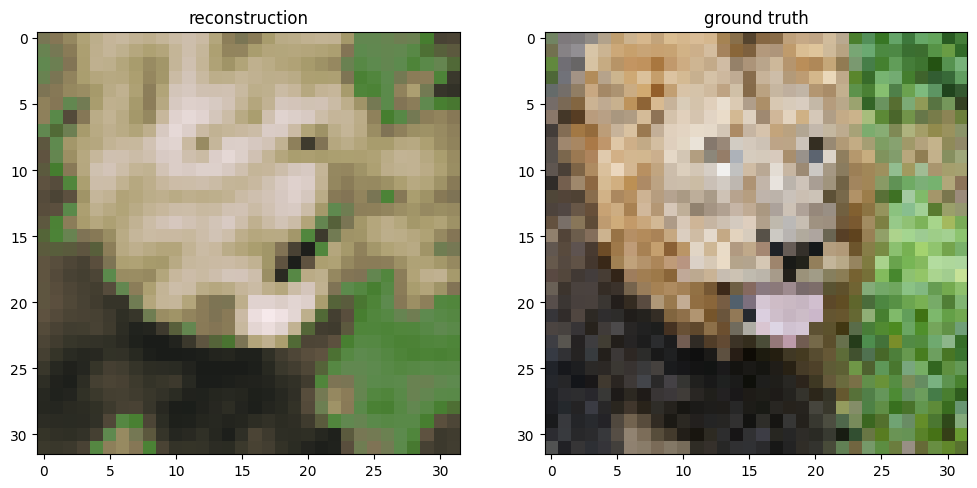

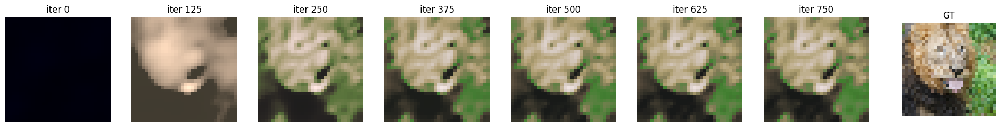

In [ ]:
### num_layers = [5, 10, 15] ###

opt = "Adam"
outputs = {}
for i in [5, 10, 15]:
  print("training NN of depth", i)
  for k in tqdm(B_dict):
    print("training", k)
    outputs[k] = train_wrapper1(k, size, opt, i)

training NN of depth 5


  0%|          | 0/3 [00:00<?, ?it/s]

training none


  0%|          | 0/1000 [00:00<?, ?it/s]

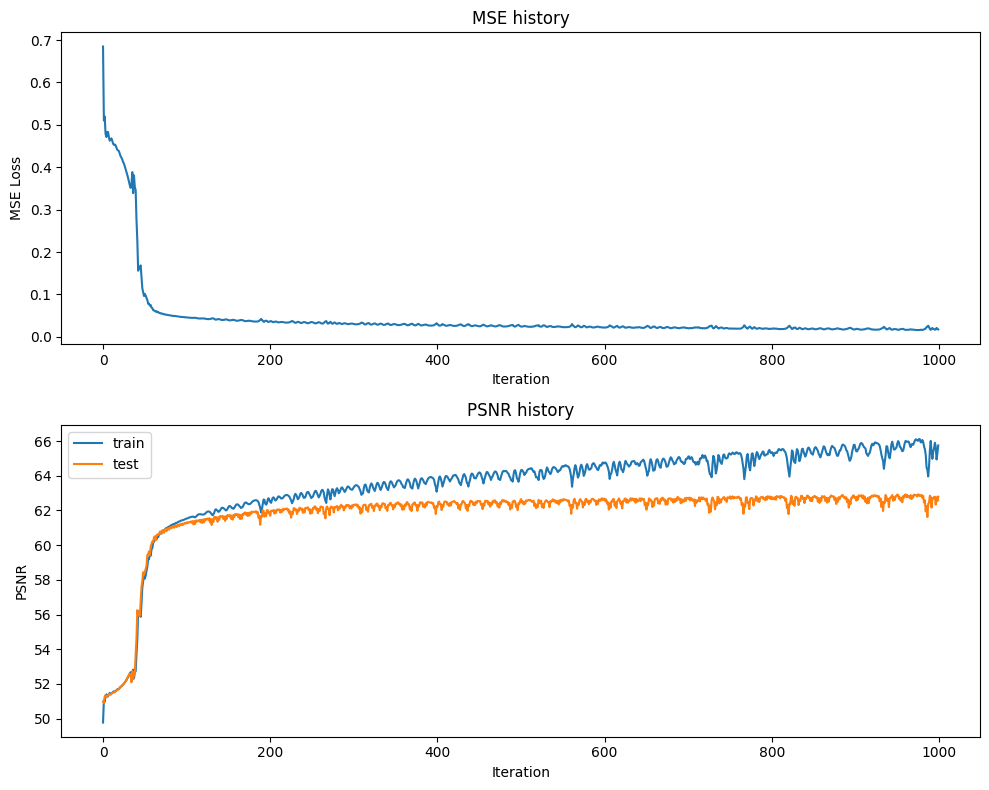

Final Test MSE 0.03415739023804819
Final Test psnr 62.795956794279924


<ipython-input-12-afe762edcc7f>:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, N+1, N+1)


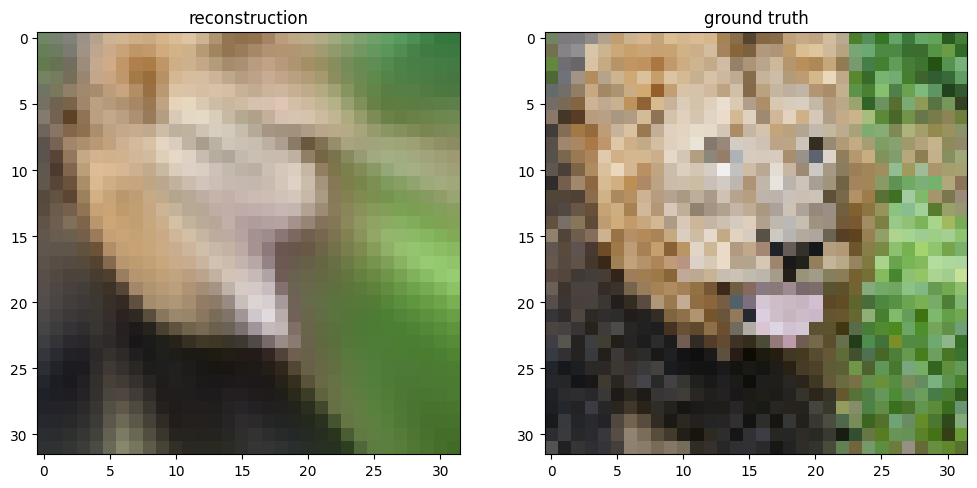

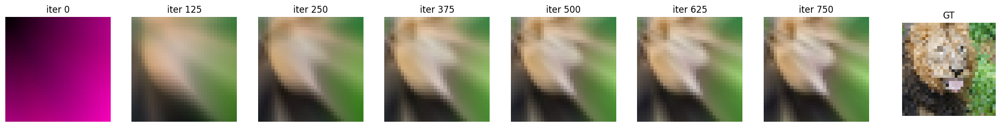

training basic


  0%|          | 0/1000 [00:00<?, ?it/s]

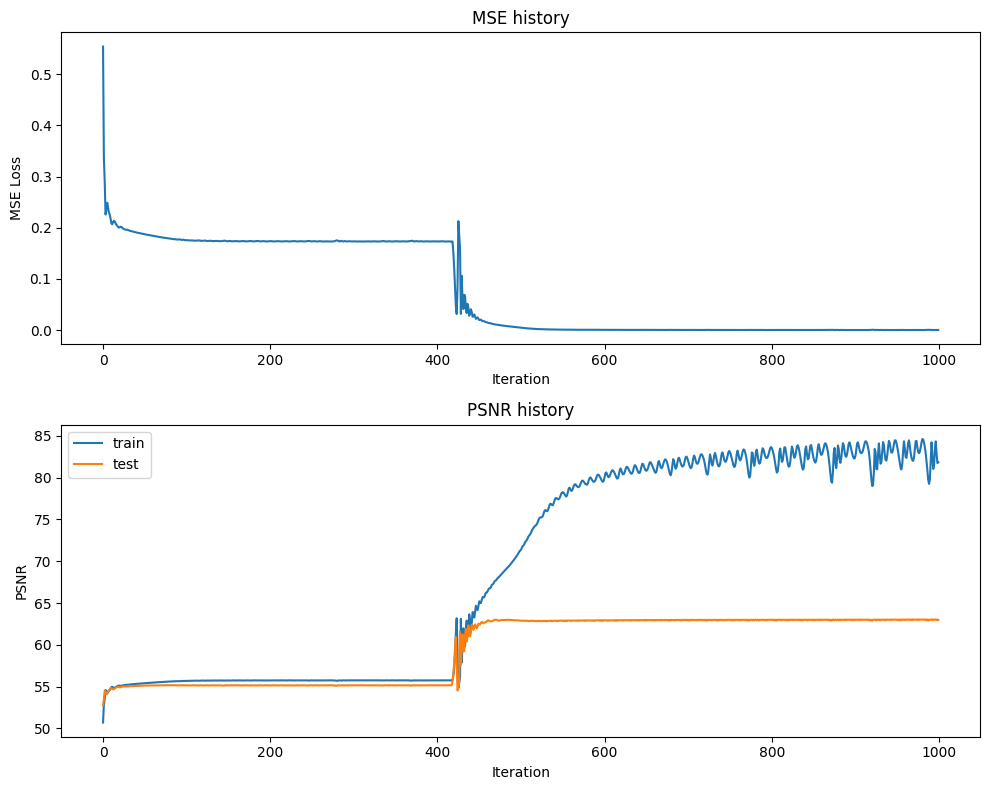

Final Test MSE 0.03274885116090864
Final Test psnr 62.97884291447872


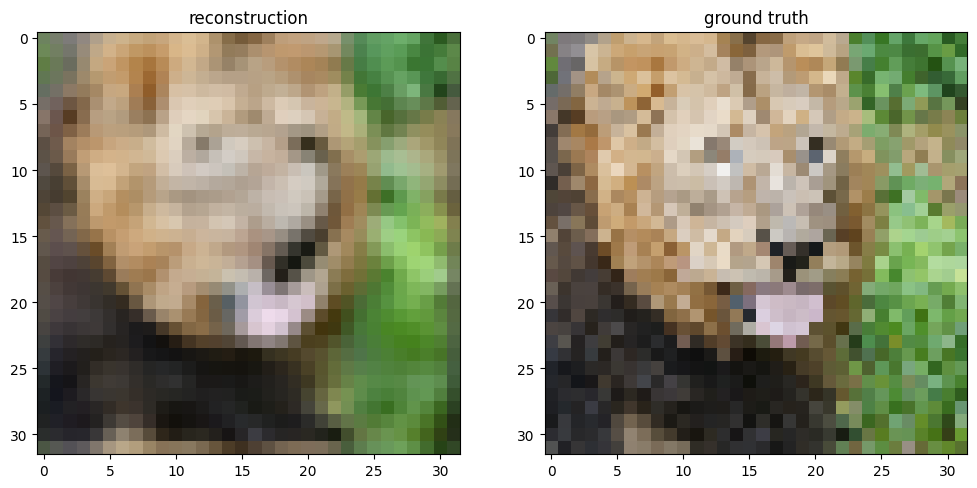

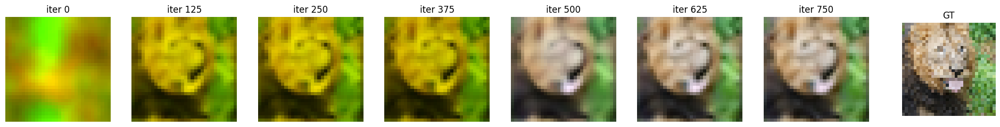

training gauss_1.0


  0%|          | 0/1000 [00:00<?, ?it/s]

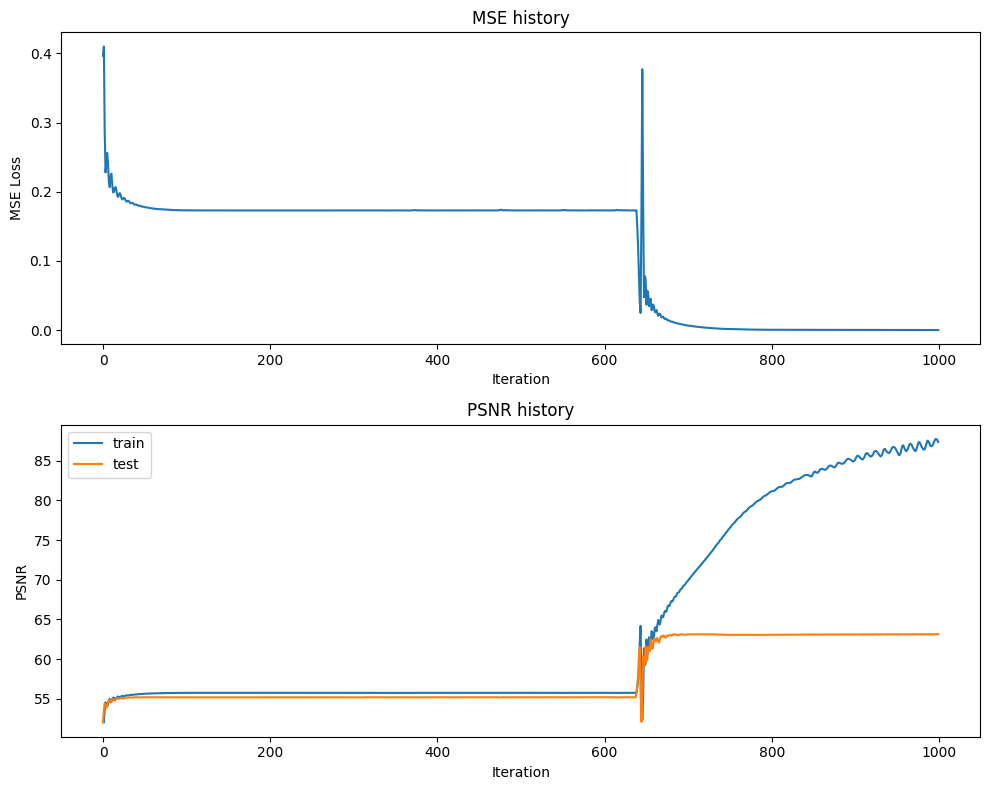

Final Test MSE 0.03148894341792697
Final Test psnr 63.14922272332425


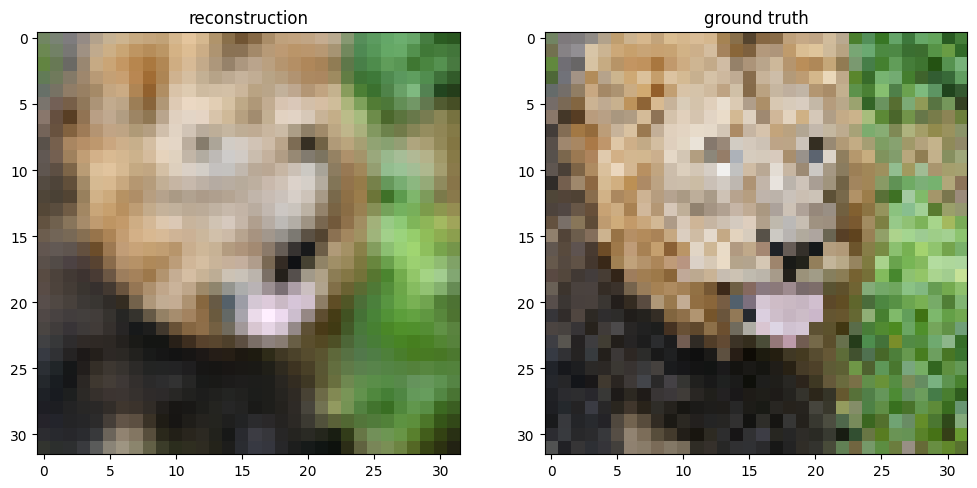

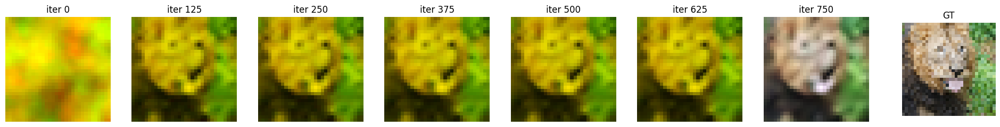

In [34]:
### num_layers = 5 ###

opt = "Adam"
outputs = {}
for i in [5]:
  print("training NN of depth", i)
  for k in tqdm(B_dict):
    print("training", k)
    outputs[k] = train_wrapper1(k, size, opt, i)

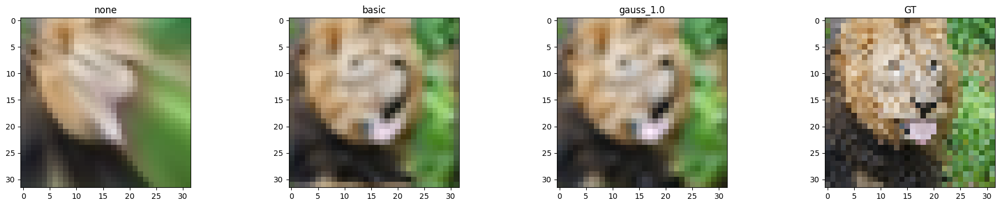

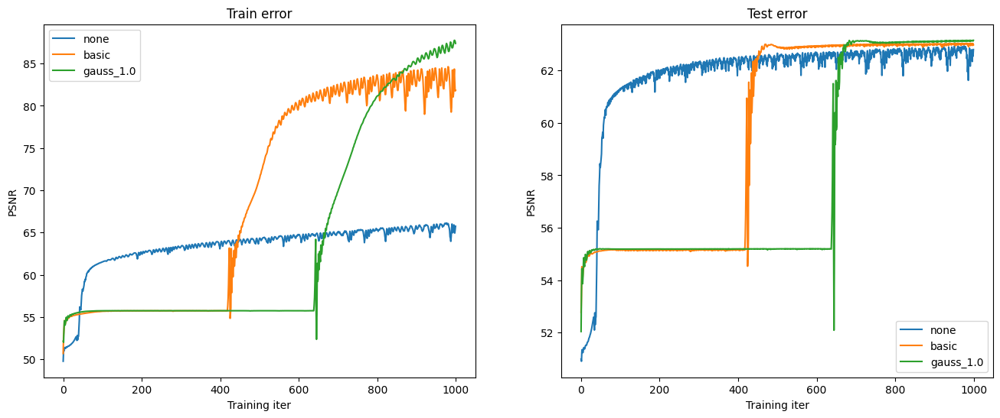

In [35]:
### num_layers = 5 ###

X_train, y_train, X_test, y_test = get_input_features(B_dict, "none")
plot_feature_mapping_comparison(outputs, y_test.reshape(size,size,3))

training NN of depth 10


  0%|          | 0/3 [00:00<?, ?it/s]

training none


  0%|          | 0/1000 [00:00<?, ?it/s]

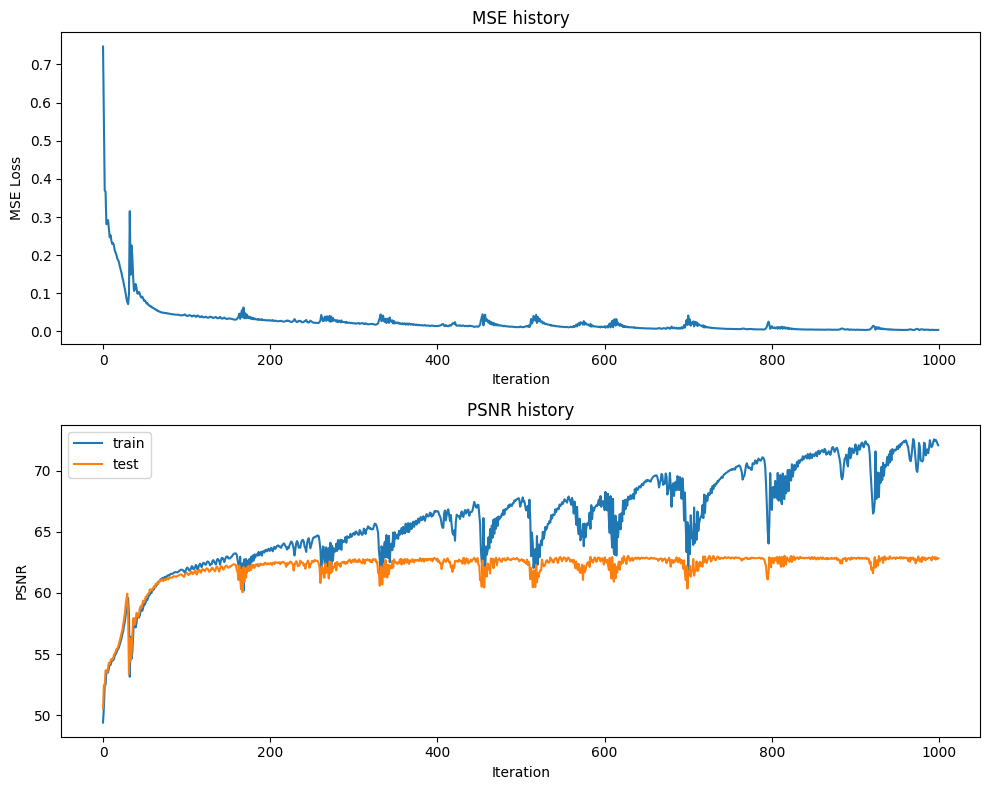

Final Test MSE 0.03385026773612819
Final Test psnr 62.835182528138596


<ipython-input-12-afe762edcc7f>:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, N+1, N+1)


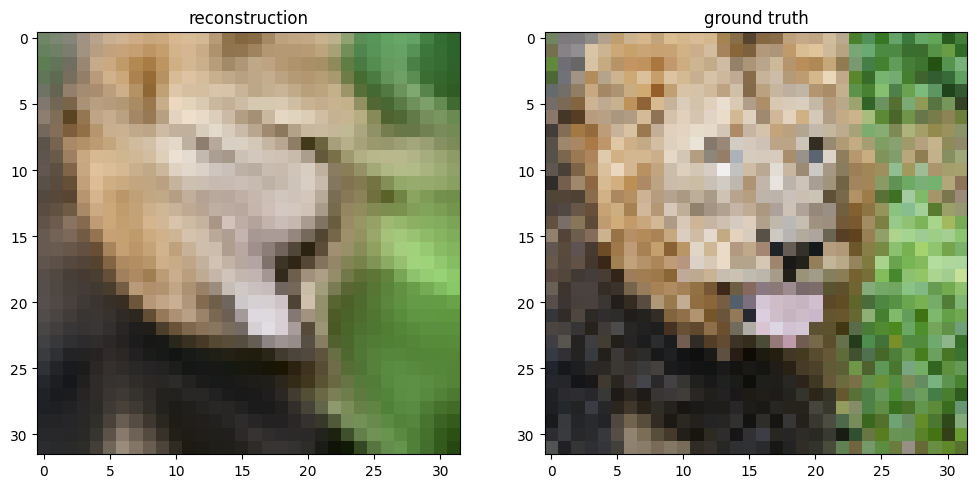

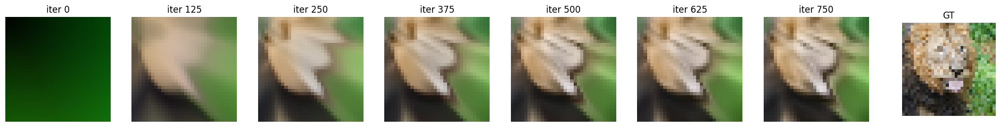

training basic


  0%|          | 0/1000 [00:00<?, ?it/s]

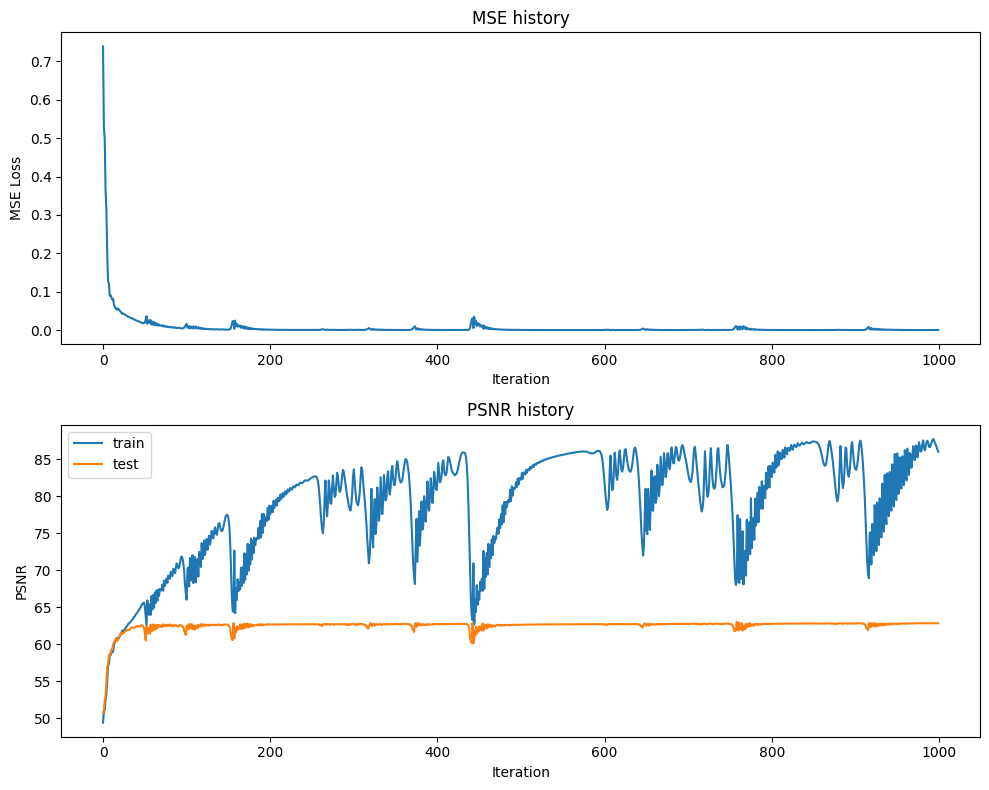

Final Test MSE 0.03362439575794128
Final Test psnr 62.86425872209853


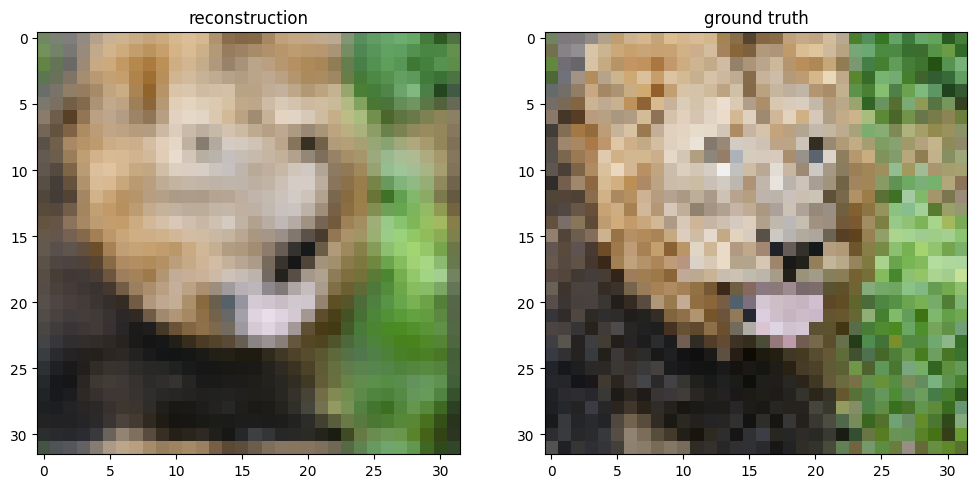

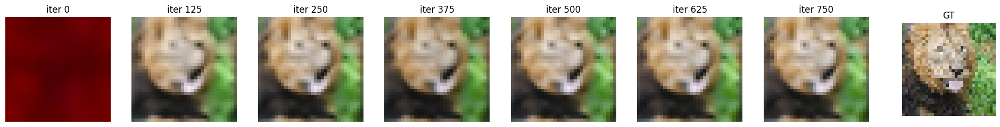

training gauss_1.0


  0%|          | 0/1000 [00:00<?, ?it/s]

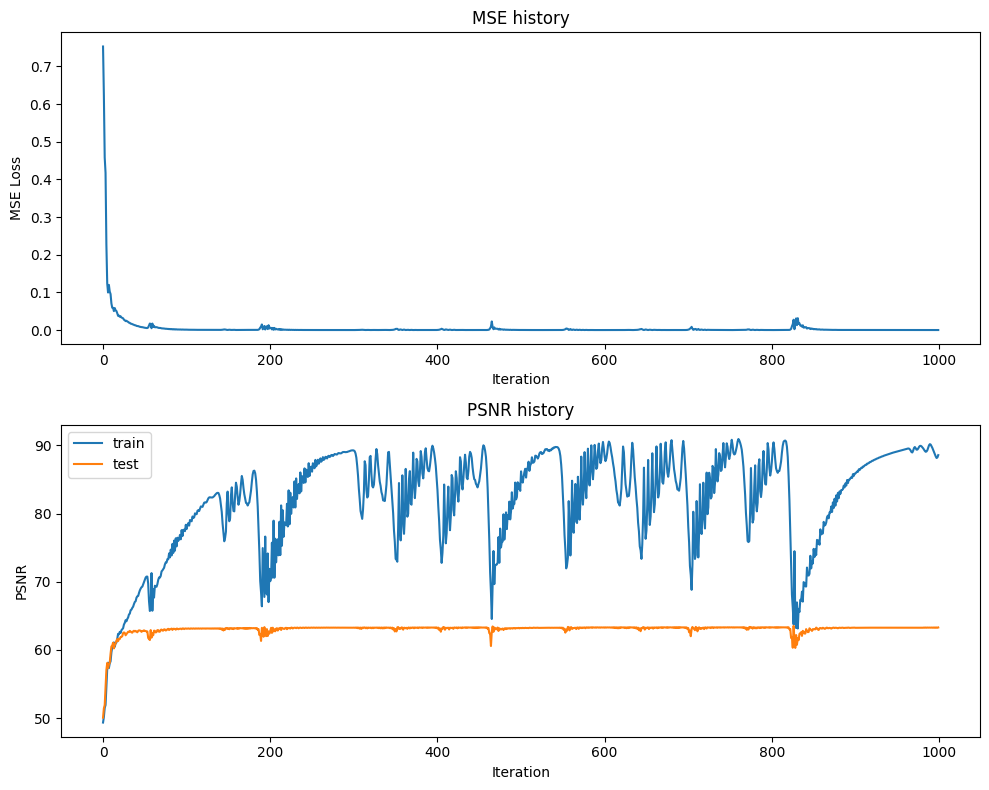

Final Test MSE 0.030438442320440906
Final Test psnr 63.29657937110586


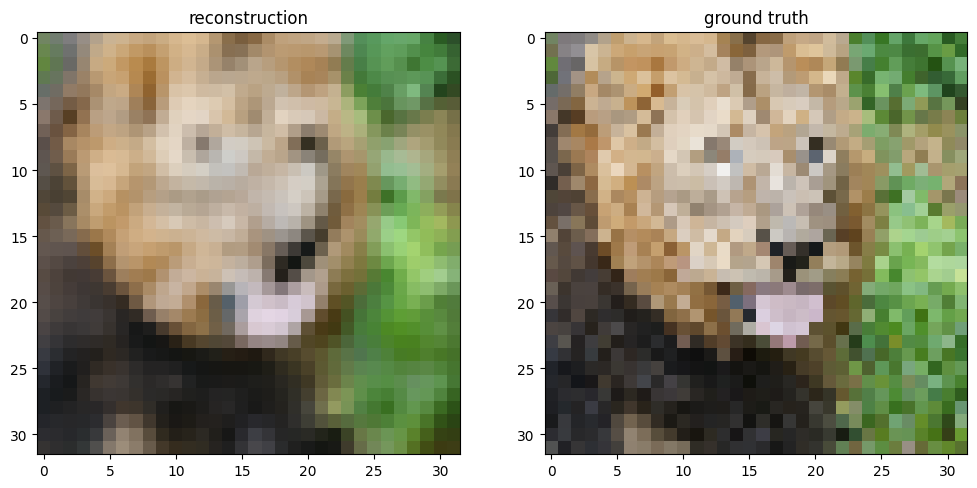

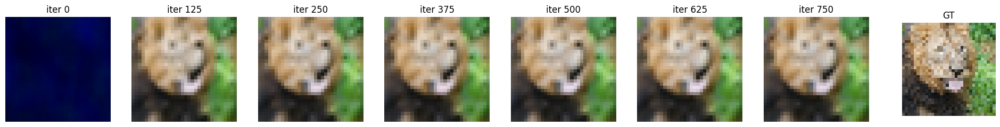

In [36]:
### num_layers = 10 ###

opt = "Adam"
outputs = {}
for i in [10]:
  print("training NN of depth", i)
  for k in tqdm(B_dict):
    print("training", k)
    outputs[k] = train_wrapper1(k, size, opt, i)

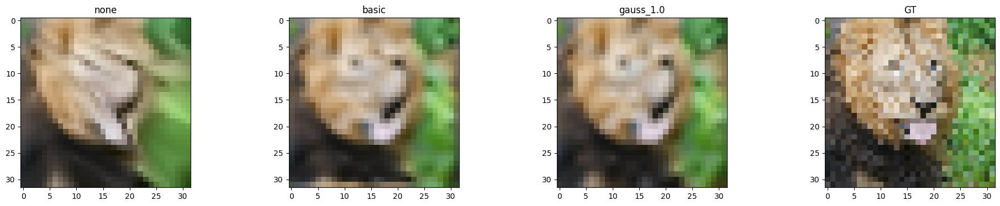

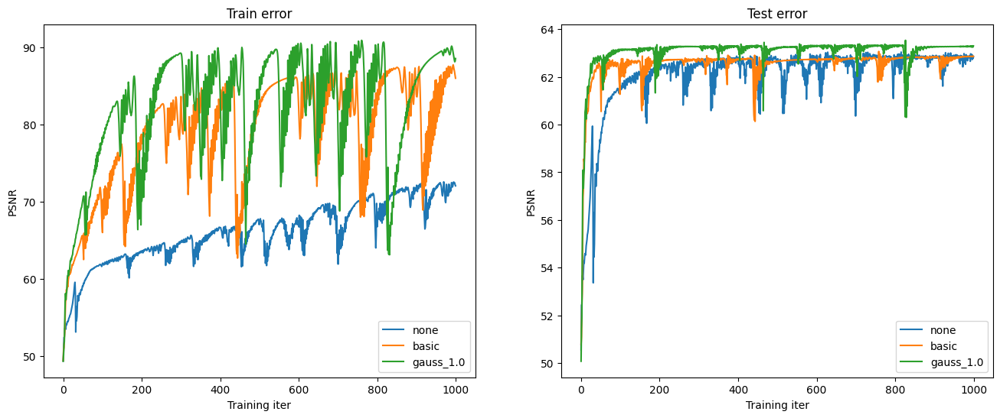

In [37]:
### num_layers = 10 ###

X_train, y_train, X_test, y_test = get_input_features(B_dict, "none")
plot_feature_mapping_comparison(outputs, y_test.reshape(size,size,3))

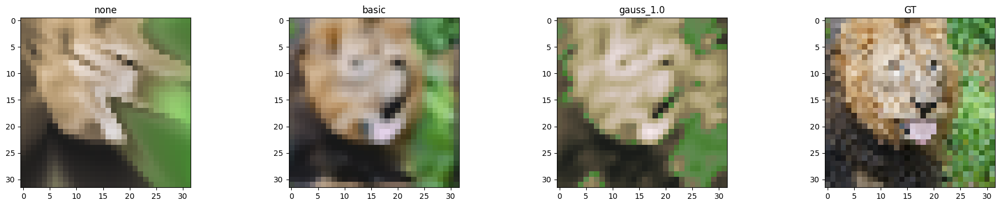

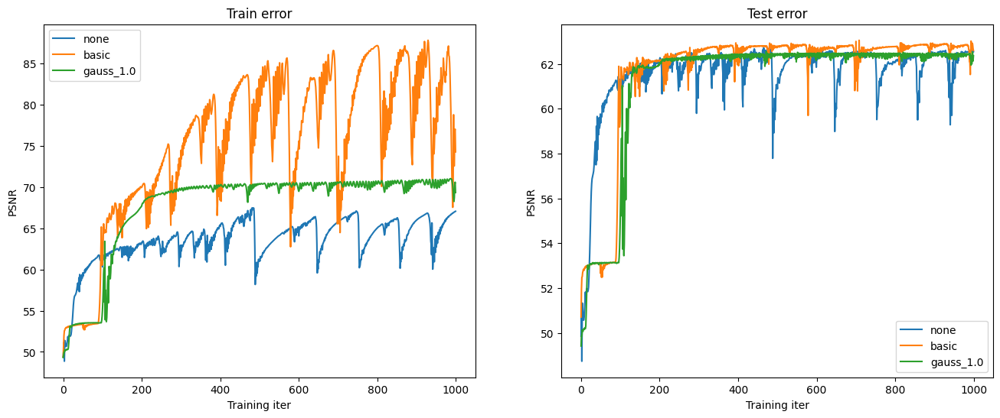

In [ ]:
### num_layers = 15 ###

X_train, y_train, X_test, y_test = get_input_features(B_dict, "none")
plot_feature_mapping_comparison(outputs, y_test.reshape(size,size,3))

# Extra Credit 2: hyperparameters of the Gaussian Fourier Feature mapping (m, sigma)

**Mapping Size**

<ipython-input-4-47d50880e2e8>:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(image_url)[..., :3] / 255.


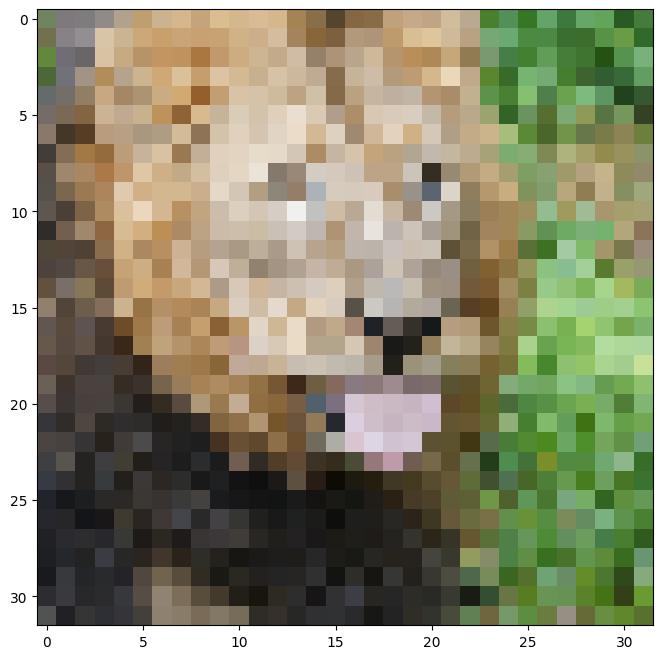

In [ ]:
### load dataset ###
size = 32
train_data, test_data = get_image(size)

training with mapping size: 4


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

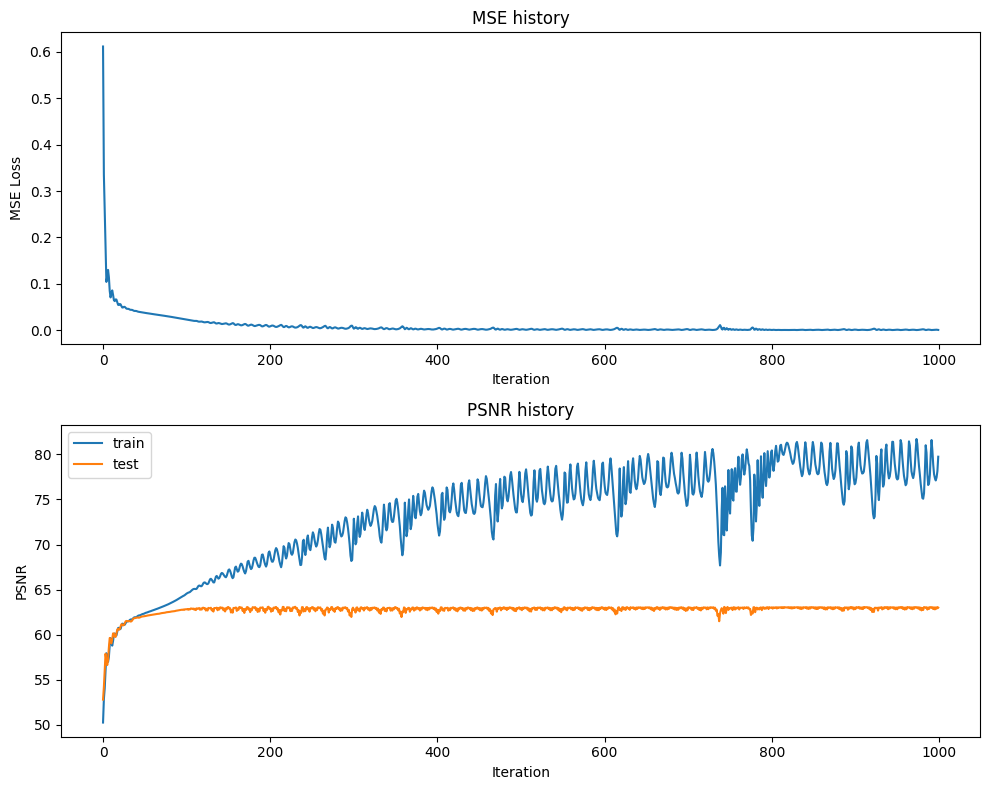

Final Test MSE 0.03250666069916597
Final Test psnr 63.011080027040585


<ipython-input-11-afe762edcc7f>:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, N+1, N+1)


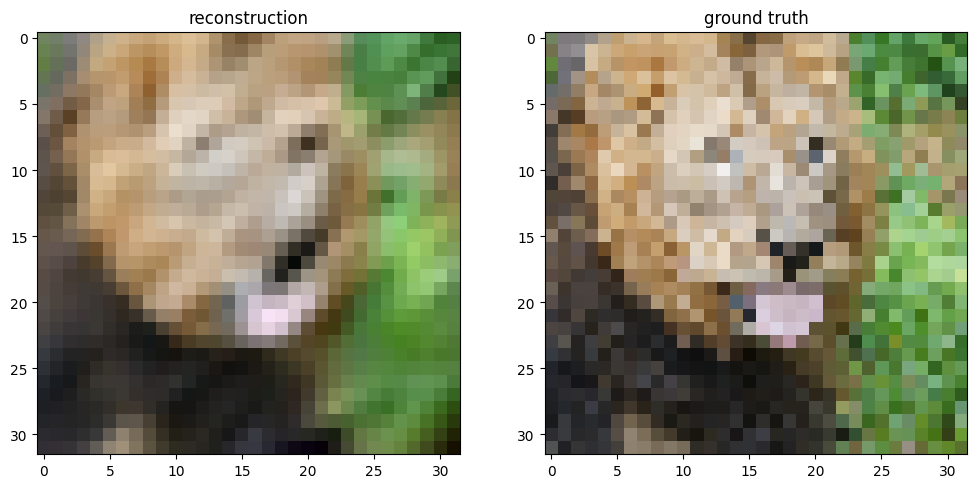

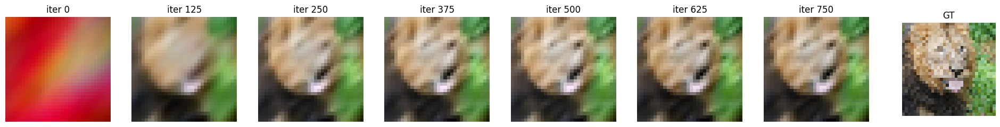

training with mapping size: 64


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

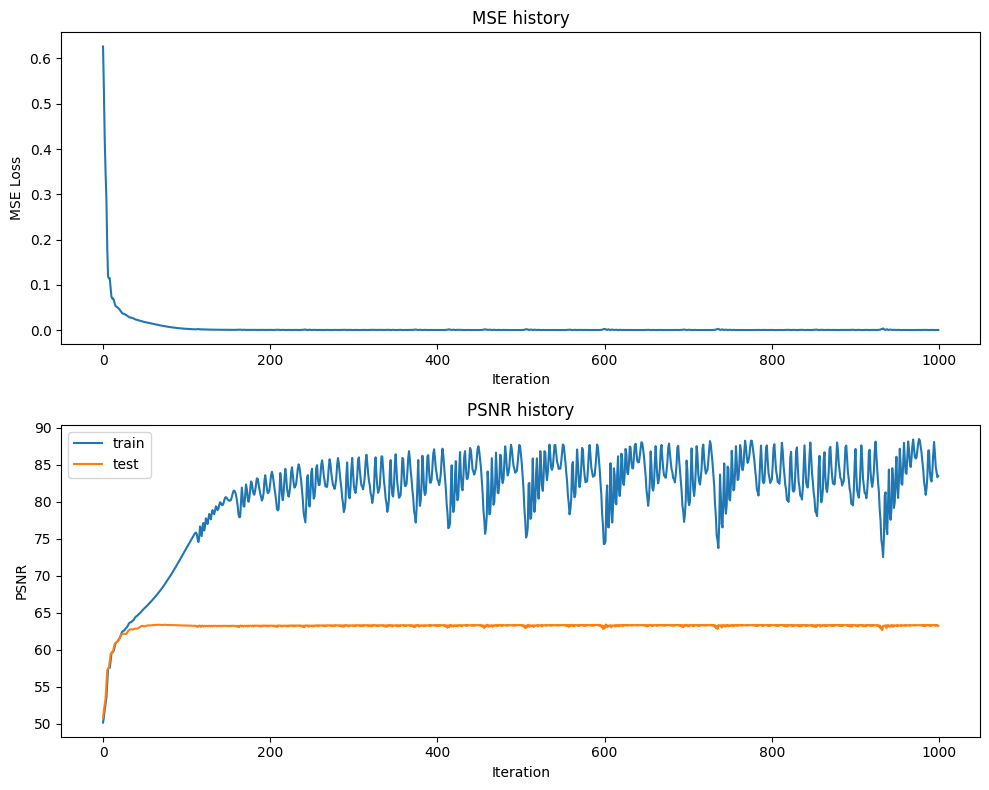

Final Test MSE 0.03089137277582274
Final Test psnr 63.232431526079765


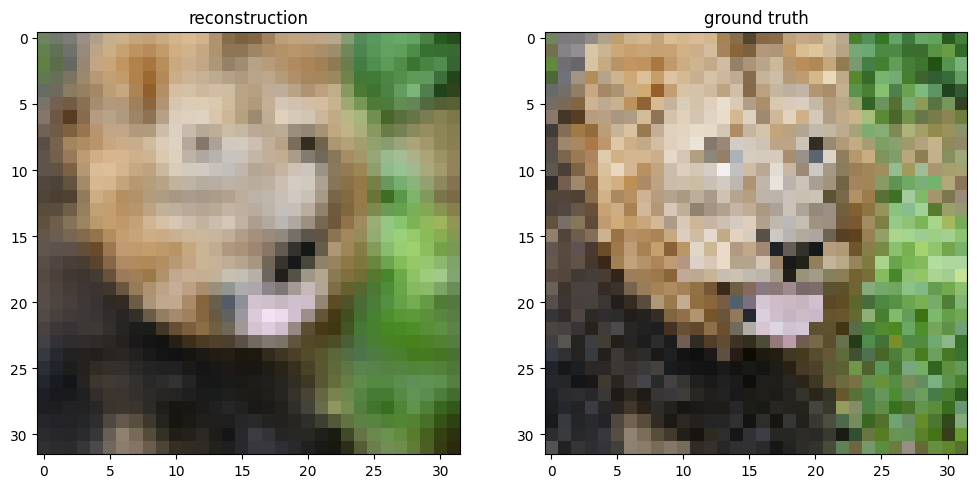

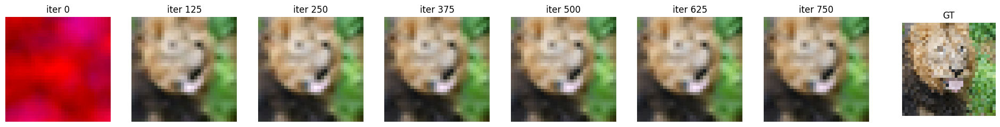

training with mapping size: 256


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

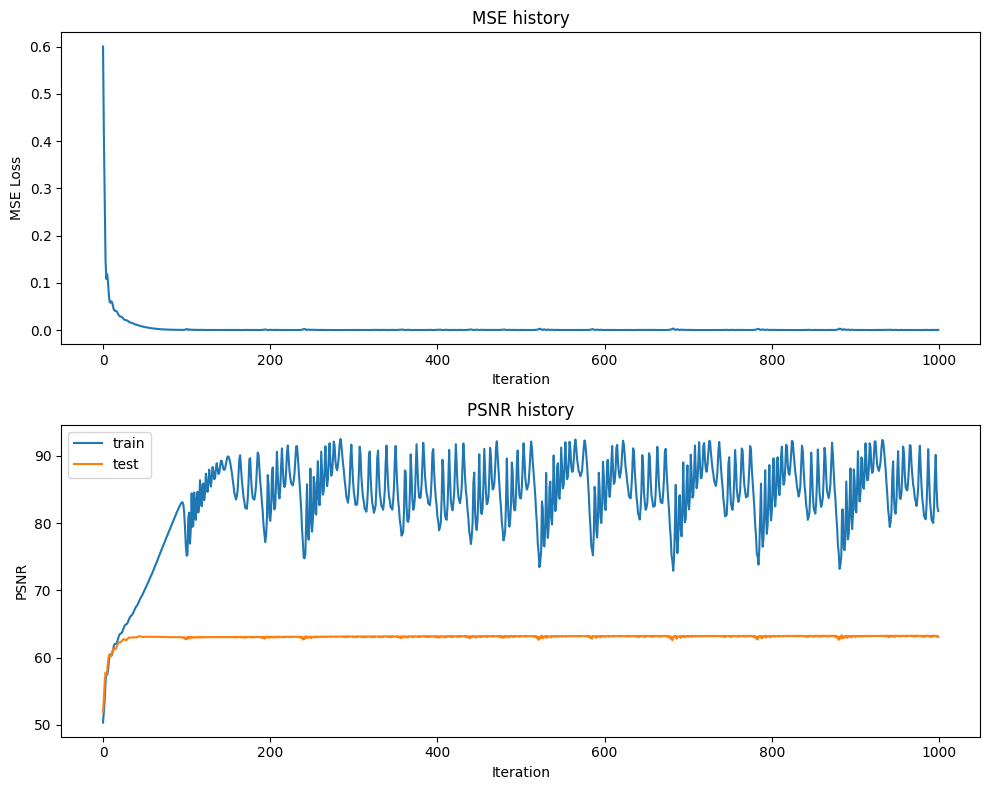

Final Test MSE 0.031915570309222964
Final Test psnr 63.09077751489974


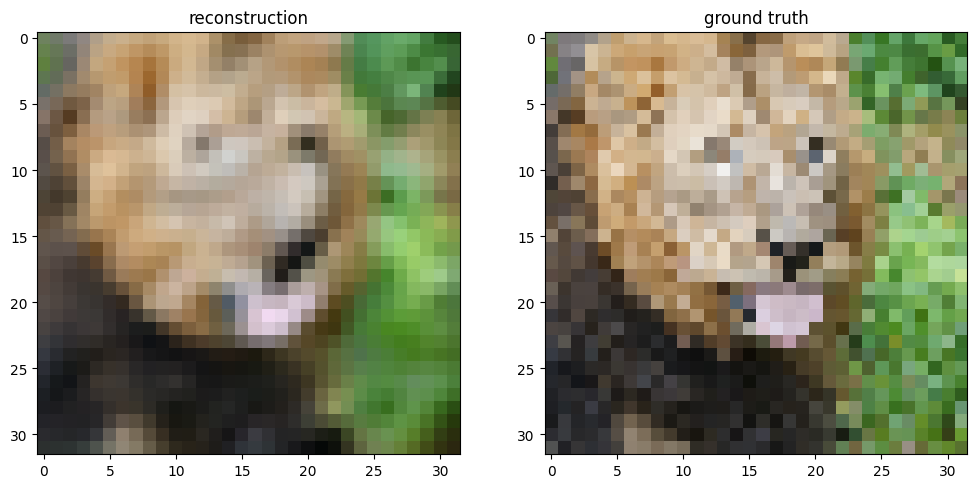

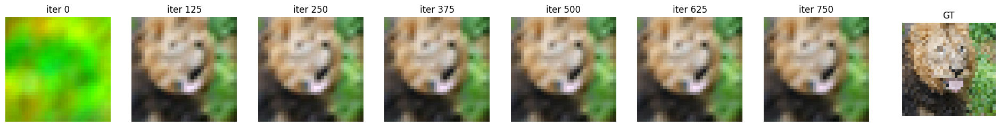

training with mapping size: 1024


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

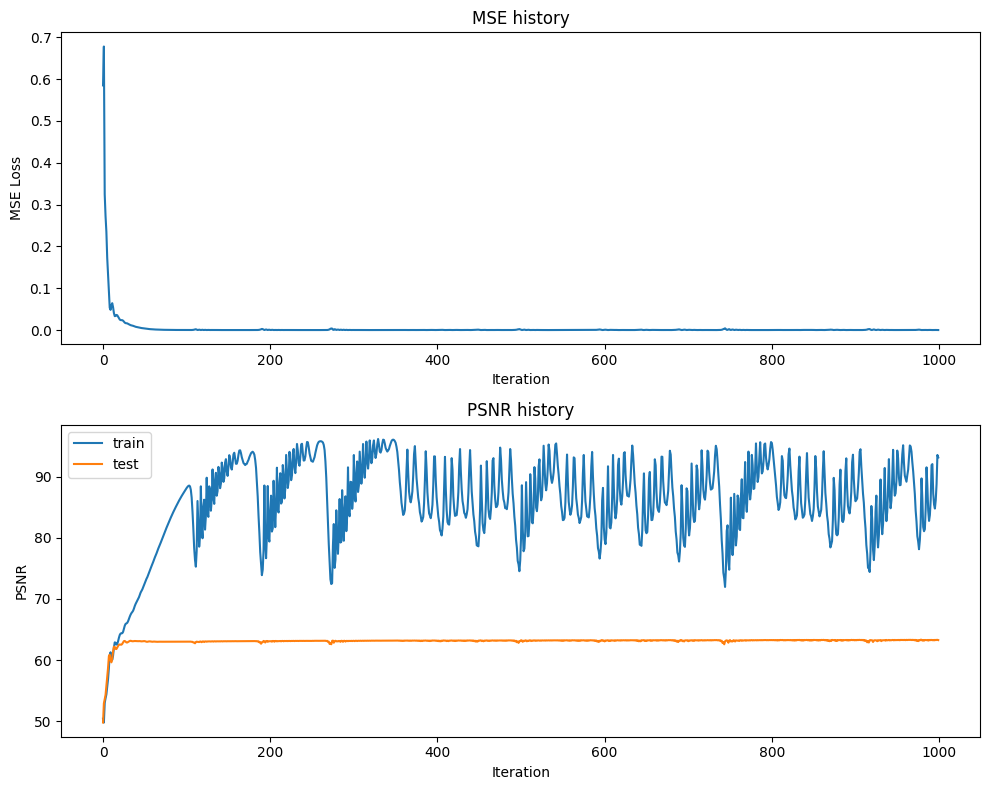

Final Test MSE 0.03051312688607247
Final Test psnr 63.285936458579755


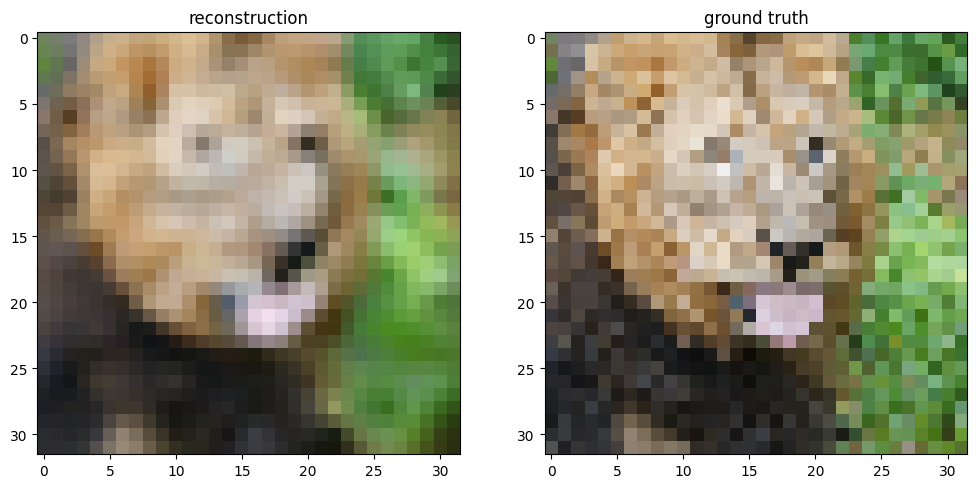

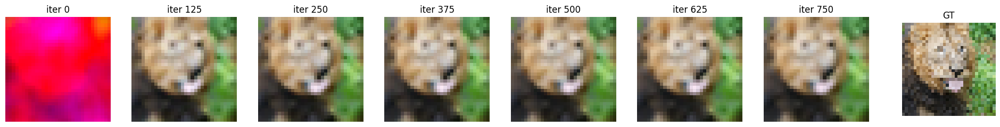

In [ ]:
### mapping_size = [4, 64, 256, 1024] ###

opt = "Adam"
outputs = {}
for i in [4, 64, 256, 1024]:
  print("training with mapping size:", i)
  for k in tqdm(B_dict):
    if k == "gauss_1.0":
      outputs[k] = train_wrapper(k, i, opt)
    else:
      continue

**Sigma**

In [ ]:
# Create the mappings dictionary of matrix B -  you will implement this
def get_B_dict_sigma(size):
  mapping_size = size // 2 # you may tweak this hyperparameter
  B_dict = {}

  B_dict["gauss_0.1"] = np.random.normal(0, 0.1, [mapping_size, 2])
  B_dict["gauss_1.0"] = np.random.normal(0, 1, [mapping_size, 2])
  B_dict["gauss_10"] = np.random.normal(0, 10, [mapping_size, 2])
  B_dict["gauss_100"] = np.random.normal(0, 100, [mapping_size, 2])

  return B_dict

In [ ]:
### sigma = [0.1, 1, 10, 100] ###

def train_wrapper_sigma(mapping, size, opt):
  # TODO implement
  # makes it easy to run all your mapping experiments in a for loop
  # this will similar to what you did previously in the last two sections

  # get input features
  # TODO implement this by using the get_B_dict() and get_input_features() helper functions
  num_layers = 5
  hidden_size = 256
  hidden_sizes = [hidden_size] * (num_layers - 1)
  epochs = 1000
  learning_rate = 1e-3
  input_size = 2
  output_size = 3
  B_dict = get_B_dict_sigma(size)
  X_train, y_train, X_test, y_test = get_input_features(B_dict, mapping)

  # run NN experiment on input features
  net, train_psnrs, test_psnrs, train_loss, predicted_images = NN_experiment(X_train, y_train, X_test, y_test, np.shape(X_train)[-1], num_layers,\
                    hidden_size, hidden_sizes, np.shape(y_train)[-1], epochs,\
                    learning_rate, opt)

  # TODO implement by using the NN_experiment() helper function

  # plot results of experiment
  plot_training_curves(train_loss, train_psnrs, test_psnrs)
  plot_reconstruction(net.forward(X_test), y_test)
  plot_reconstruction_progress(predicted_images, y_test)

  return {
      'net': net,
      'train_psnrs': train_psnrs,
      'test_psnrs': test_psnrs,
      'train_loss': train_loss,
      'pred_imgs': predicted_images
  }

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

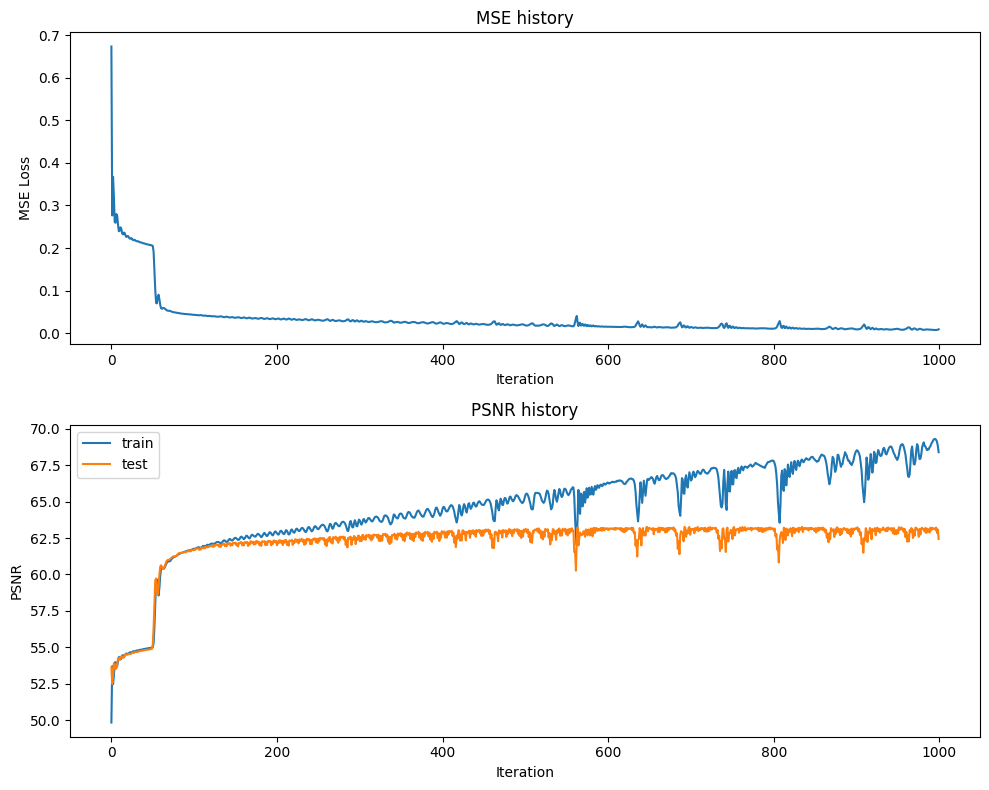

Final Test MSE 0.03711786485961867
Final Test psnr 62.43497374634536


<ipython-input-11-afe762edcc7f>:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, N+1, N+1)


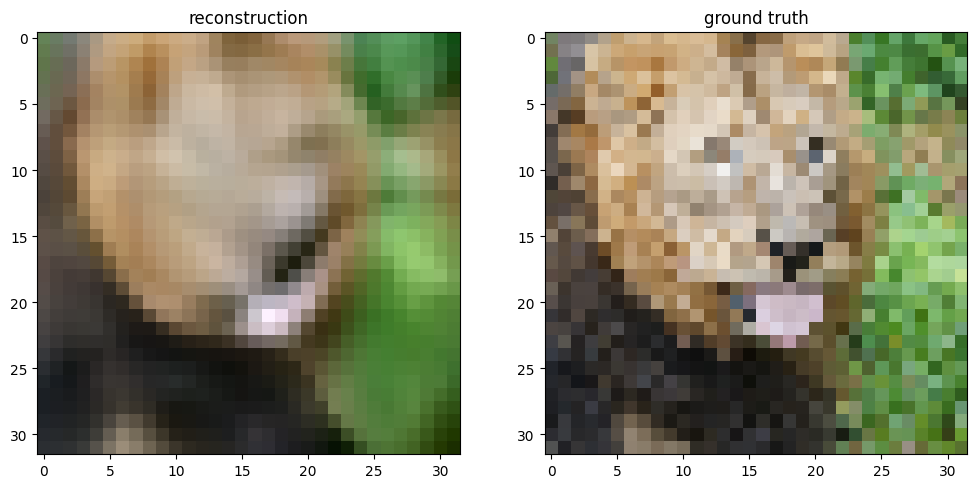

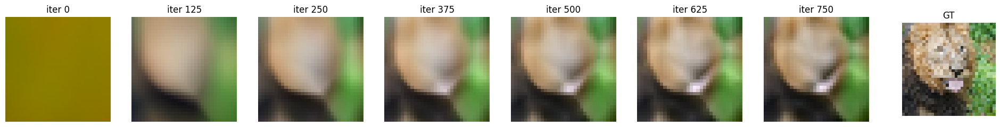

  0%|          | 0/1000 [00:00<?, ?it/s]

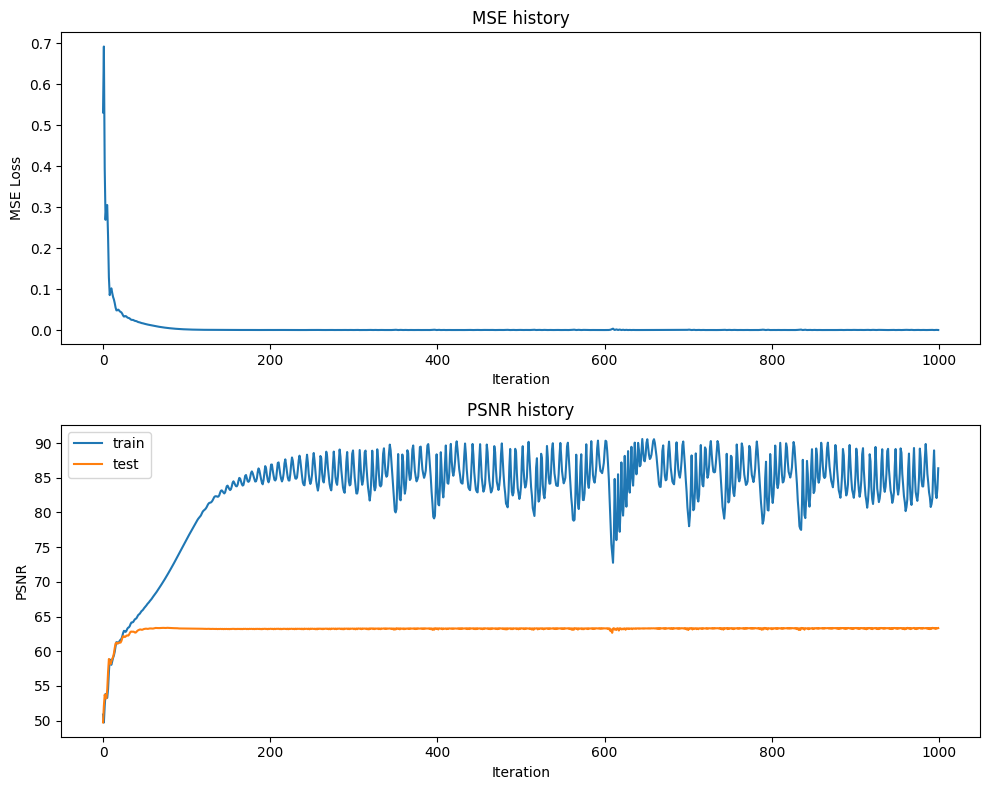

Final Test MSE 0.030131036664932186
Final Test psnr 63.340662869404994


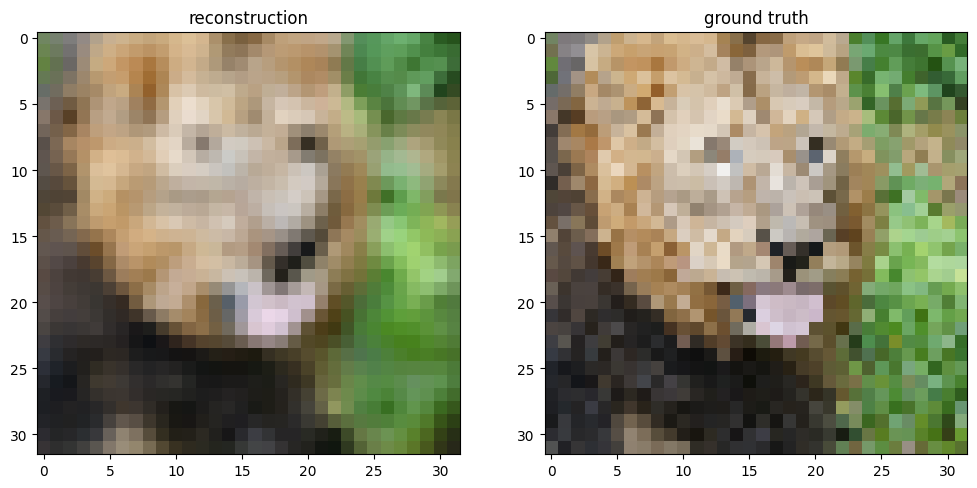

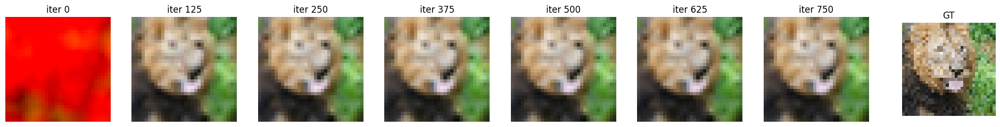

  0%|          | 0/1000 [00:00<?, ?it/s]

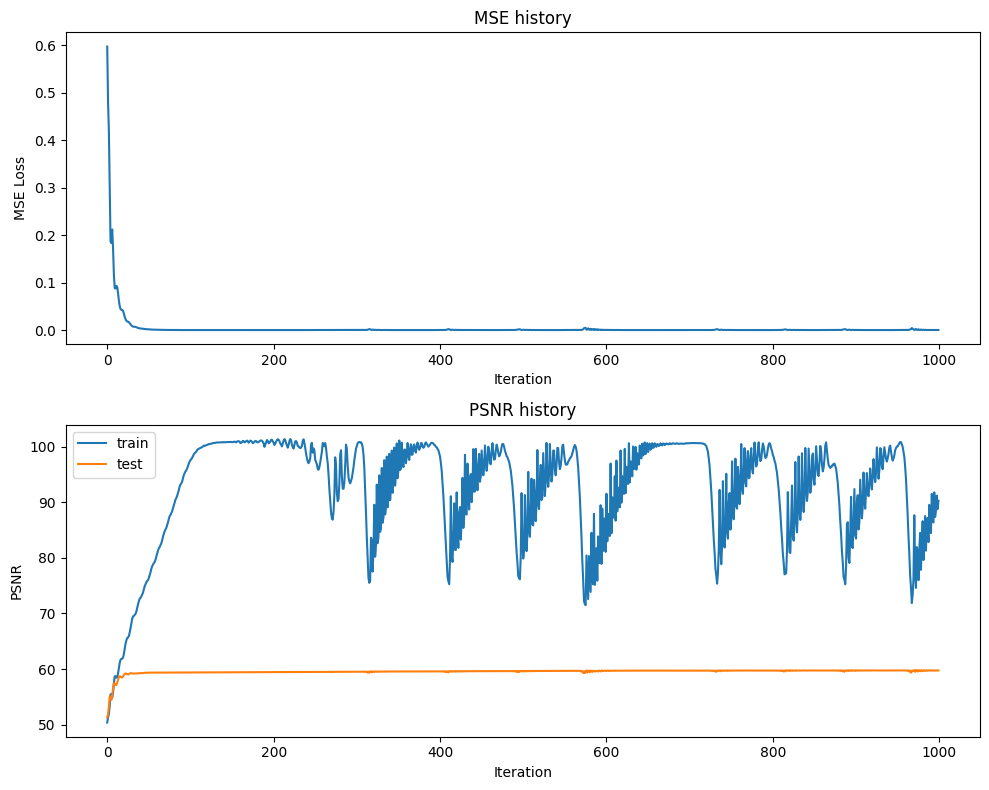

Final Test MSE 0.06907565682526709
Final Test psnr 59.73755337648774


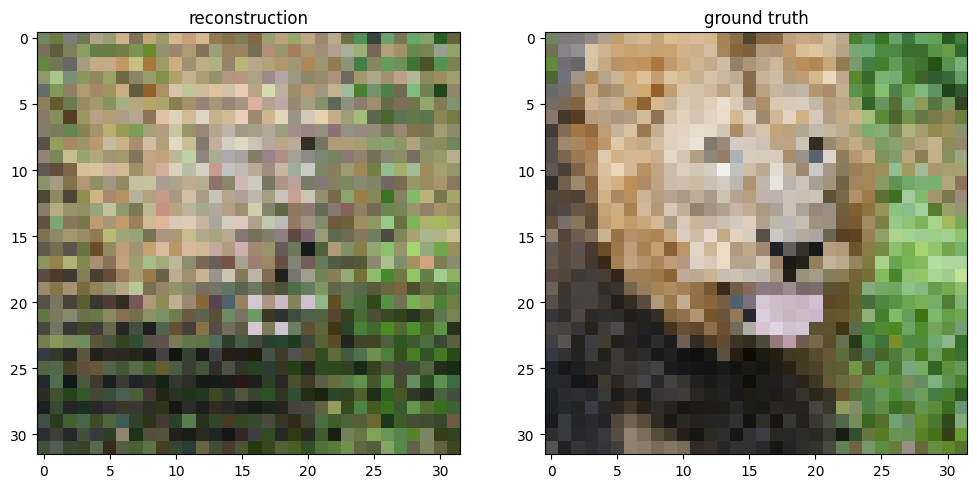

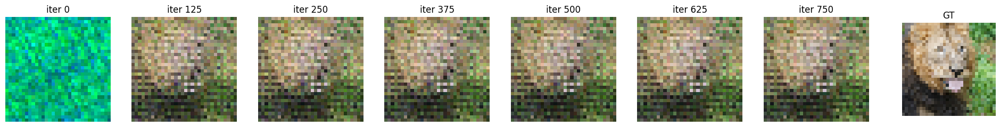

  0%|          | 0/1000 [00:00<?, ?it/s]

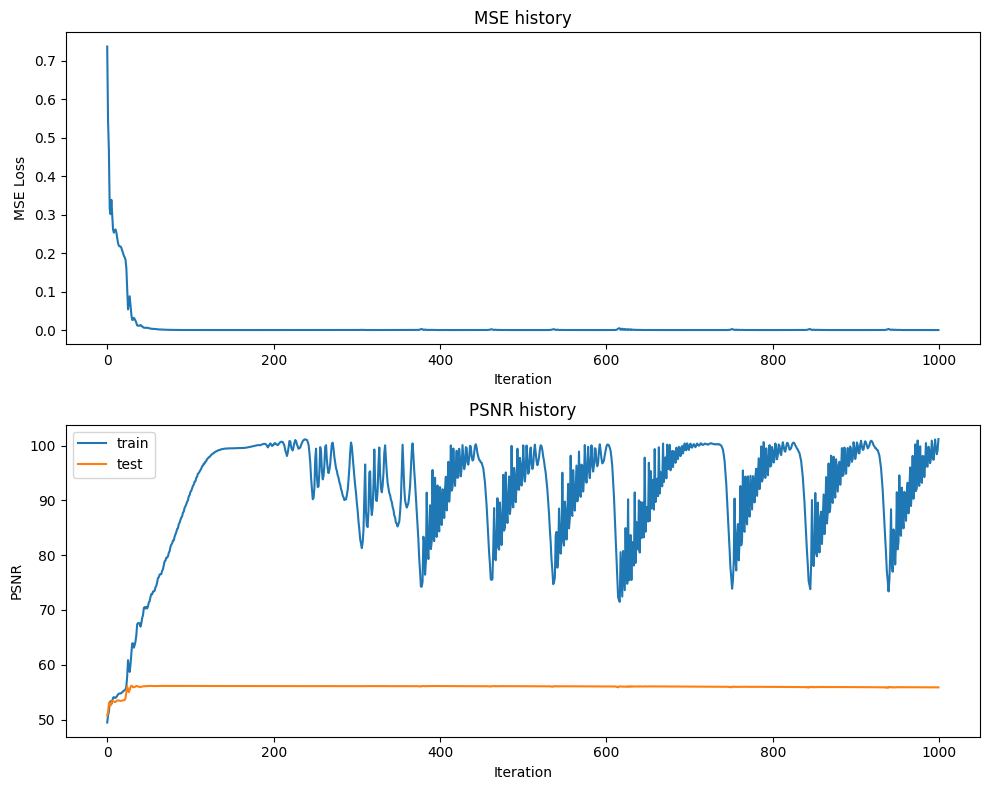

Final Test MSE 0.168007455748636
Final Test psnr 55.87751805816791


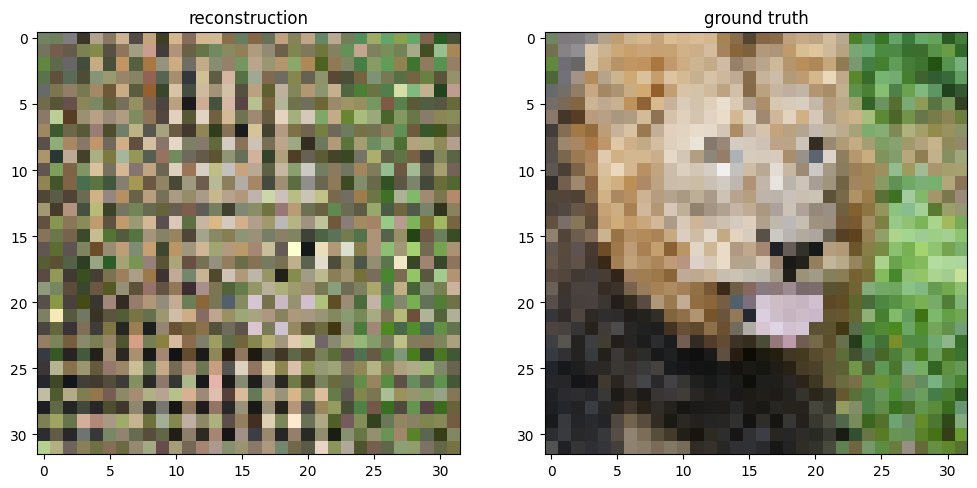

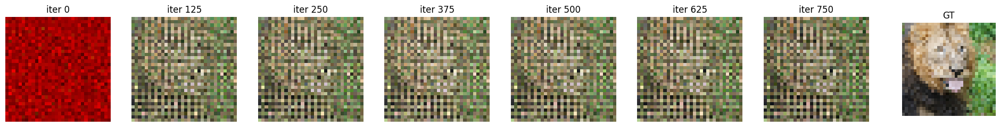

In [ ]:
### sigma = [0.1, 1, 10, 100] ###

opt = "Adam"
outputs = {}
size = 32
B_dict = get_B_dict_sigma(size)
for k in tqdm(B_dict):
  outputs[k] = train_wrapper_sigma(k, size, opt)

# Extra Credit 3: L1 loss, regularization, normalization

<ipython-input-4-47d50880e2e8>:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(image_url)[..., :3] / 255.


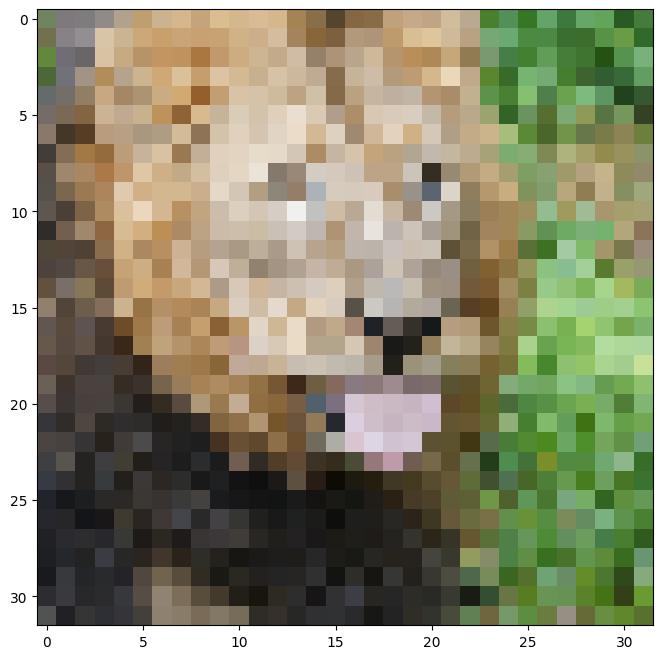

In [ ]:
### load dataset ###
size = 32
train_data, test_data = get_image(size)

In [ ]:
# Create the mappings dictionary of matrix B -  you will implement this
def get_B_dict(size):
  mapping_size = size // 2 # you may tweak this hyperparameter
  B_dict = {}
  B_dict['none'] = None

  # add B matrix for basic, gauss_1.0
  # TODO implement this

  B_dict["basic"] = np.identity(2)
  B_dict["gauss_1.0"] = np.random.normal(0, 1, [mapping_size, 2])

  return B_dict

In [ ]:
B_dict = get_B_dict(size)

**L1 Loss** *(Implementation in neural_net.py file)*



In [ ]:
### L1 loss ###

y = np.array([[2,3,4], [7,8,9], [1,2,3], [6,3,1]])
p = np.array([[3,3,3], [1,1,1], [3,3,3], [1,1,1]])
l1loss = np.sum(np.absolute(y - p)) / np.shape(y)[0]
print(l1loss)
l1loss_grad = (-1 * ((y - p) >= 0) + 1 * ((y - p) < 0)) / np.shape(y)[0]
print(l1loss_grad)

8.25
[[ 0.25 -0.25 -0.25]
 [-0.25 -0.25 -0.25]
 [ 0.25  0.25 -0.25]
 [-0.25 -0.25 -0.25]]


  0%|          | 0/3 [00:00<?, ?it/s]

training none


  0%|          | 0/1000 [00:00<?, ?it/s]

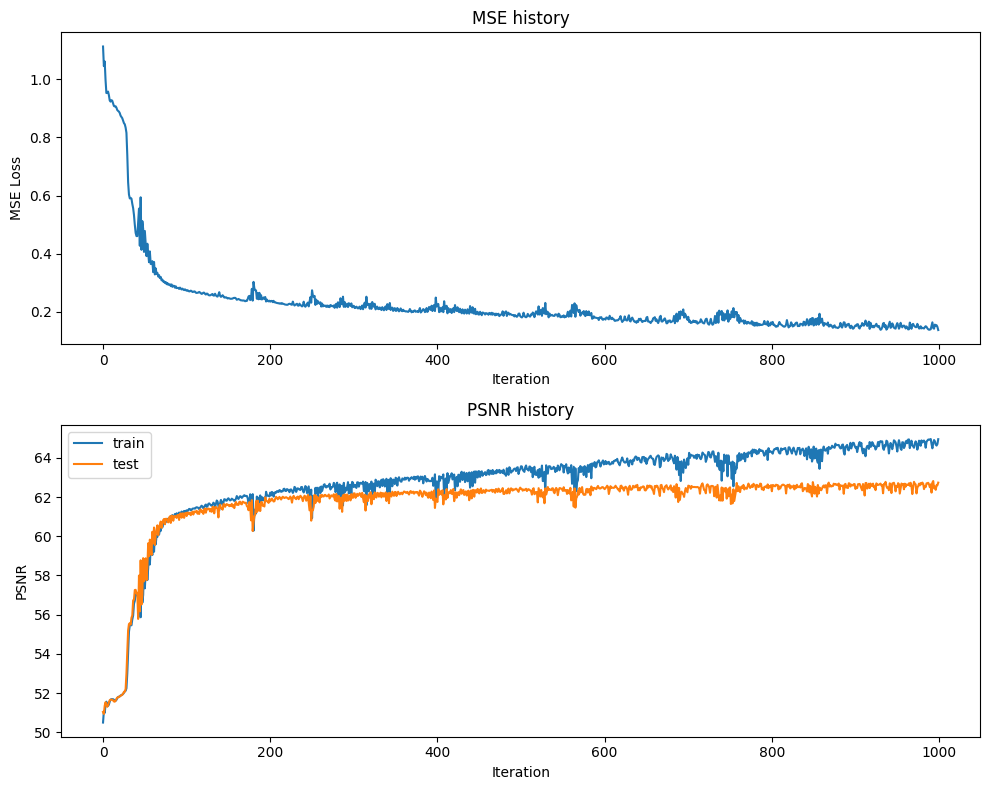

Final Test MSE 0.034632202425110385
Final Test psnr 62.73600249605559


<ipython-input-11-afe762edcc7f>:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, N+1, N+1)


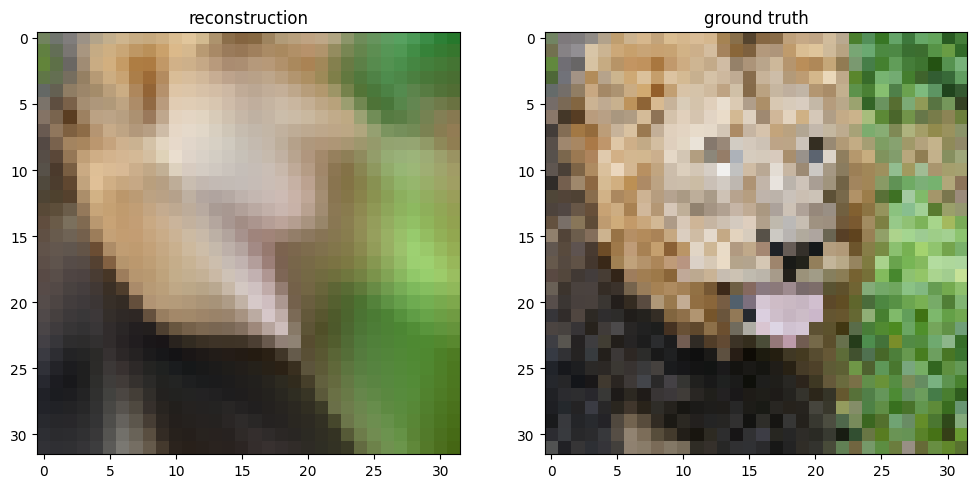

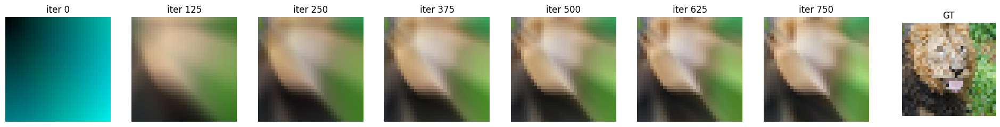

training basic


  0%|          | 0/1000 [00:00<?, ?it/s]

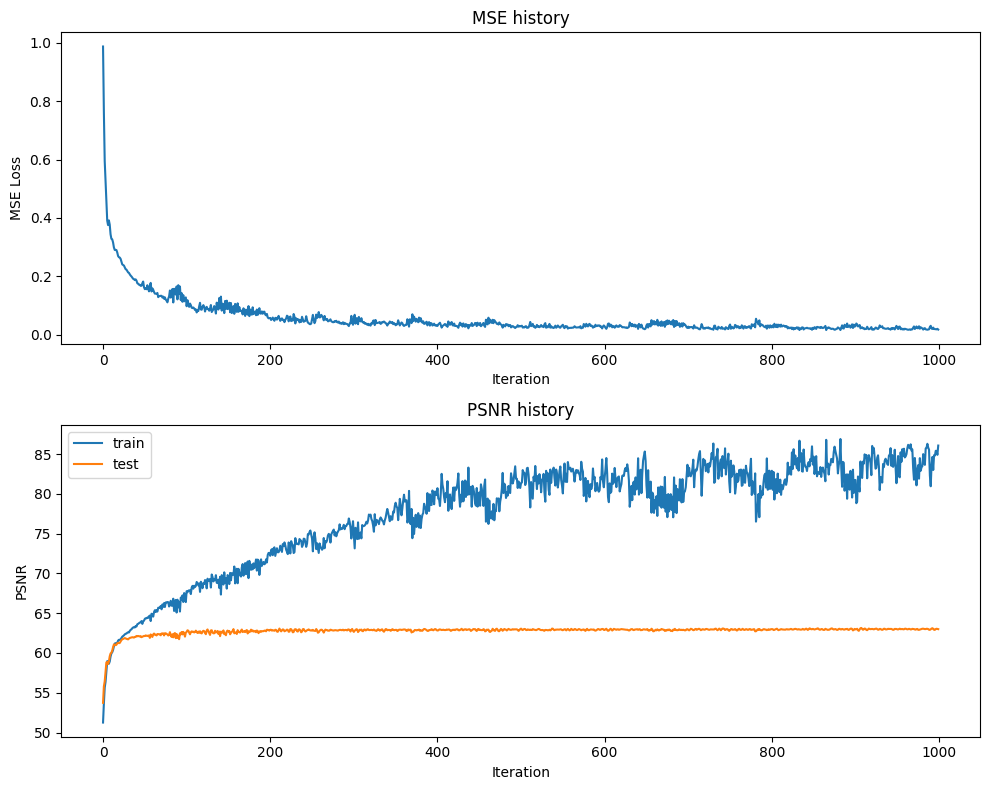

Final Test MSE 0.03261485321407469
Final Test psnr 62.99664932584318


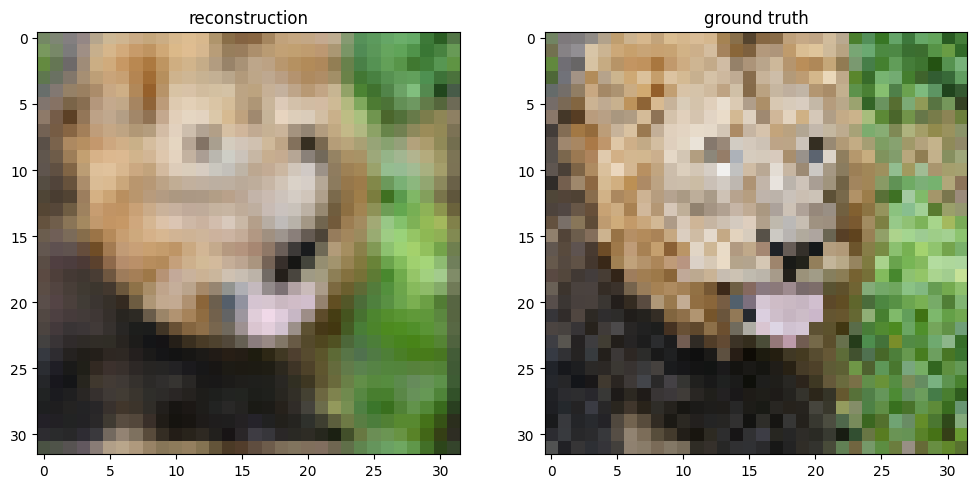

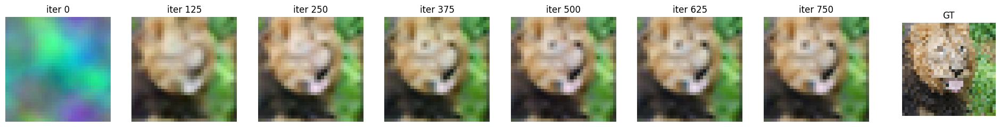

training gauss_1.0


  0%|          | 0/1000 [00:00<?, ?it/s]

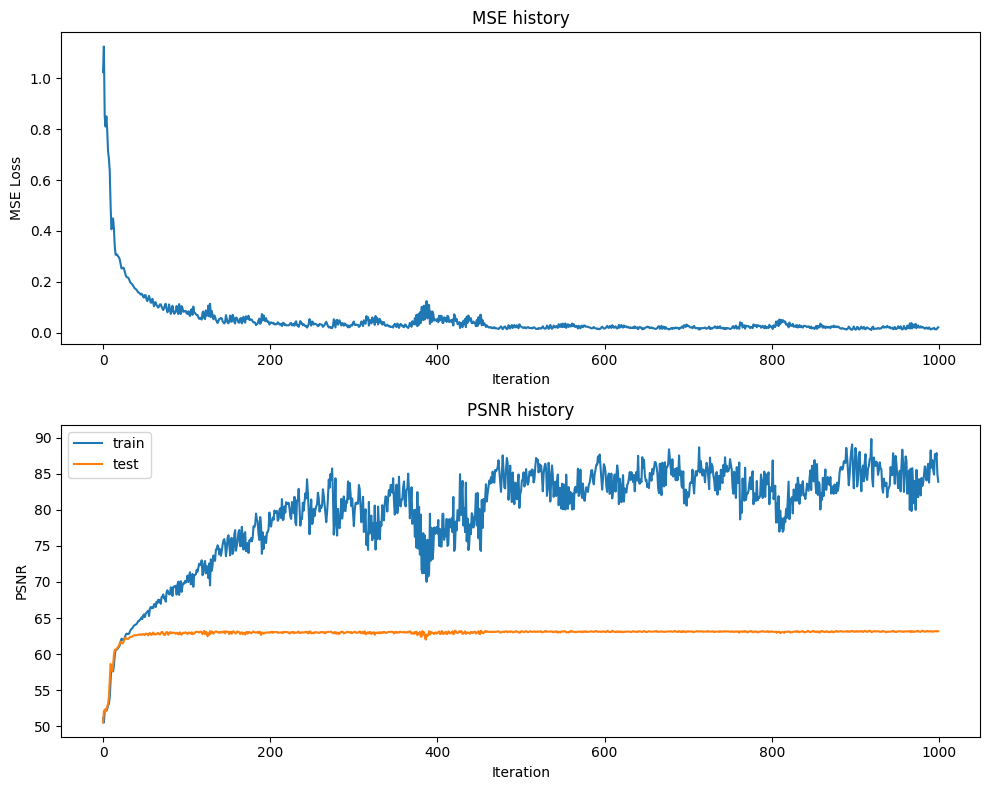

Final Test MSE 0.03134154601453561
Final Test psnr 63.16959945346014


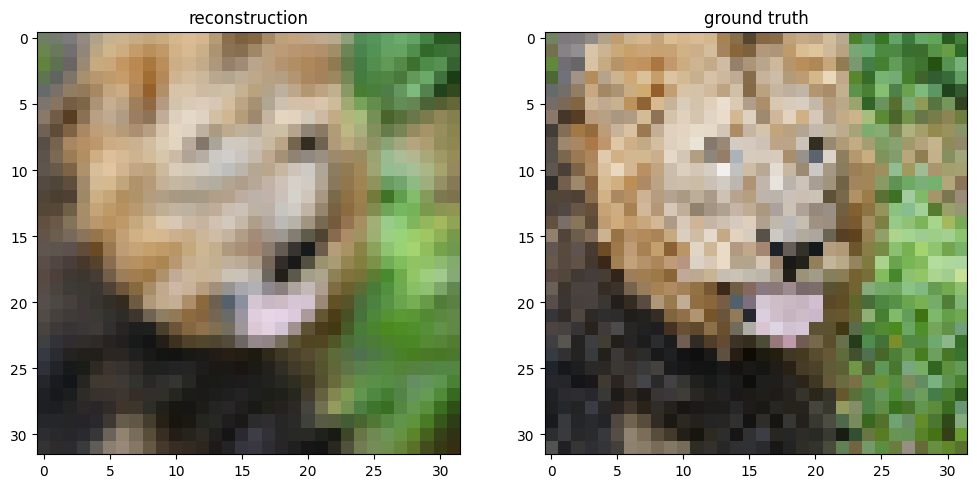

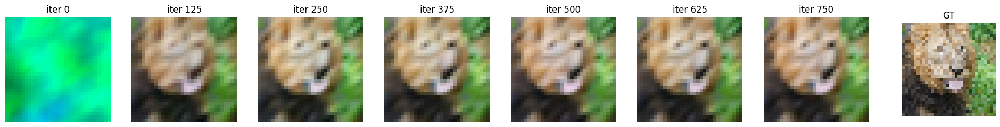

In [ ]:
### L1 loss ###

opt = "Adam"
outputs = {}
size = 32
for k in tqdm(B_dict):
  print("training", k)
  outputs[k] = train_wrapper(k, size, opt)

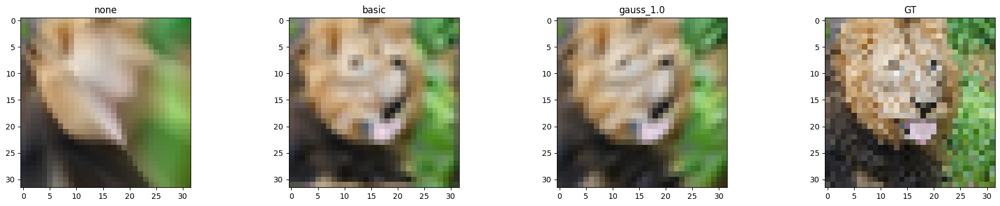

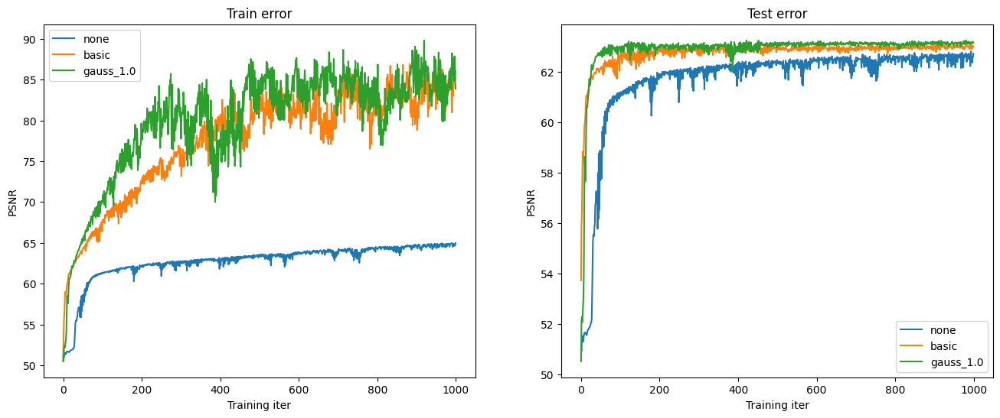

In [ ]:
### L1 loss ###

X_train, y_train, X_test, y_test = get_input_features(B_dict, "none")
plot_feature_mapping_comparison(outputs, y_test.reshape(size,size,3))

**Regularization** *(Implementation in neural_net.py file)*

  0%|          | 0/3 [00:00<?, ?it/s]

training none


  0%|          | 0/1000 [00:00<?, ?it/s]

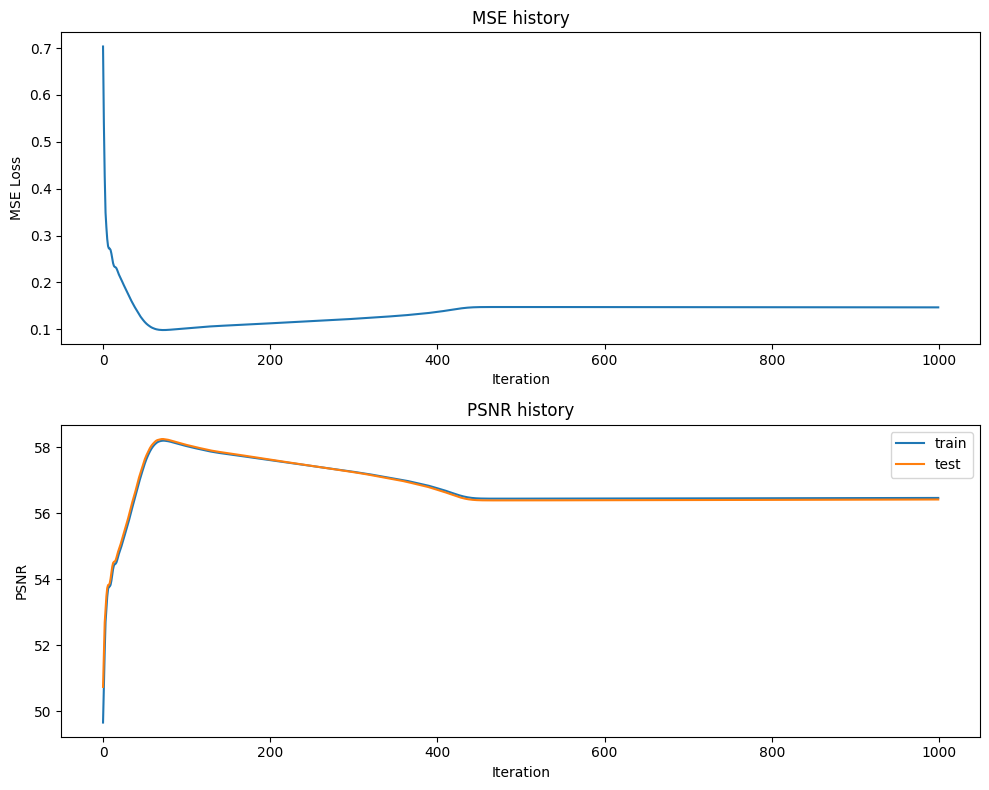

Final Test MSE 0.14853359783446302
Final Test psnr 56.41255660051531


<ipython-input-11-afe762edcc7f>:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, N+1, N+1)


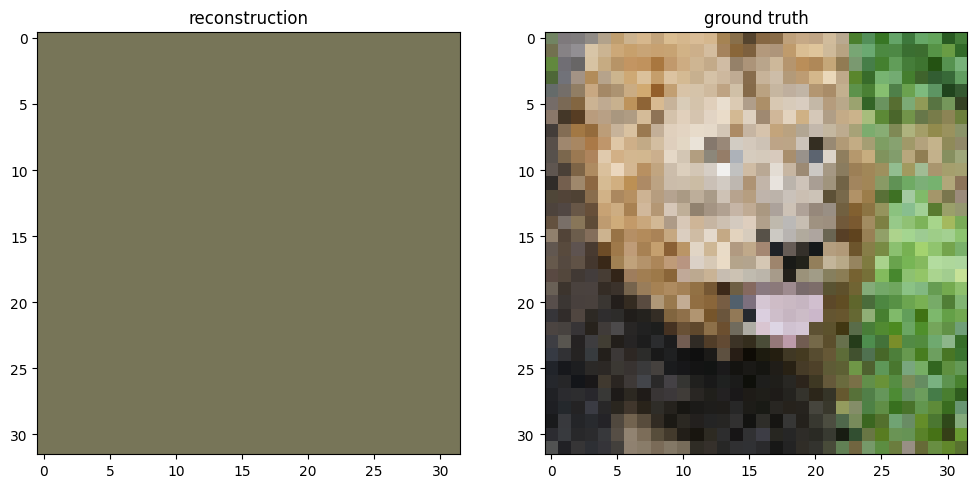

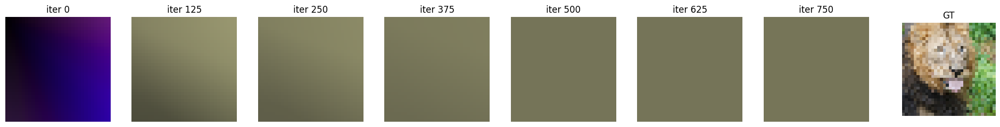

training basic


  0%|          | 0/1000 [00:00<?, ?it/s]

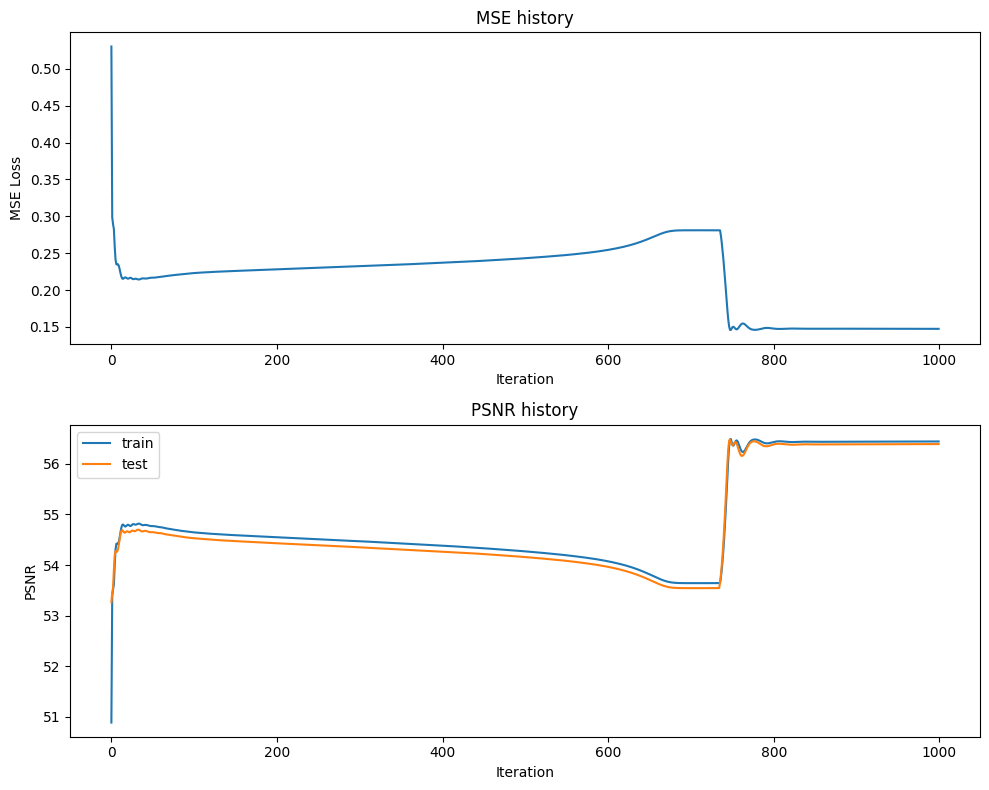

Final Test MSE 0.14922372026766184
Final Test psnr 56.39242497767766


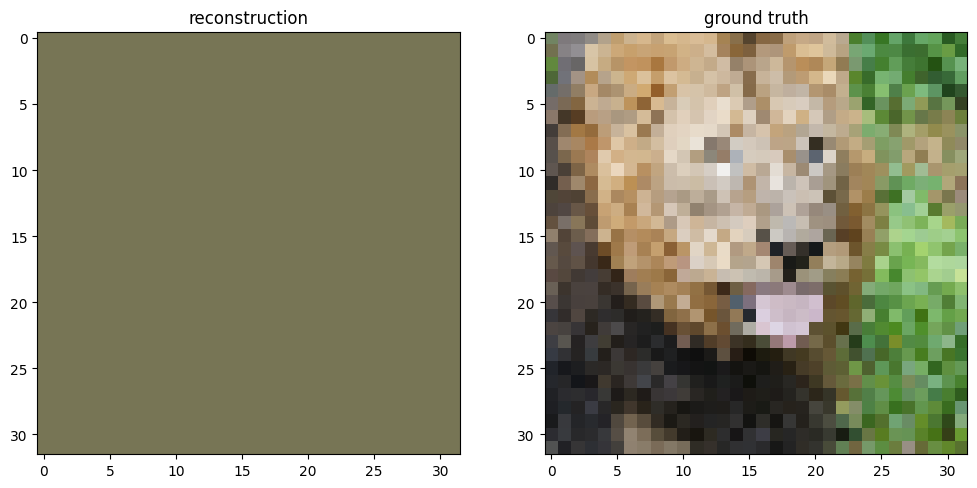

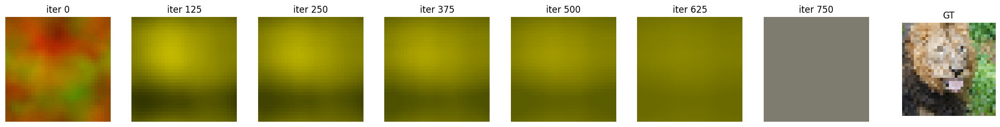

training gauss_1.0


  0%|          | 0/1000 [00:00<?, ?it/s]

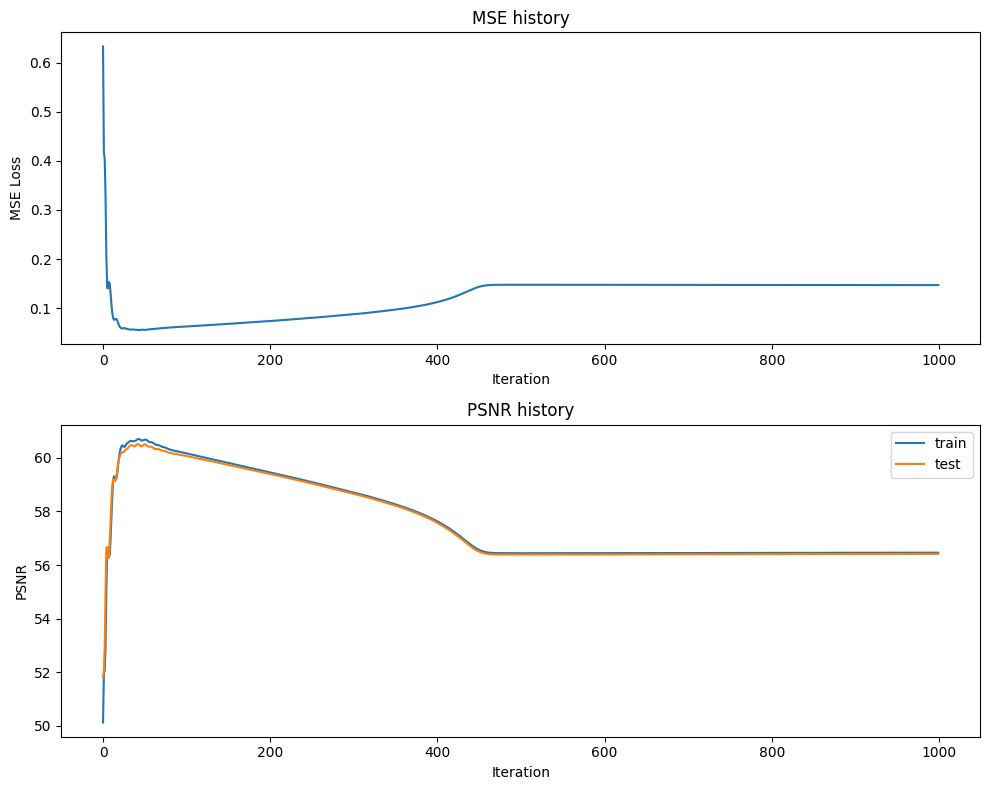

Final Test MSE 0.14847050866722855
Final Test psnr 56.41440164420394


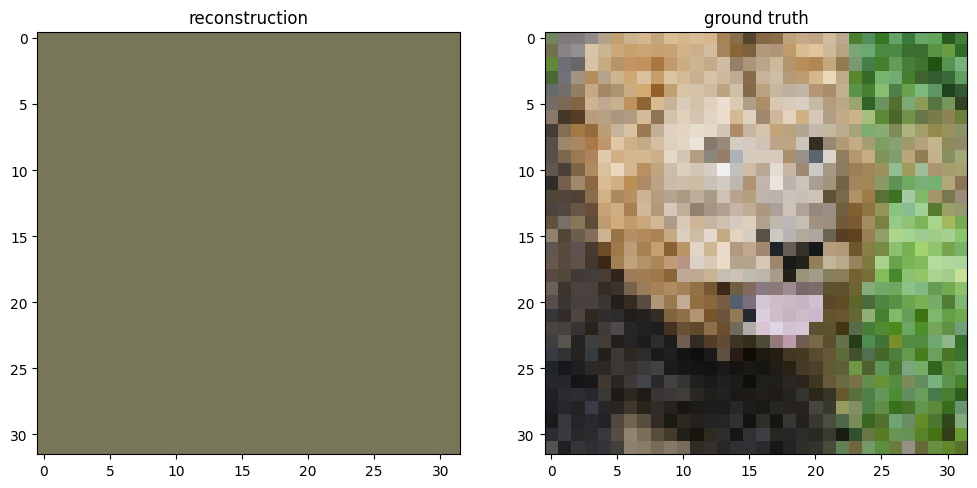

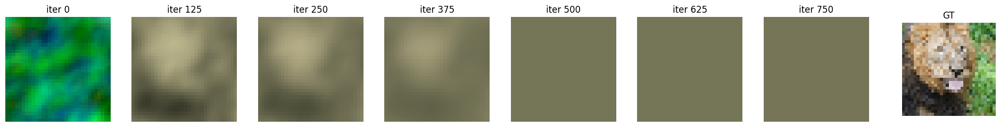

In [ ]:
### Lambda = 0.1

opt = "Adam"
outputs = {}
size = 32
for k in tqdm(B_dict):
  print("training", k)
  outputs[k] = train_wrapper(k, size, opt)

  0%|          | 0/3 [00:00<?, ?it/s]

training none


  0%|          | 0/1000 [00:00<?, ?it/s]

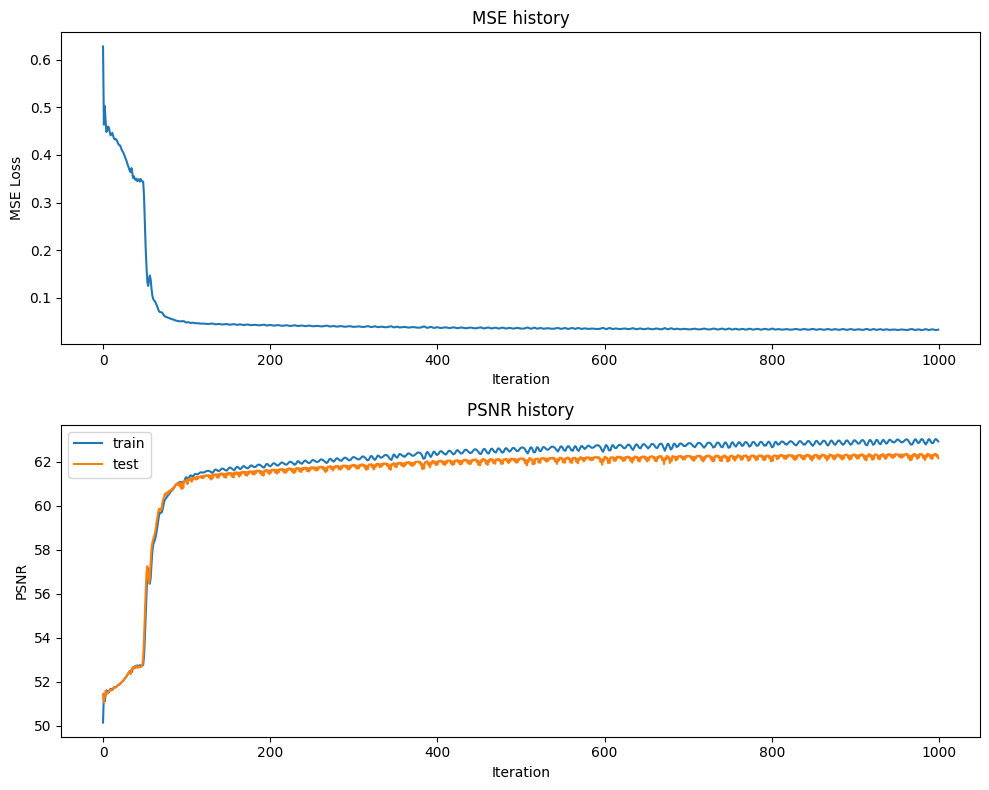

Final Test MSE 0.039528197660287395
Final Test psnr 62.161733482966724


<ipython-input-11-afe762edcc7f>:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, N+1, N+1)


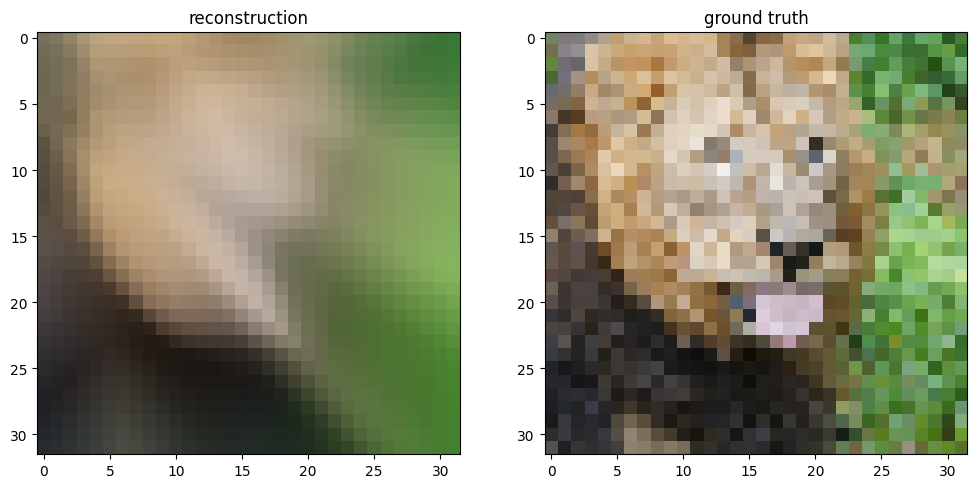

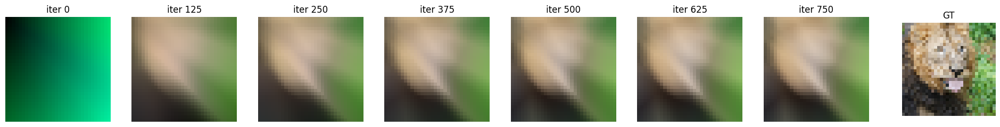

training basic


  0%|          | 0/1000 [00:00<?, ?it/s]

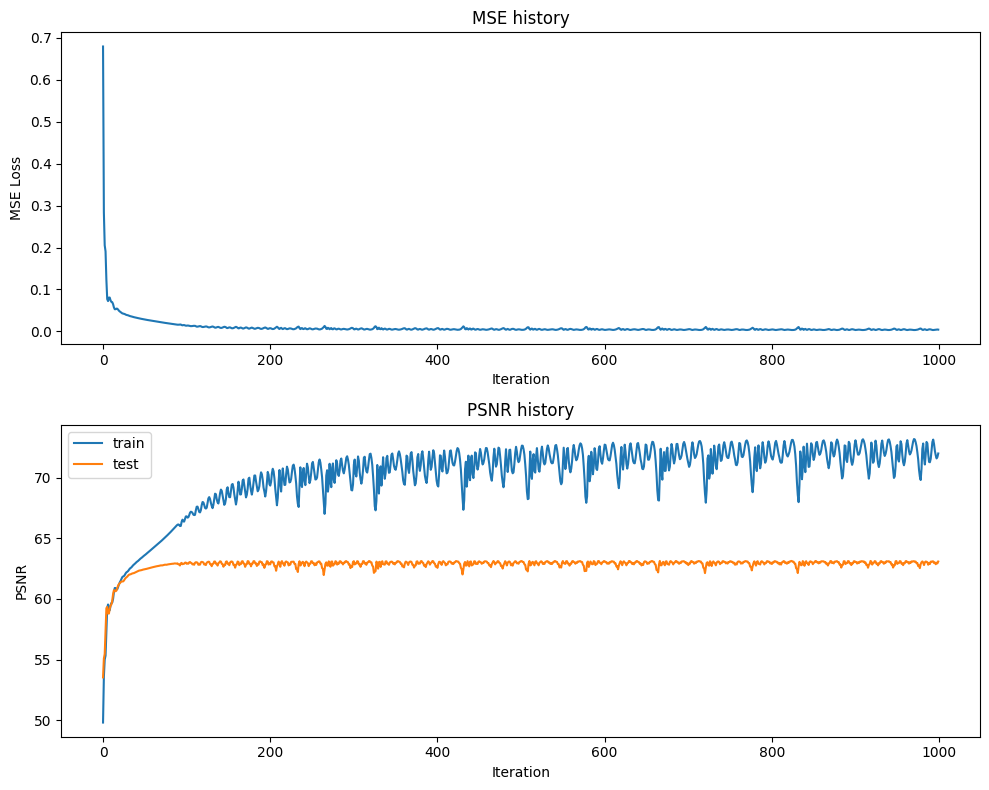

Final Test MSE 0.03192783324462799
Final Test psnr 63.089109143557565


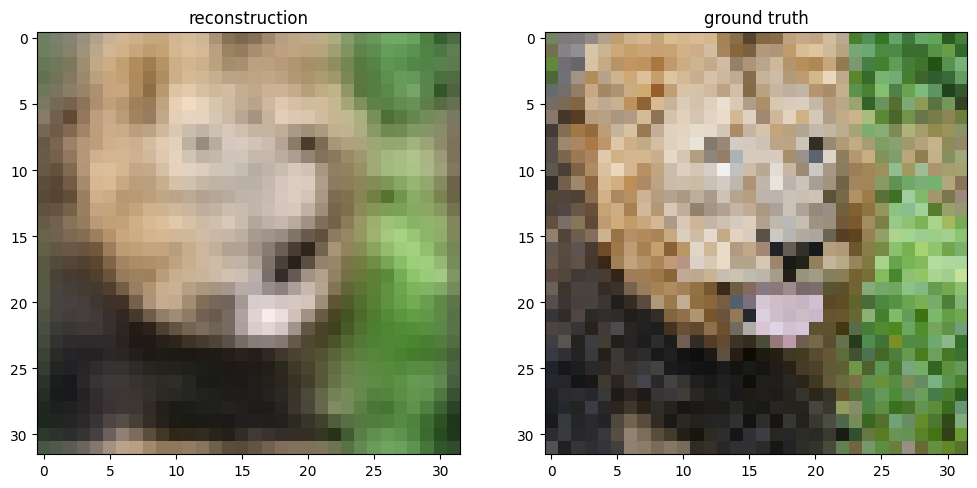

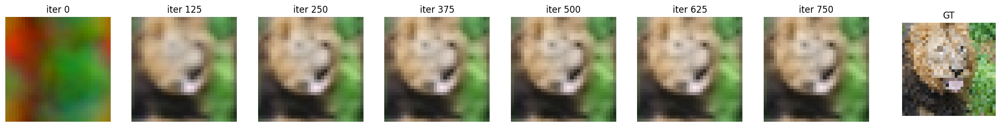

training gauss_1.0


  0%|          | 0/1000 [00:00<?, ?it/s]

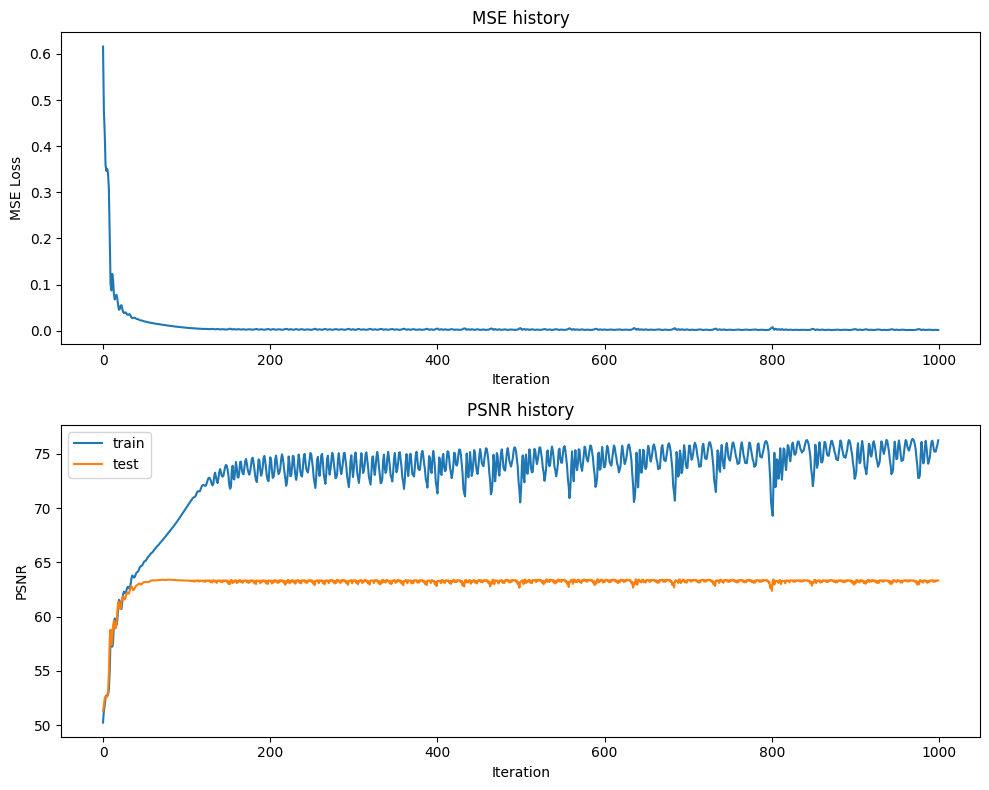

Final Test MSE 0.030208852180940812
Final Test psnr 63.32946136784762


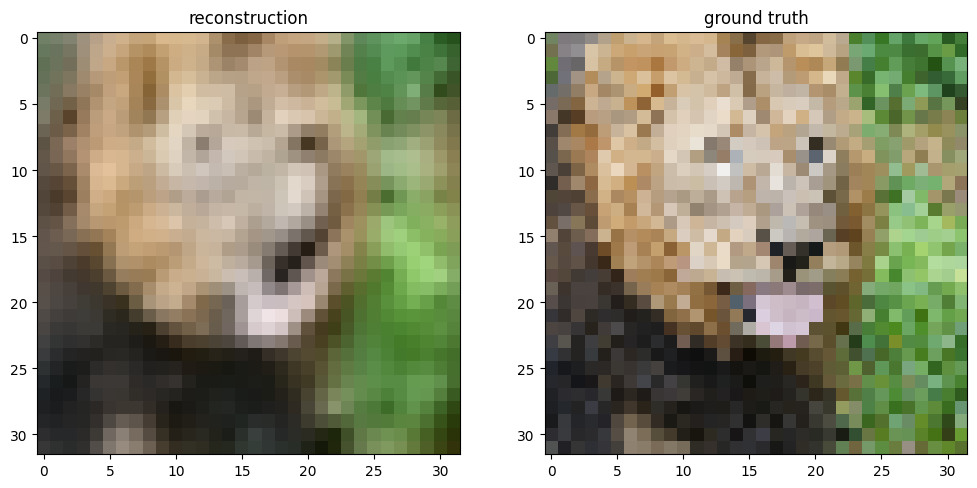

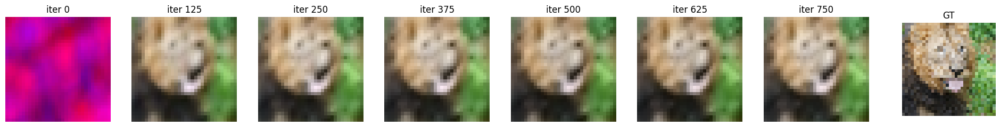

In [ ]:
### Lambda = 0.001

opt = "Adam"
outputs = {}
size = 32
for k in tqdm(B_dict):
  print("training", k)
  outputs[k] = train_wrapper(k, size, opt)

  0%|          | 0/3 [00:00<?, ?it/s]

training none


  0%|          | 0/1000 [00:00<?, ?it/s]

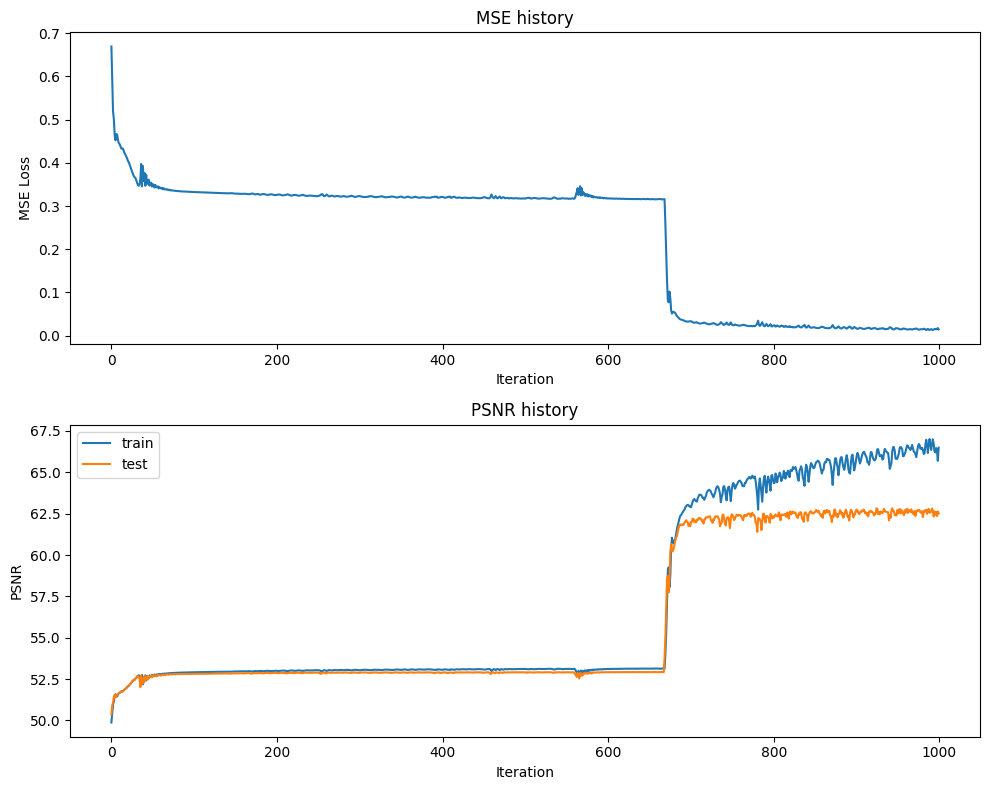

Final Test MSE 0.03638941823135055
Final Test psnr 62.52105248423578


<ipython-input-11-afe762edcc7f>:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, N+1, N+1)


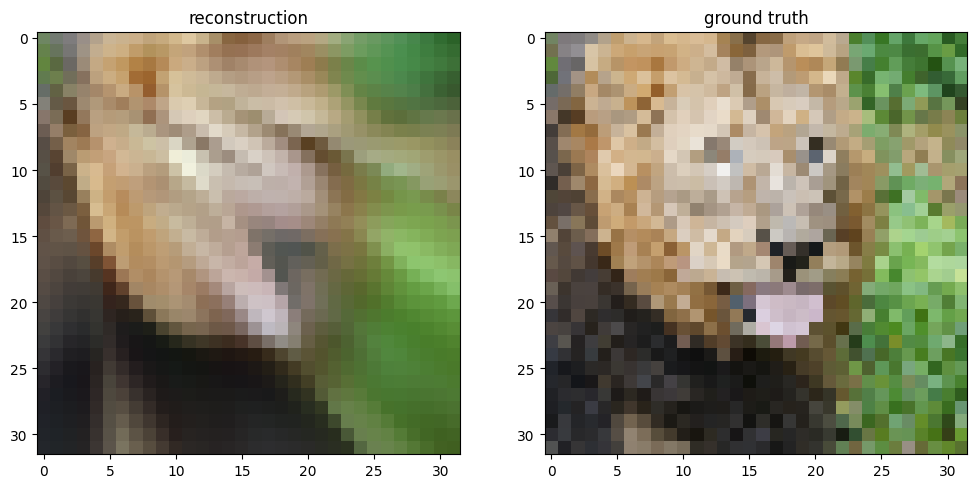

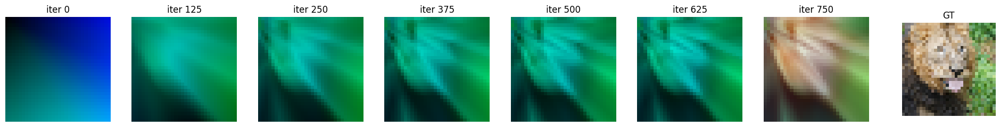

training basic


  0%|          | 0/1000 [00:00<?, ?it/s]

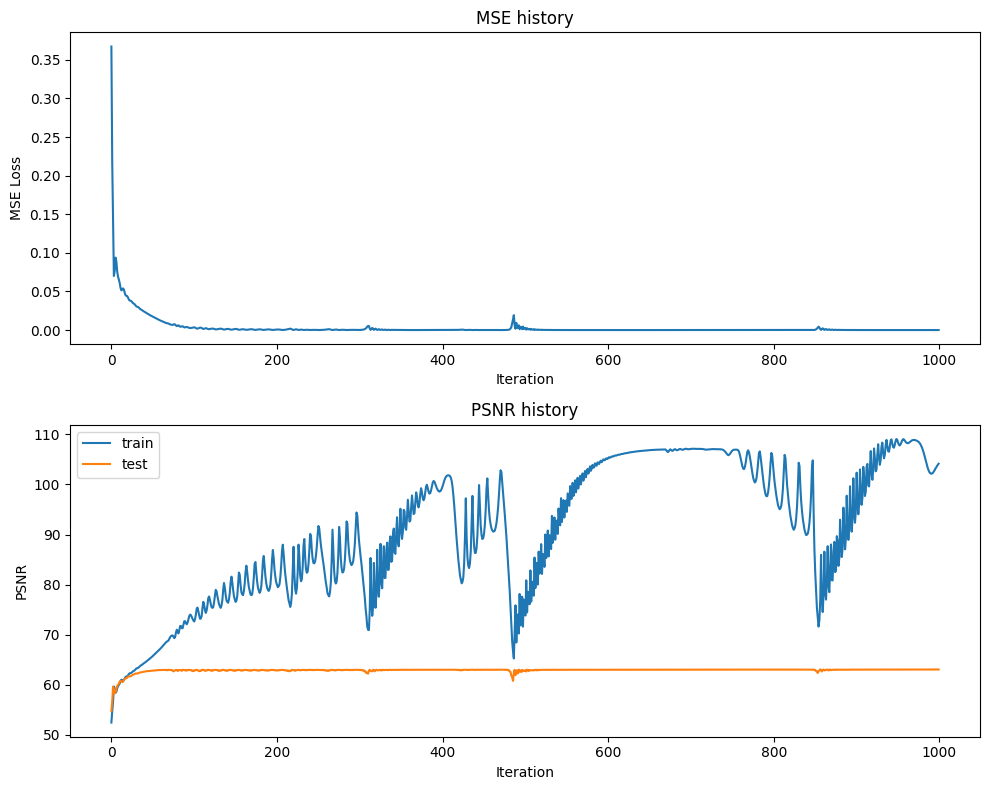

Final Test MSE 0.0320965269131806
Final Test psnr 63.06622319866307


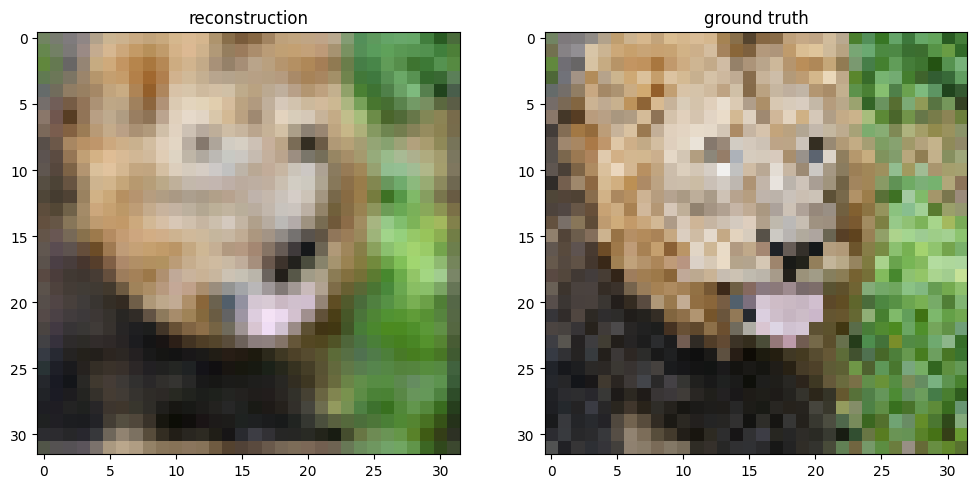

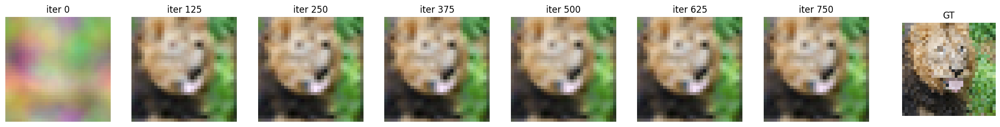

training gauss_1.0


  0%|          | 0/1000 [00:00<?, ?it/s]

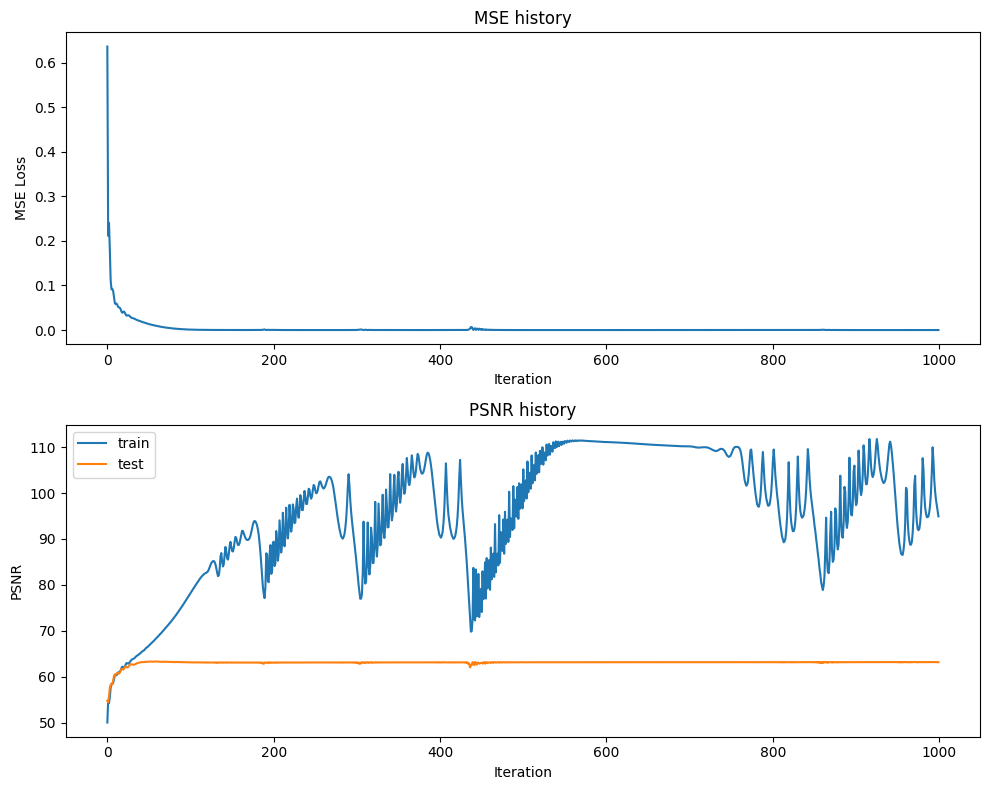

Final Test MSE 0.031050064487860525
Final Test psnr 63.21017854368422


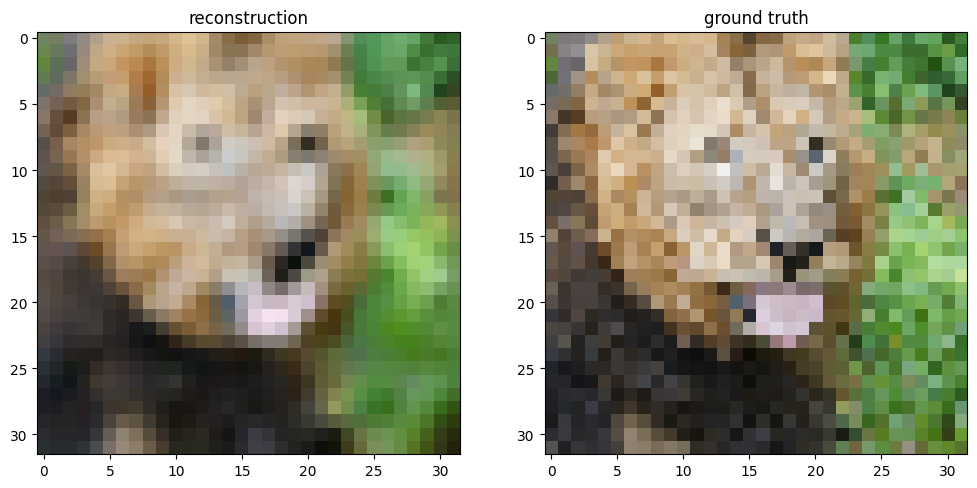

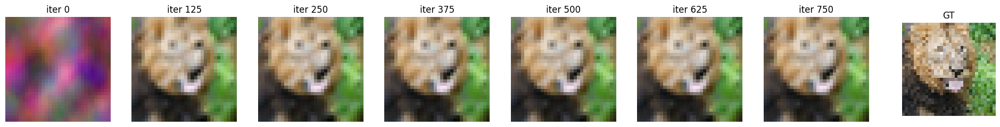

In [ ]:
### Lambda = 0.00001

opt = "Adam"
outputs = {}
size = 32
for k in tqdm(B_dict):
  print("training", k)
  outputs[k] = train_wrapper(k, size, opt)

**Normalization**

In [ ]:
### input normalization ###

def train_wrapper_norm(mapping, size, opt):
  # TODO implement
  # makes it easy to run all your mapping experiments in a for loop
  # this will similar to what you did previously in the last two sections

  # get input features
  # TODO implement this by using the get_B_dict() and get_input_features() helper functions
  num_layers = 5
  hidden_size = 256
  hidden_sizes = [hidden_size] * (num_layers - 1)
  epochs = 1000
  learning_rate = 1e-3
  input_size = 2
  output_size = 3
  B_dict = get_B_dict(size)
  X_train, y_train, X_test, y_test = get_input_features(B_dict, mapping)

  ## normalization
  # zero centering
  mean_X_train = np.sum(X_train, axis=0) / X_train.shape[0]
  X_train = X_train - mean_X_train
  mean_X_test = np.sum(X_test, axis=0) / X_test.shape[0]
  X_test = X_test - mean_X_test
  # rescaling
  std_X_train = (np.sum(X_train ** 2, axis=0) / X_train.shape[0]) ** 0.5
  X_train = X_train / std_X_train
  std_X_test = (np.sum(X_test ** 2, axis=0) / X_test.shape[0]) ** 0.5
  X_test = X_test / std_X_test

  # run NN experiment on input features
  net, train_psnrs, test_psnrs, train_loss, predicted_images = NN_experiment(X_train, y_train, X_test, y_test, np.shape(X_train)[-1], num_layers,\
                    hidden_size, hidden_sizes, np.shape(y_train)[-1], epochs,\
                    learning_rate, opt)

  # TODO implement by using the NN_experiment() helper function

  # plot results of experiment
  plot_training_curves(train_loss, train_psnrs, test_psnrs)
  plot_reconstruction(net.forward(X_test), y_test)
  plot_reconstruction_progress(predicted_images, y_test)

  return {
      'net': net,
      'train_psnrs': train_psnrs,
      'test_psnrs': test_psnrs,
      'train_loss': train_loss,
      'pred_imgs': predicted_images
  }

  0%|          | 0/3 [00:00<?, ?it/s]

training none


  0%|          | 0/1000 [00:00<?, ?it/s]

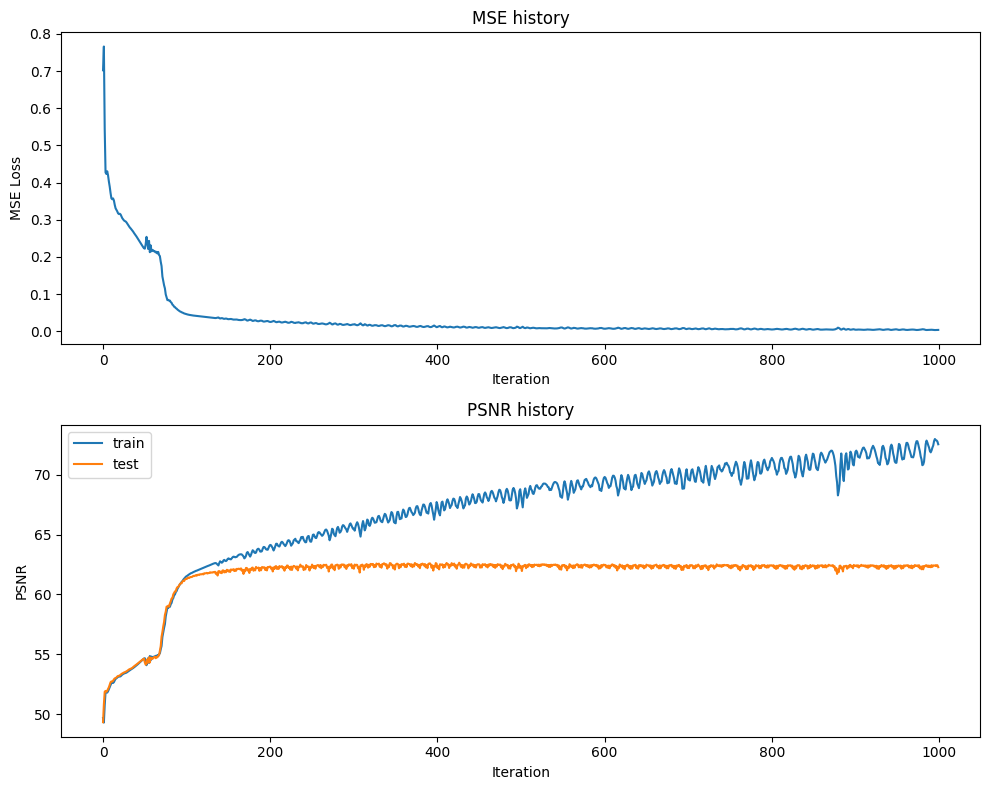

Final Test MSE 0.03842867693016194
Final Test psnr 62.284249285716925


<ipython-input-11-afe762edcc7f>:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, N+1, N+1)


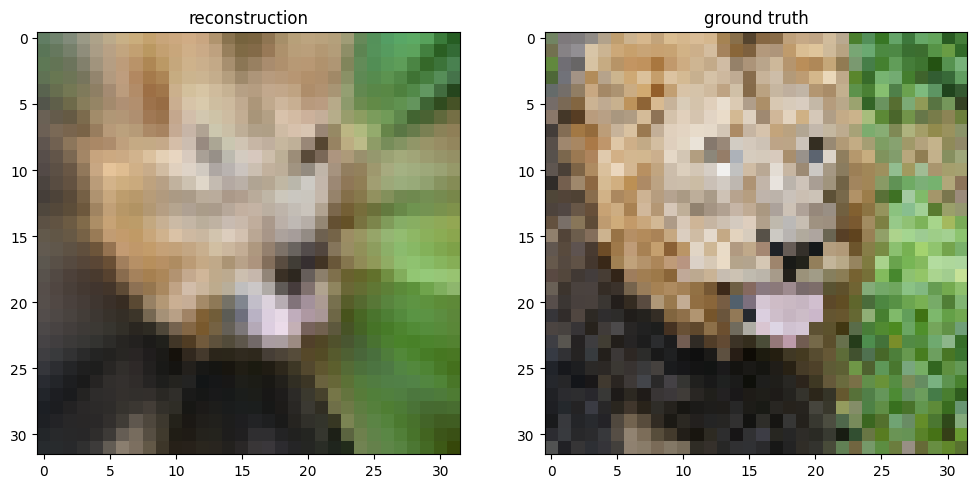

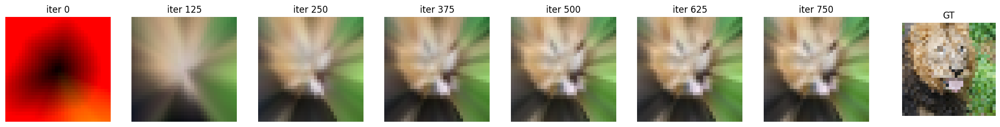

training basic


  0%|          | 0/1000 [00:00<?, ?it/s]

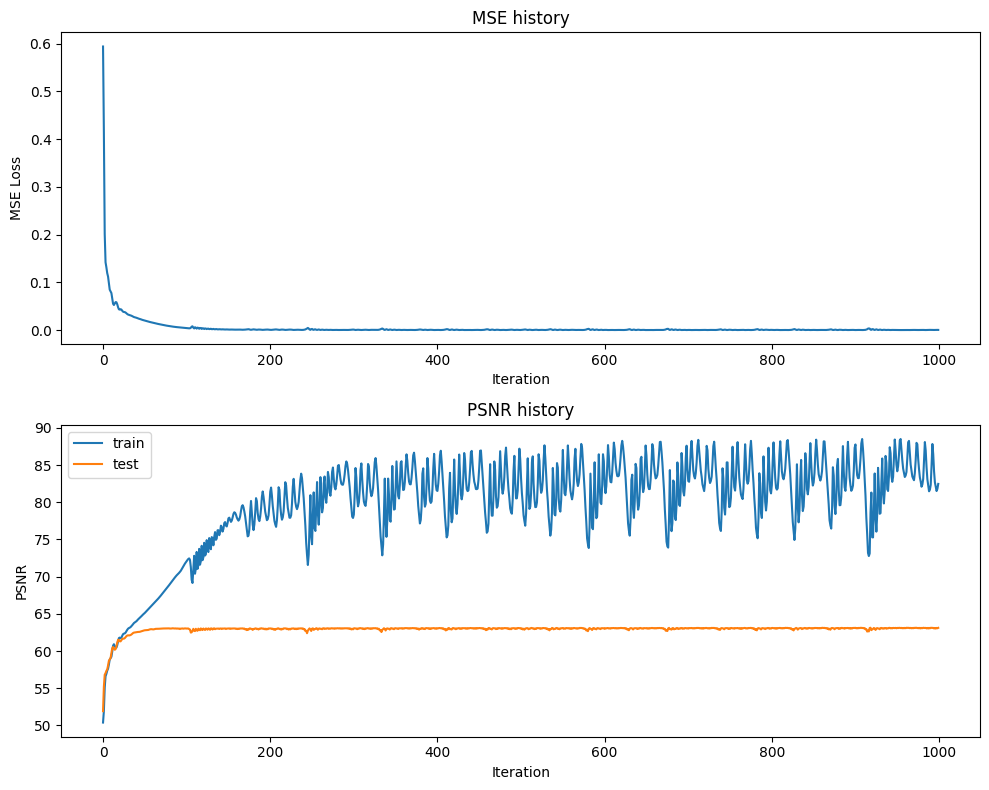

Final Test MSE 0.03169455826288896
Final Test psnr 63.120956576176745


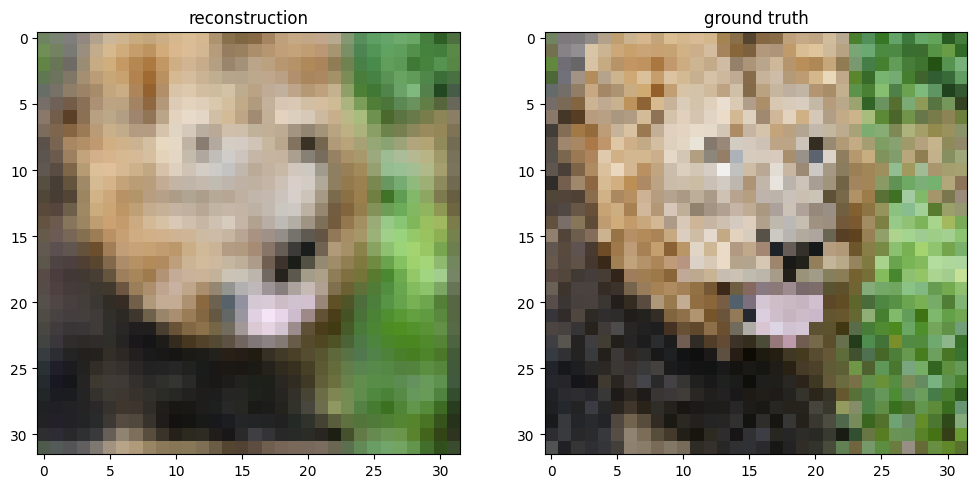

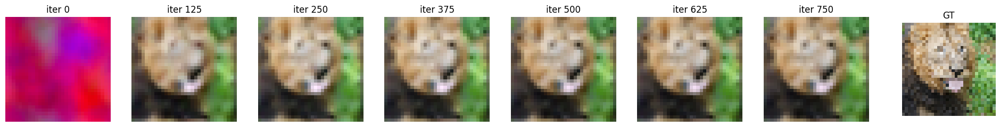

training gauss_1.0


  0%|          | 0/1000 [00:00<?, ?it/s]

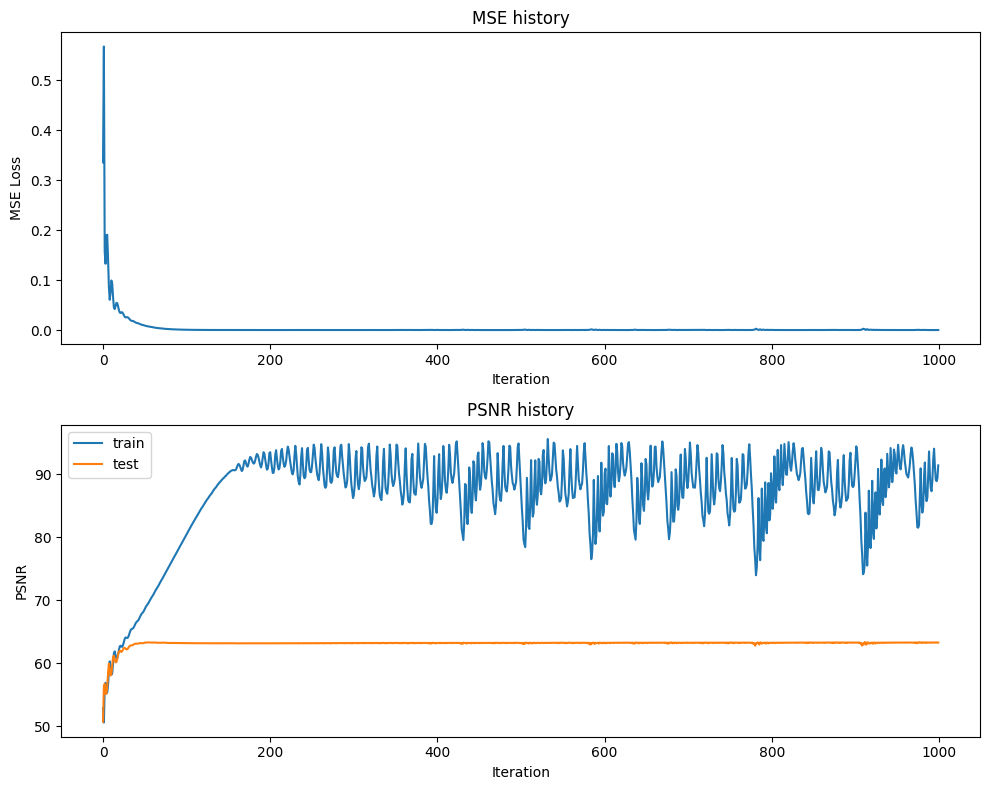

Final Test MSE 0.030477532349949543
Final Test psnr 63.29100559951798


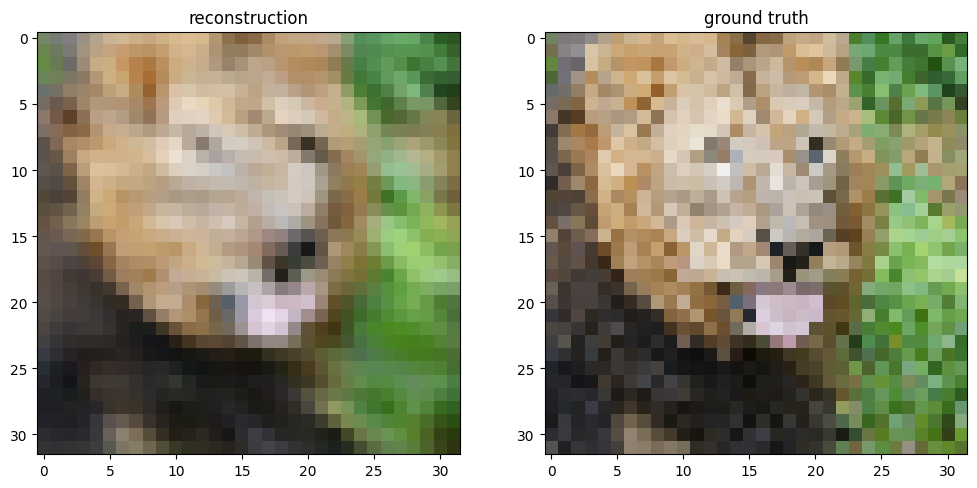

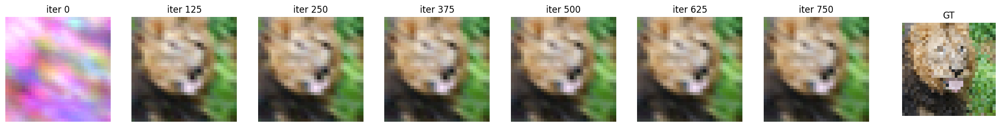

In [ ]:
### input normalization ###

opt = "Adam"
outputs = {}
size = 32
for k in tqdm(B_dict):
  print("training", k)
  outputs[k] = train_wrapper_norm(k, size, opt)

# Extra Credit 4: PyTorch implementation

In [ ]:
import torch
import torch.nn as nn

<ipython-input-4-47d50880e2e8>:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(image_url)[..., :3] / 255.


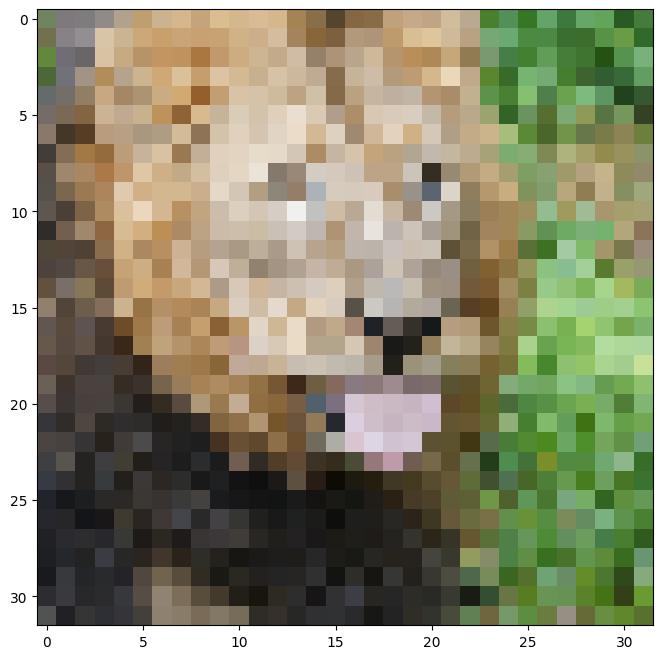

In [ ]:
### load dataset ###
size = 32
train_data, test_data = get_image(size)

  0%|          | 0/3 [00:00<?, ?it/s]

training none


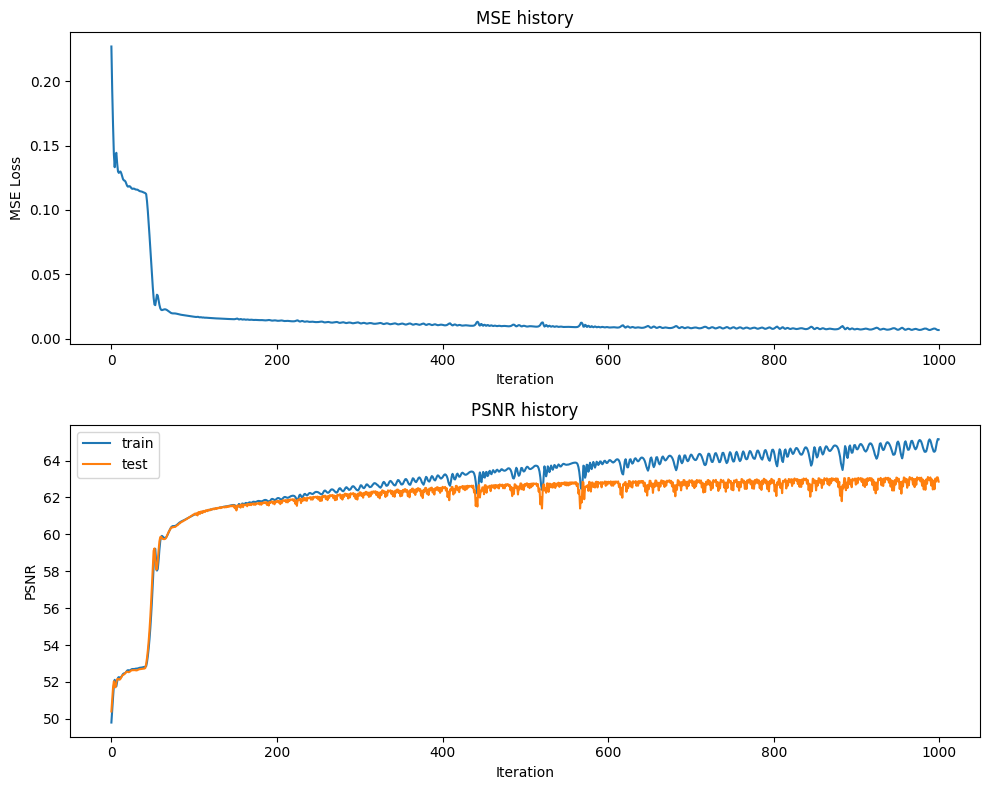

Final Test MSE 0.033661819994449615
Final Test psnr 62.859427675828734


<ipython-input-11-afe762edcc7f>:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, N+1, N+1)


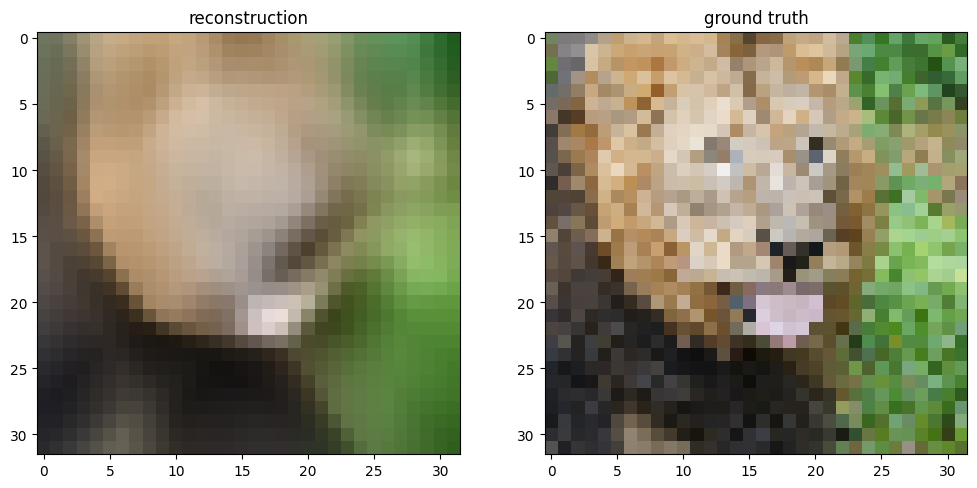

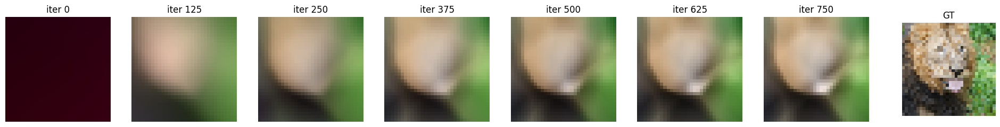

training basic


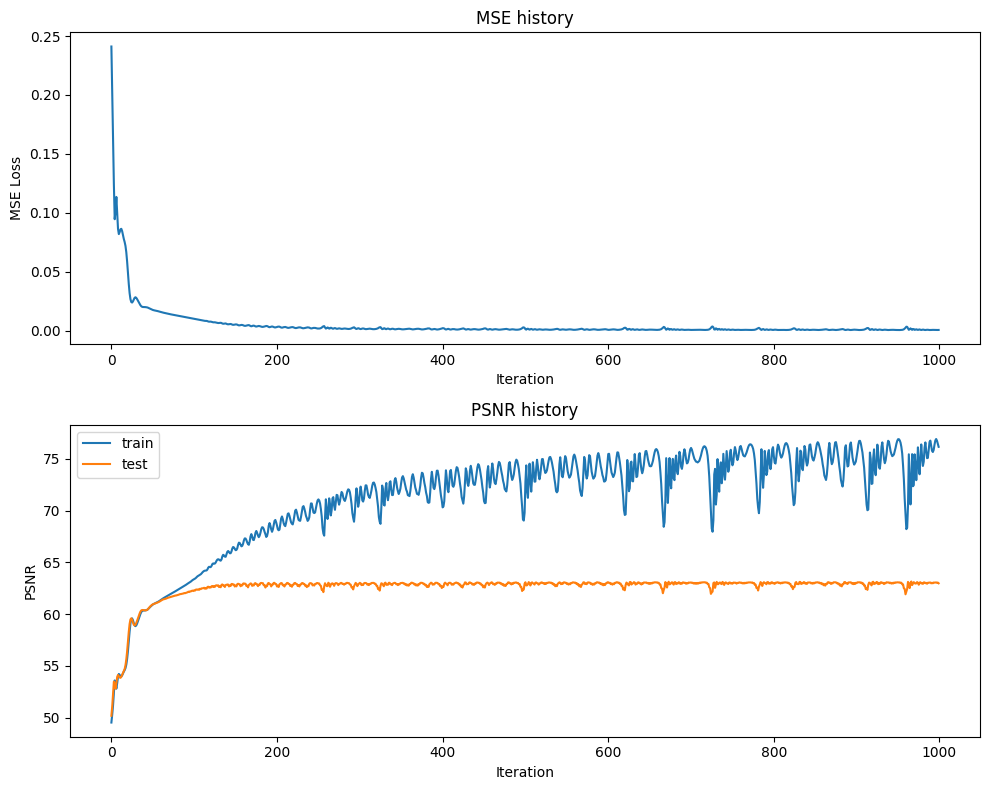

Final Test MSE 0.0326896607875824
Final Test psnr 62.98669946829159


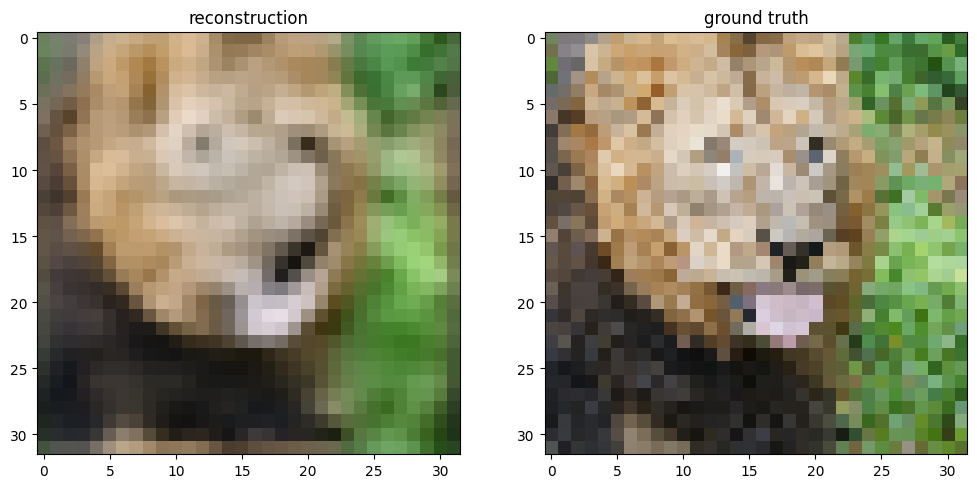

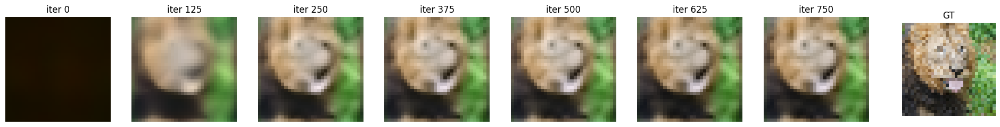

training gauss_1.0


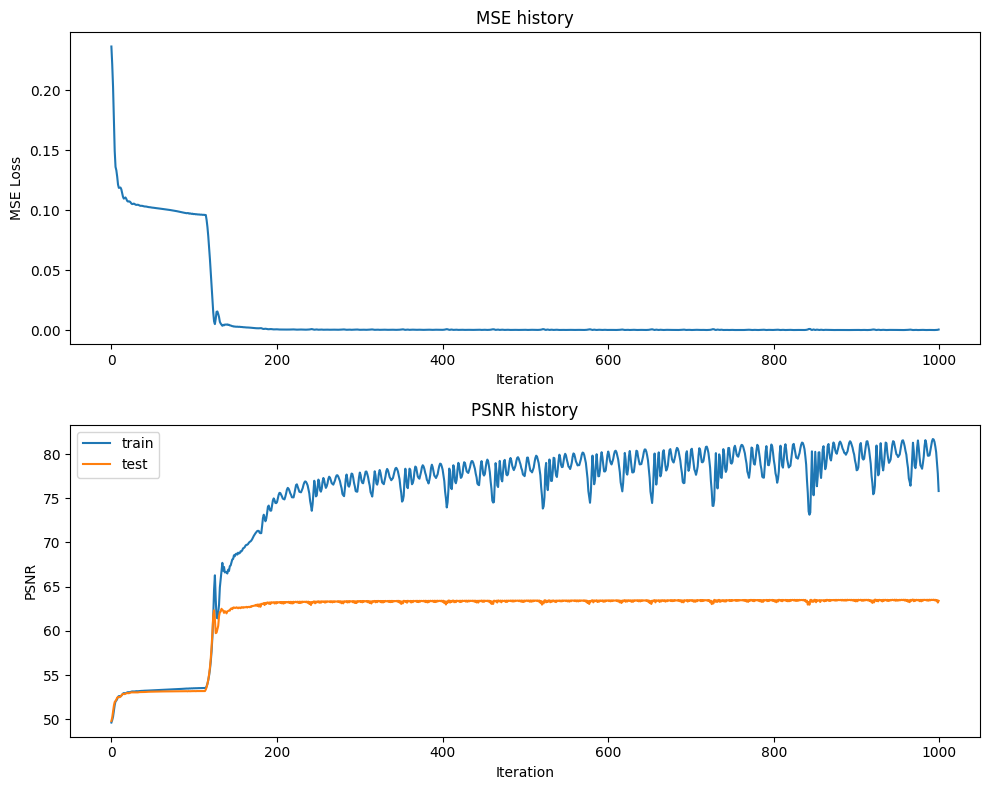

Final Test MSE 0.029729943722486496
Final Test psnr 63.39886273763098


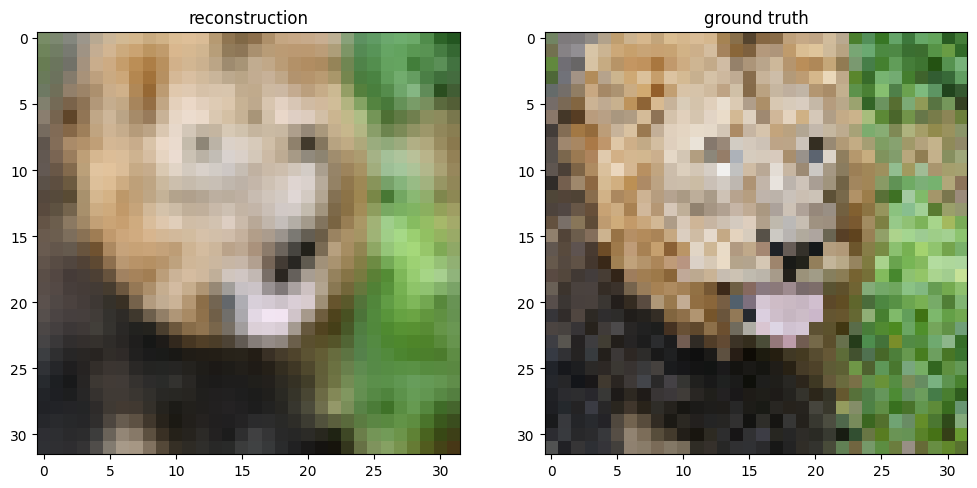

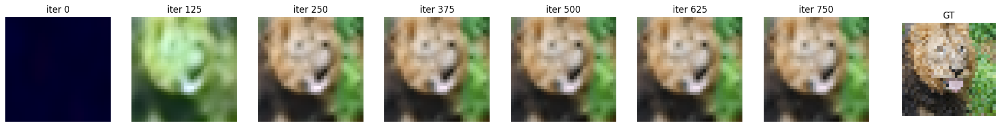

In [ ]:
## hyperparameters
epochs = 1000

for k in tqdm(B_dict):
  print("training", k)

  ## get dataset
  X_train, y_train, X_test, y_test = get_input_features(B_dict, k)
  X_train = torch.tensor(X_train, dtype=torch.float32)
  y_train = torch.tensor(y_train, dtype=torch.float32)
  X_test = torch.tensor(X_test, dtype=torch.float32)
  y_test = torch.tensor(y_test, dtype=torch.float32)

  ## for visualization
  train_loss = np.zeros(epochs)
  test_loss = np.zeros(epochs)
  train_psnr = np.zeros(epochs)
  test_psnr = np.zeros(epochs)
  predicted_images = np.zeros((epochs, y_test.shape[0], y_test.shape[1]))

  ## initialize model
  model = NeuralNetwork(X_train.shape[-1])
  loss_fn = nn.MSELoss()
  optimizer = torch.optim.Adam(
    model.parameters(),
    lr=0.001,
    betas=(0.9, 0.999),
    eps=1e-08,
    weight_decay=0.0001)

  ## train model
  for epoch in range(epochs):
    model.train()

    ## shuffle dataset
    permutation = np.random.permutation(X_train.shape[0])
    X_use = X_train[permutation]
    y_use = y_train[permutation]

    train_pred = model(X_use)
    loss = loss_fn(train_pred, y_use)

    ## store loss
    train_loss[epoch] = torch.sum(loss).detach().numpy()
    train_psnr[epoch] = psnr(y_use.detach().numpy(), train_pred.detach().numpy())

    ## gradient descent
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    ## test model
    with torch.no_grad():
      test_pred = model(X_test)
      loss = loss_fn(test_pred, y_test)

      ## store loss
      test_loss[epoch] = torch.sum(loss).detach().numpy()
      test_psnr[epoch] = psnr(y_test.detach().numpy(), test_pred.detach().numpy())
      predicted_images[epoch] = test_pred.detach().numpy()

  ## visualization
  with torch.no_grad():
    plot_training_curves(train_loss, train_psnr, test_psnr)
    plot_reconstruction(model.forward(X_test).numpy(), y_test.numpy())
    X_train, y_train, X_test, y_test = get_input_features(B_dict, k)
    plot_reconstruction_progress(predicted_images, y_test)

# Reconstruction Process Video (Optional)
(For Fun!) Visualize the progress of training in a video

In [40]:
# requires installing this additional dependency
!pip install imageio-ffmpeg

In [43]:
# single video example
predicted_images = outputs["gauss_1.0"]['pred_imgs']
create_and_visualize_video({"gauss": {"pred_imgs": predicted_images}}, size=128, filename="training_high_res_gauss.mp4")

In [46]:
# single video example
predicted_images = outputs["gauss_1.0"]['pred_imgs']
create_and_visualize_video({"gauss": {"pred_imgs": predicted_images}}, size=128, filename=".mp4")

In [ ]:
# multi video example
create_and_visualize_video(outputs, epochs=1000, size=32)

In [53]:
%%capture

from google.colab import drive
drive.mount('/content/drive')
# install tex; first run may take several minutes
! apt-get install texlive-xetex
# file path and save location below are default; please change if they do not match yours
! jupyter nbconvert --output-dir='/content/drive/MyDrive/' '/content/drive/MyDrive/Colab Notebooks/CS 444 Assignment-1.ipynb' --to pdf